In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import keras 
import tensorflow as tf
from discrete_methods import *
import json
from IPython.display import Audio
import itertools
import multiprocessing

# 2 Stock's returns as Binomial process

We simulate returns as Binomial processes taking value $u$ with probability $p$ and value $d$ with probability $1-p$. We always have $u>d$.

Each stock can have different $u$, $d$ or $p$.

The action space corresponds to the weight invested in the first stock $a \in \{0.0,0.1,\ldots,0.9,1.0\}$, the remaining percentage $1-a$ is invested in second stock.

The reward function is again the immediate log-return of the portfolio defined by the action $w$.

#### Impact of decay rate in Q-Learning algorithm

We define the learning rate of the Q-Learning as follow for a decay rate $\lambda$, a constant $\beta$ and another constant as power $\tau$, for $t\geq 1$:

\begin{equation*}
    \alpha_t = \beta + \frac{1}{1+(\lambda \cdot t)^\tau}
\end{equation*}

If not specified, $\beta=0$ and $\tau = 1$.

Otherwise, its adaptive version $\forall s \in \mathcal{S}$ :

\begin{equation*}
    \alpha_t(s) = \frac{1}{1+(\lambda \cdot n_s(t))^\tau}
\end{equation*}

The adaptive learning rate depends on states, hence for the $n$-th time we see some state, the learning rate applied to its q-values estimate will be the same. This becomes useful for states which appear very rarely compared to other states. If we use the previous formulation of learning rates, the first time we would see some state, the step size of the Q-Learning update would already be really low.

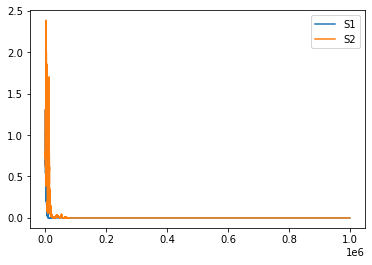

In [3]:
np.random.seed(39218)
simplebin=SimpleBinomial(1.02,0.98,0.5)
Nsample=1000000
ret=simplebin.simulate(Nsample+1)
plt.plot(np.cumprod(ret[0,:]))
plt.plot(np.cumprod(ret[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [4]:
true_qval=simplebin.true_qval(1e-12)

Time needed to converge with delta =  1e-12  :  914


In [4]:
true_qval

{'[1.02, 1.02]': array([-0.00510102, -0.00506501, -0.005037  , -0.005017  , -0.005005  ,
        -0.005001  , -0.005005  , -0.005017  , -0.005037  , -0.00506501,
        -0.00510102]),
 '[1.02, 0.98]': array([-0.00510102, -0.00506501, -0.005037  , -0.005017  , -0.005005  ,
        -0.005001  , -0.005005  , -0.005017  , -0.005037  , -0.00506501,
        -0.00510102]),
 '[0.98, 1.02]': array([-0.00510102, -0.00506501, -0.005037  , -0.005017  , -0.005005  ,
        -0.005001  , -0.005005  , -0.005017  , -0.005037  , -0.00506501,
        -0.00510102]),
 '[0.98, 0.98]': array([-0.00510102, -0.00506501, -0.005037  , -0.005017  , -0.005005  ,
        -0.005001  , -0.005005  , -0.005017  , -0.005037  , -0.00506501,
        -0.00510102])}

In [5]:
for k in true_qval.keys():
    print(k, ' Optimal action : ',np.argmax(true_qval[k]))

[1.02, 1.02]  Optimal action :  5
[1.02, 0.98]  Optimal action :  5
[0.98, 1.02]  Optimal action :  5
[0.98, 0.98]  Optimal action :  5


# Optimal policy :
In this case, since transitions doesn't depend on the current state and action. The optimal action will be the same for all states and corresponds to the one maximizing 
\begin{equation*}
    \max_a \ \mathbb{E}_{p(s'\mid s,a)}\big[r(s,a,s')\big]
\end{equation*}

We can compute the expected directly using :
\begin{equation*}
\begin{split}
    \mathbb{E}_{p(s'\mid s,a)}\big[r(s,a,s')\big]&= p^2 \cdot \Big(\log(u) + \log(d) + \log(a \cdot d + (1-a) \cdot u) +  \log(a \cdot u + (1-a) \cdot d)\Big) \\
    &= p^2 \cdot \log(u\cdot d) + p^2 \cdot \log\big((u -(u-d)\cdot a) \cdot (d + (u-d)\cdot a) \big)
    \end{split}
\end{equation*}

We have $p=0.5$, $u=1.02$ and $0.98$, hence taking the derivative and finding its zero to get optimal action leads to :
\begin{equation*}
\begin{split}
    0 &= \frac{-d\cdot (u-d) + u \cdot (u-d) -2 \cdot (u-d)^2\cdot a}{(u -(u-d)\cdot a)\cdot (d + (u-d)\cdot a)}\\
    \Rightarrow 0 &= -d\cdot (u-d) + u \cdot (u-d) -2 \cdot (u-d)^2\cdot a\\
    \Rightarrow a &= \frac{ -d\cdot (u-d) + u \cdot (u-d)}{2 \cdot (u-d)^2}\\
    &= \frac{ -0.98\cdot 0.04 + 1.02 \cdot 0.04}{2 \cdot 0.04^2}\\
    &=0.5
\end{split}
\end{equation*}

## Window size of $1$, Q-Learning :

In [5]:
Nsim=10000
test_ret=simplebin.simulate(Nsim)
test_ret=pd.DataFrame(test_ret,index=['S1','S2'])

In [7]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
            params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=1, decay_rate=decay_rate,true_qval = true_qval)])
            
    res_bin = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


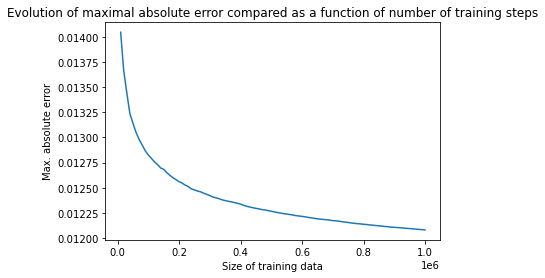

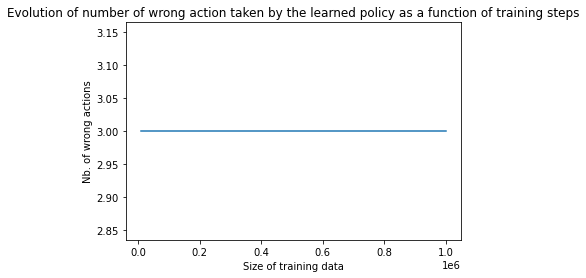


 Wrong actions : 
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  2


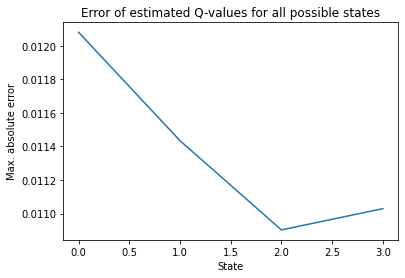


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


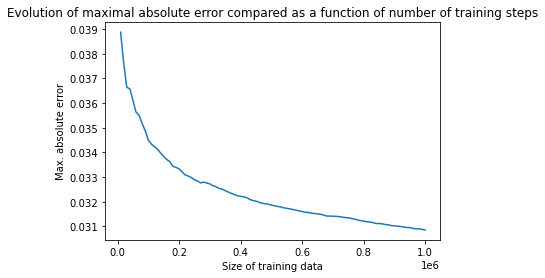

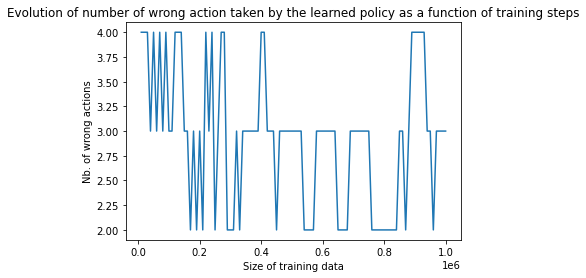


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4


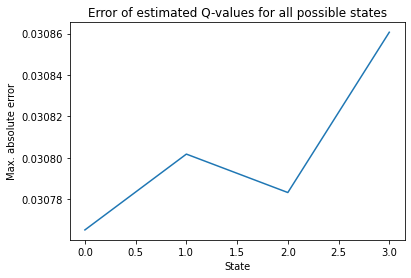


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


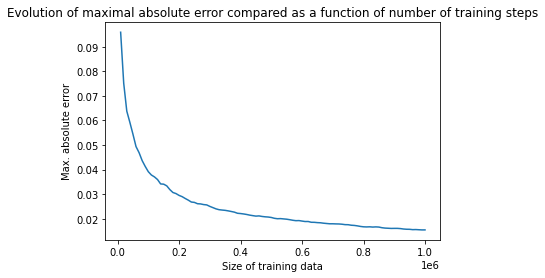

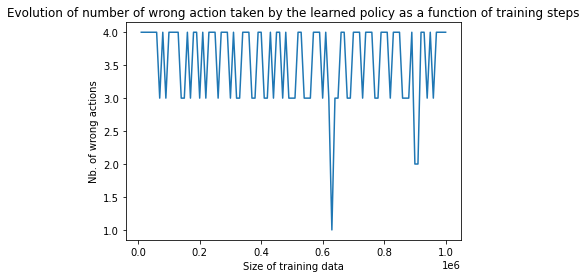


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7


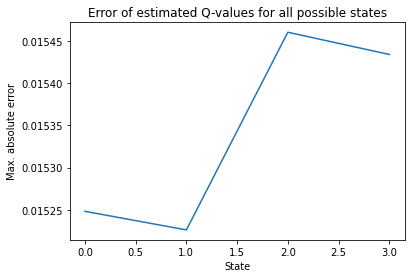


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


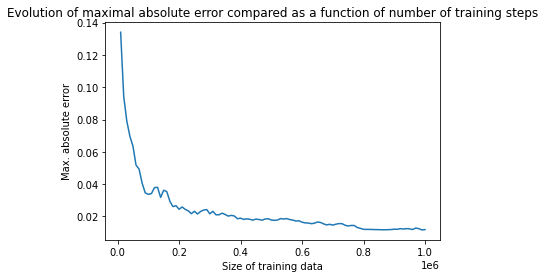

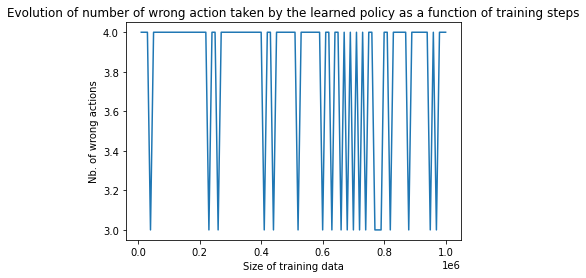


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


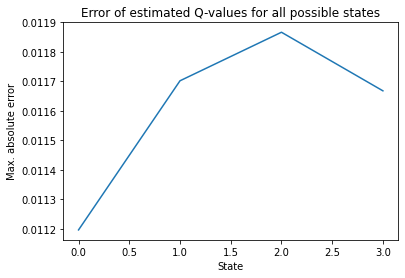

In [8]:
for x in res_bin:
    plot_res_multi_QLearning(x,true_qval)

In [9]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1,0.01]:
        params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=1, decay_rate=decay_rate,true_qval = true_qval,adaptive_lr= True)])
            
    res_bin_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


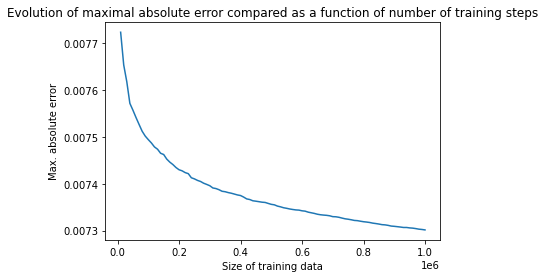

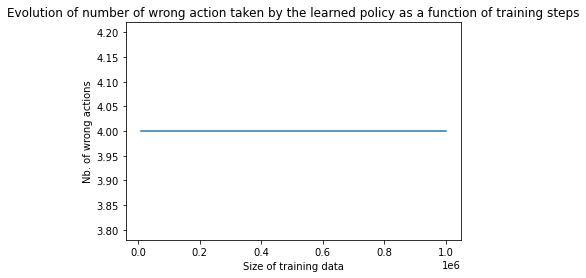


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  1
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0


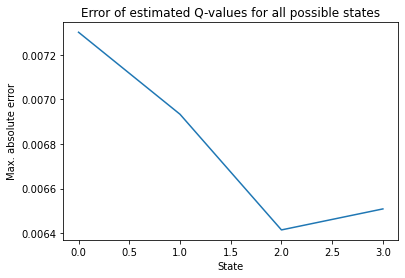


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


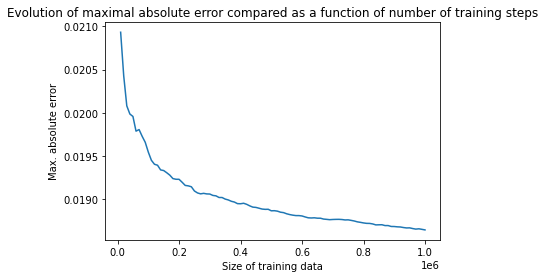

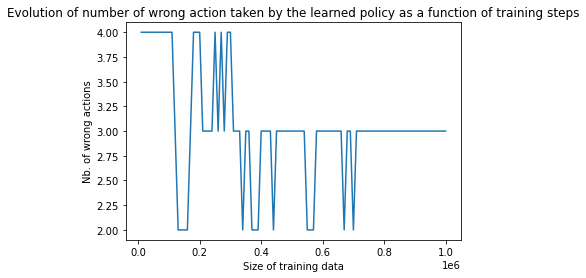


 Wrong actions : 
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4


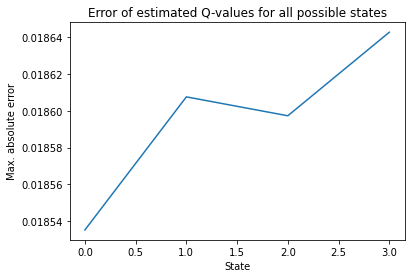


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


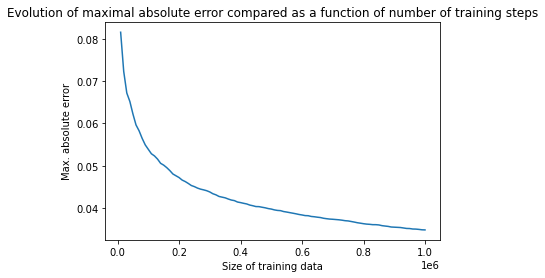

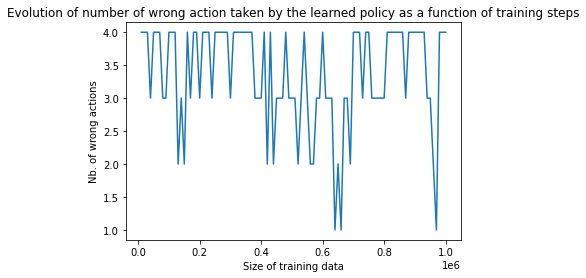


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6


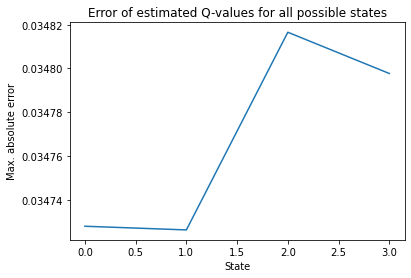


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


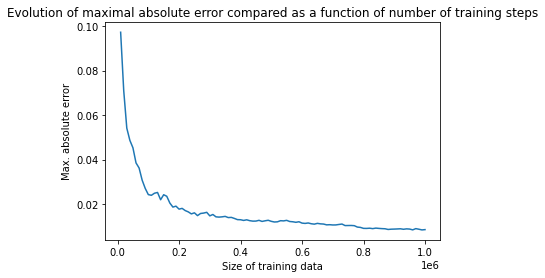

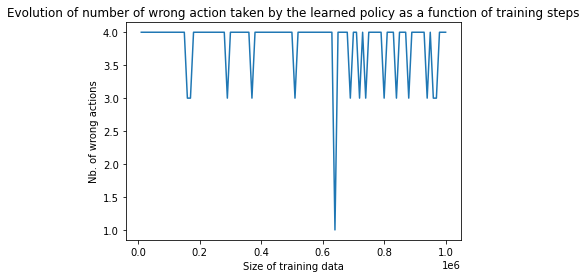


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


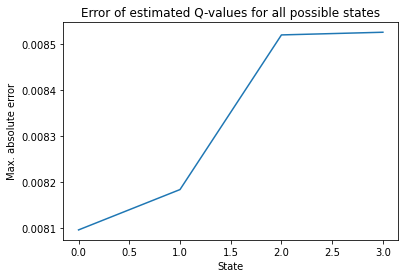

In [10]:
for x in res_bin_adaptlr:
    plot_res_multi_QLearning(x,true_qval)

In [11]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.1,0.01]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval)])
            
    res_bin_decay_rate = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


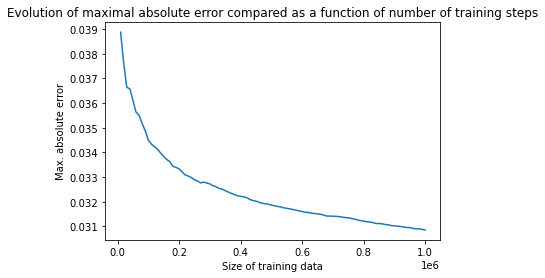

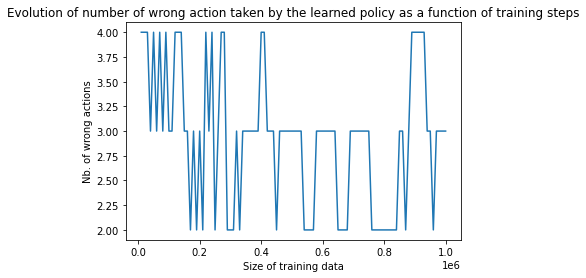


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4


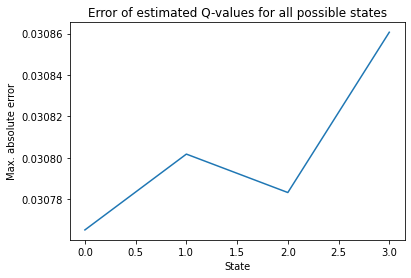


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


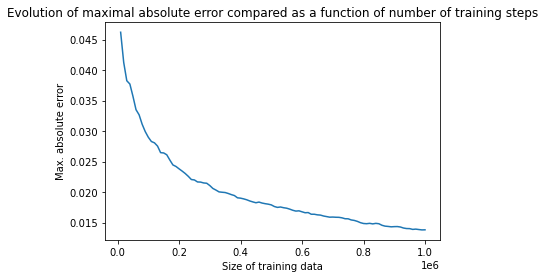

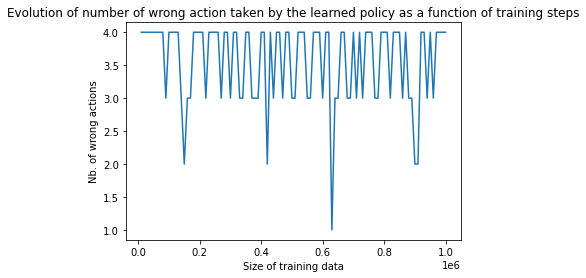


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7


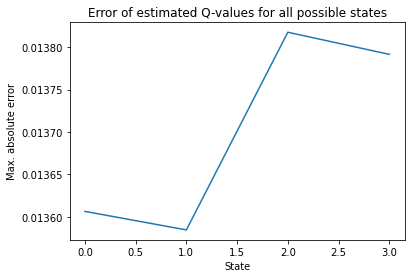


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


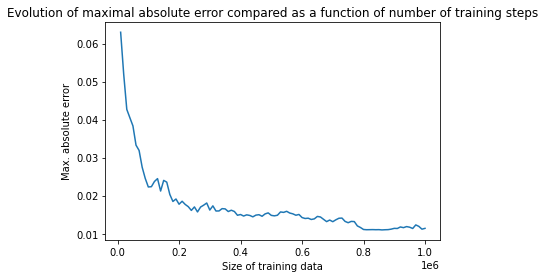

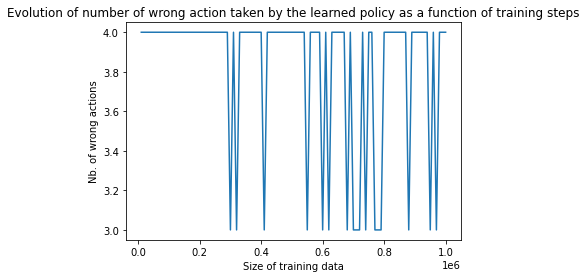


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


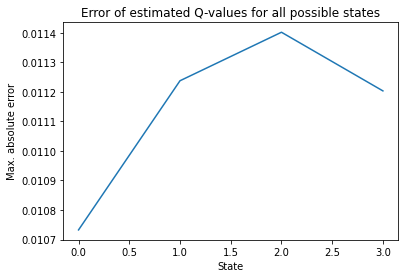


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


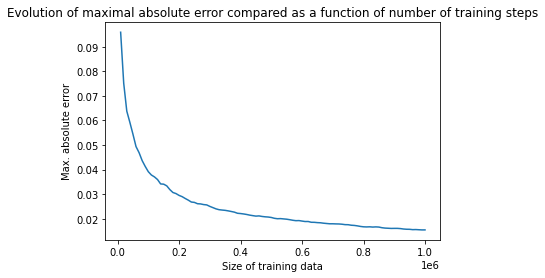

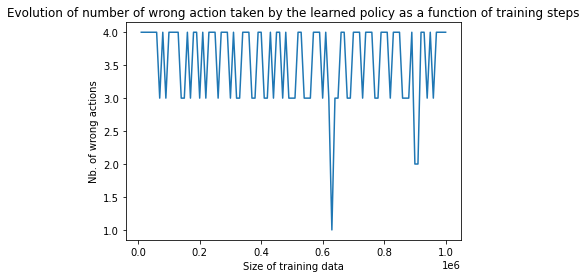


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7


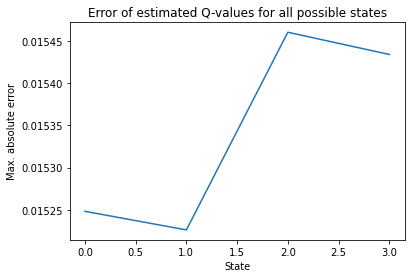


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


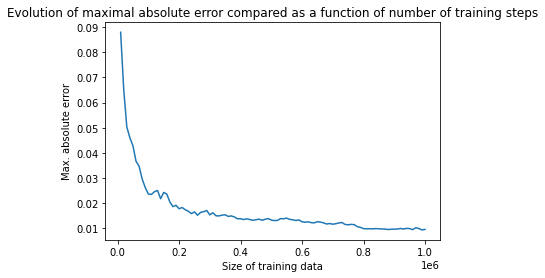

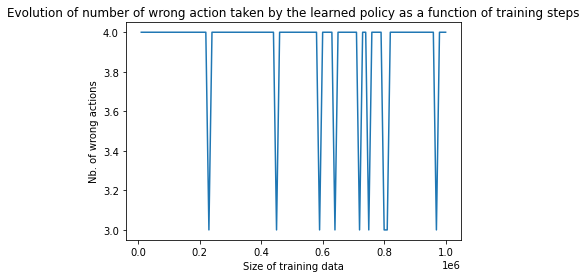


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


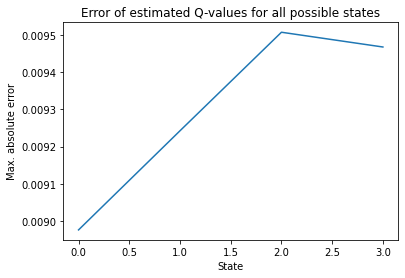


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


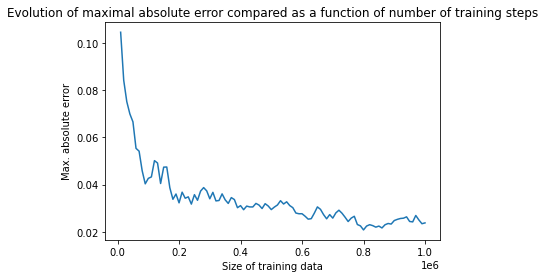

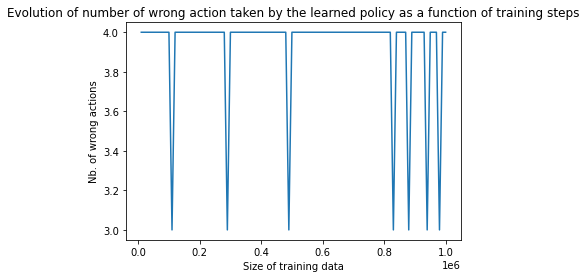


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  1
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  3
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


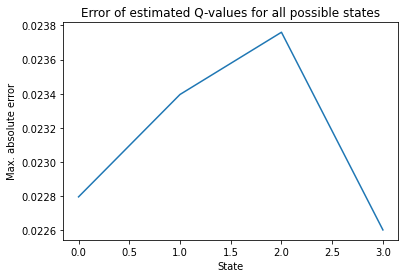

In [12]:
for x in res_bin_decay_rate:
    plot_res_multi_QLearning(x,true_qval)

In [13]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1]:
        for tau in [1,0.9,0.8]:
            params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval,adaptive_lr=True)])
            
    res_bin_decay_rate_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


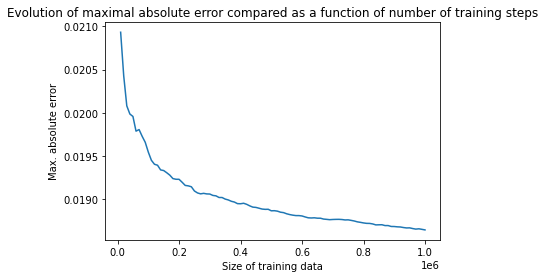

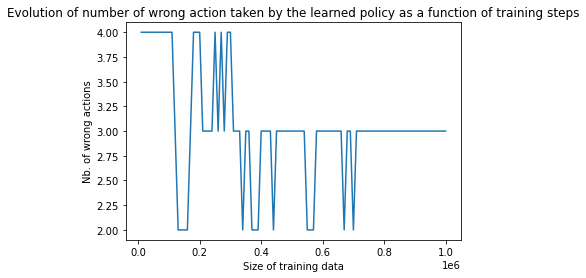


 Wrong actions : 
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4


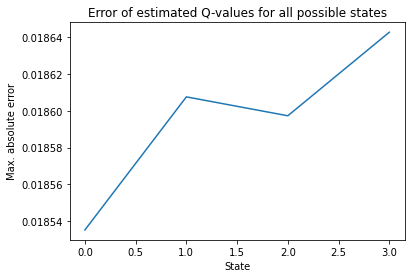


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


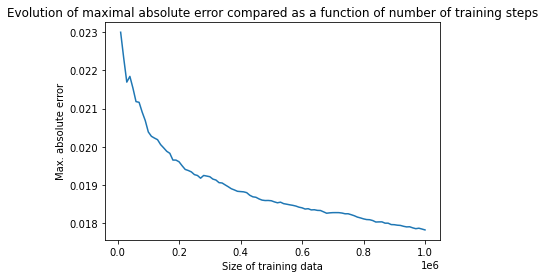

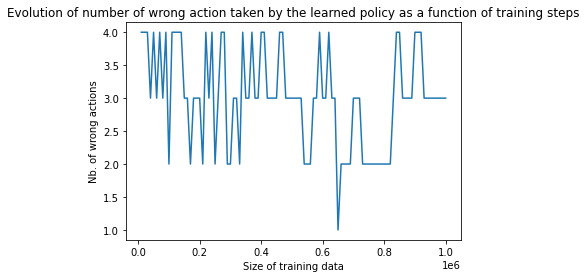


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  4


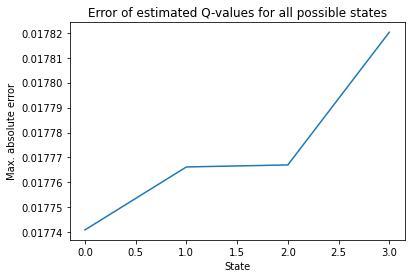


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


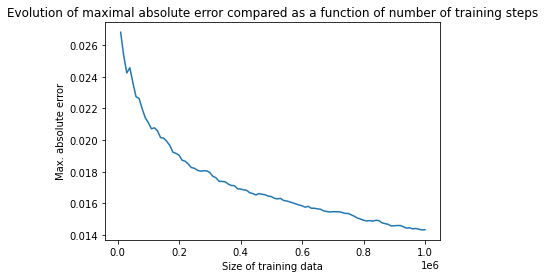

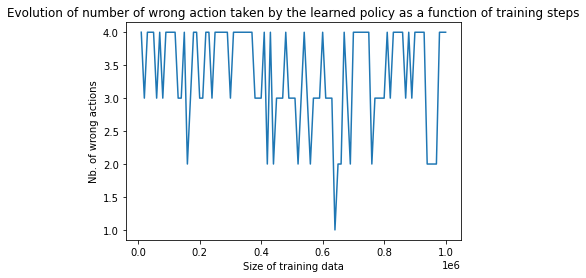


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6


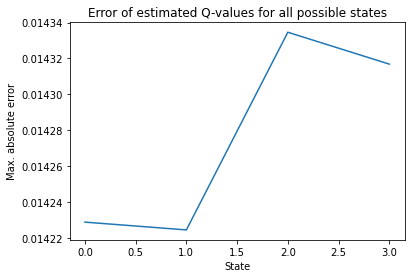


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


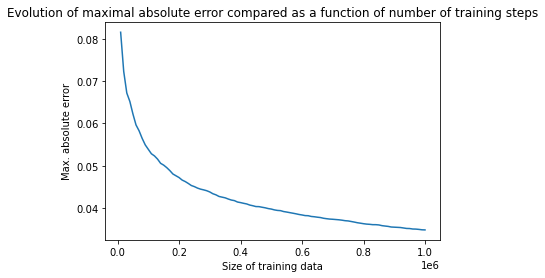

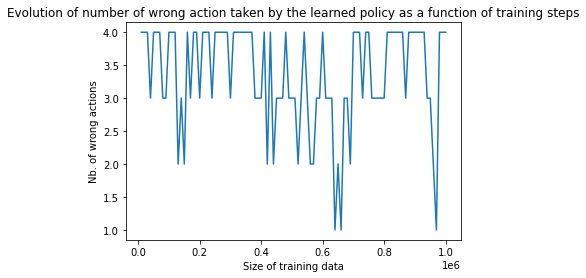


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6


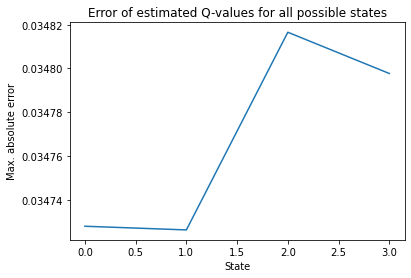


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


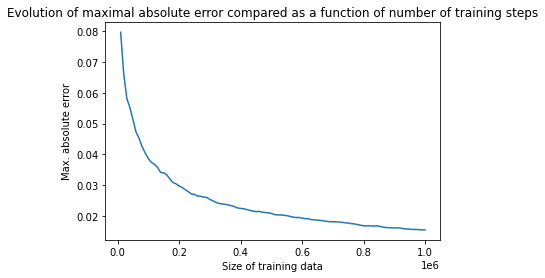

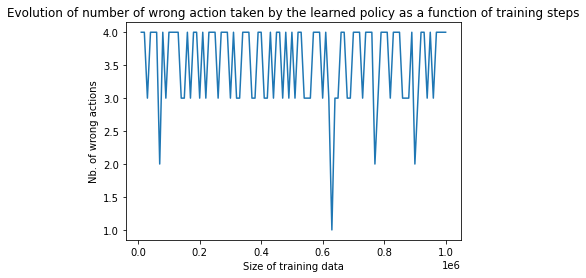


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8


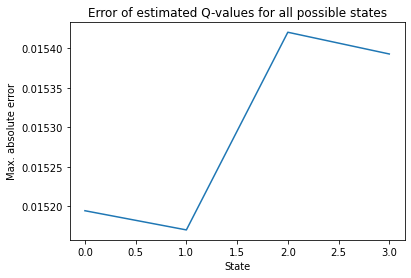


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


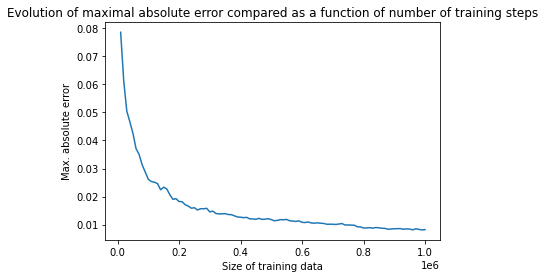

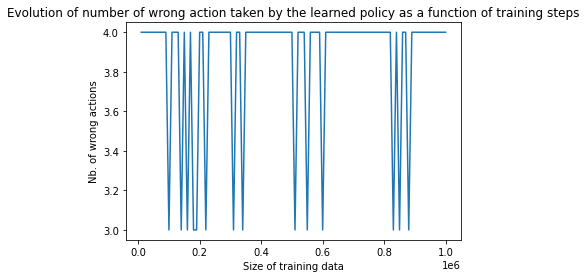


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


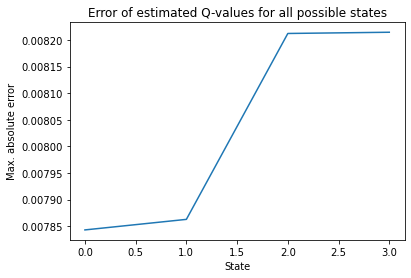

In [14]:
for x in res_bin_decay_rate_adaptlr:
    plot_res_multi_QLearning(x,true_qval)

In [15]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [0.1]:
        for beta in [1e-2,1e-3,1e-4,1e-5]:
            params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=1, decay_rate=decay_rate,beta=beta,true_qval = true_qval)])
            
    res_bin_beta = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 0.1, Beta : 0.01, Tau : 1


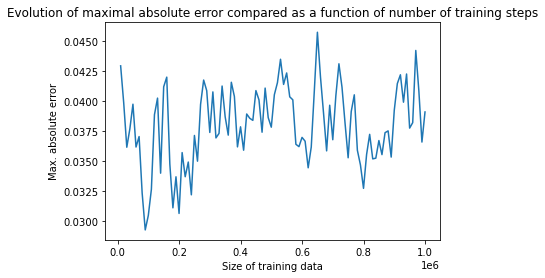

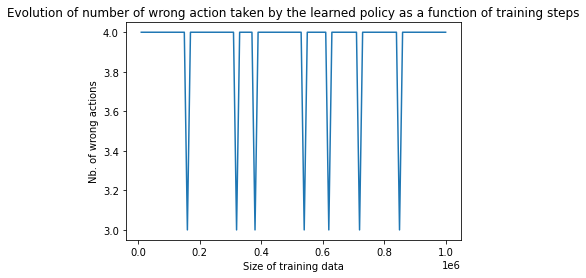


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  1
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


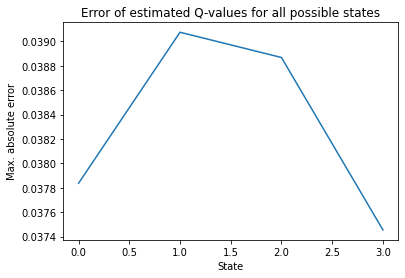


 

Simple learning rate: Decay rate : 0.1, Beta : 0.001, Tau : 1


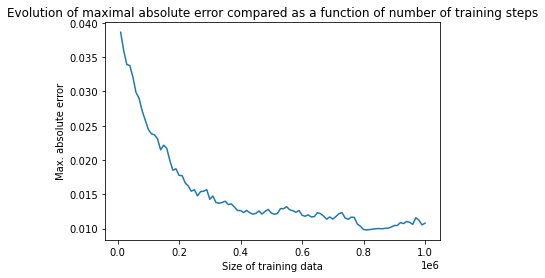

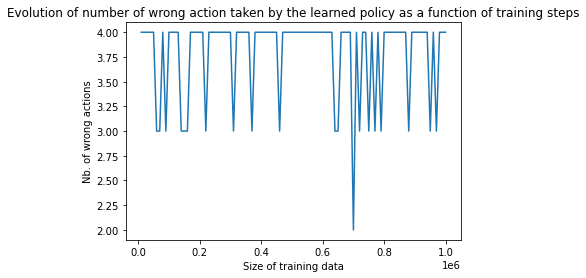


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


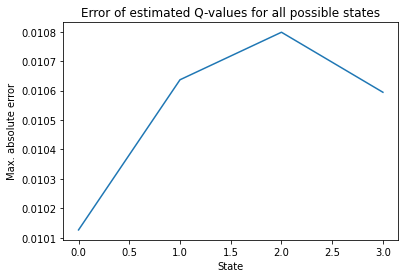


 

Simple learning rate: Decay rate : 0.1, Beta : 0.0001, Tau : 1


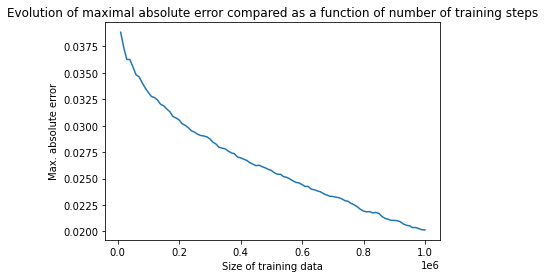

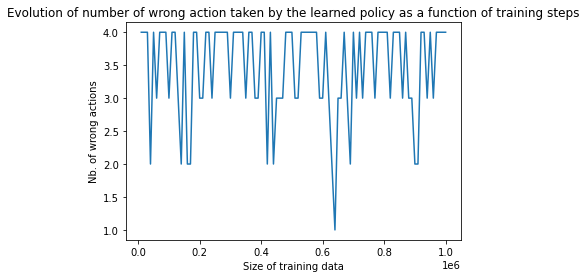


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  8


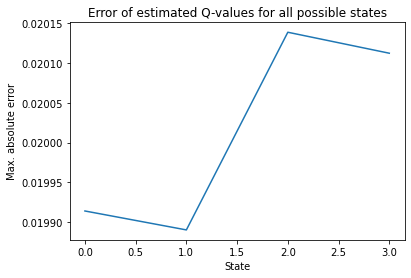


 

Simple learning rate: Decay rate : 0.1, Beta : 1e-05, Tau : 1


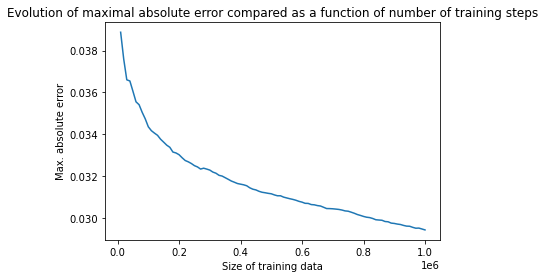

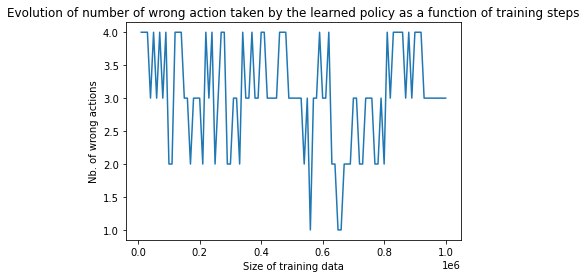


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6


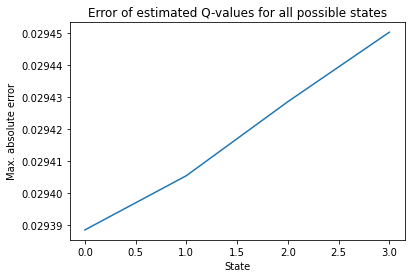

In [16]:
for x in res_bin_beta:
    plot_res_multi_QLearning(x,true_qval)

#### $\beta$ brings nothing

## No optimal policy was derived.
However, we are quite close with errors around $0.014$ and only wrong actions by $0.1$. The difficulty to learn the optimal policy comes from the fact that for action in $\{0.4,0.5,0.6\}$, the difference in expected reward is really small:

\begin{equation*}
\begin{split}
    \mathbb{E}[r(s_t,a_t,s_{t+1}) \mid s_t, a_t=0.6] &= -0.000007\\
    \mathbb{E}[r(s_t,a_t,s_{t+1} )\mid s_t, a_t=0.5] &= 0\\
    \mathbb{E}[r(s_t,a_t,s_{t+1}) \mid s_t, a_t=0.4] &=  -0.000007
\end{split}
\end{equation*}


#### It doesn't really make sense to consider window size $w=2$ as for $w=1$ convergence was not optimal.

Nevertheless, we still apply Q-Learning for it with the adaptive learning rate as it will perform better than the simple one for a larger state space. We get again actions quite close to the optimal action $a_t=0.5$, we see a lot of $0.4$ and $0.6$. Errors are around the same as when $w=1$.

In [51]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret,index=['S1','S2']) ,np.array(test_ret),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin,true_qval),adaptive_lr=True)])
            
    res_bin_w2_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


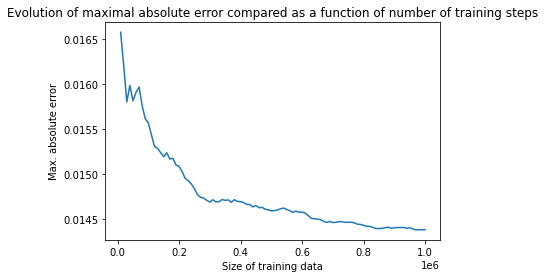

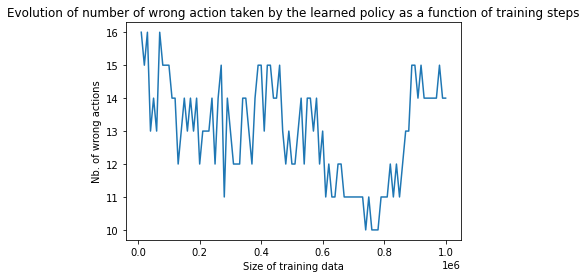


 Wrong actions : 
There are a lot of wrong actions :  14


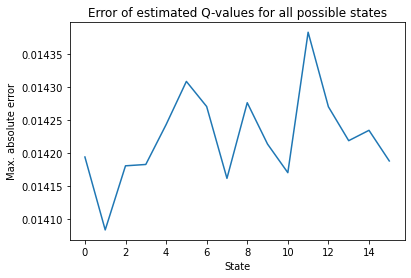


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


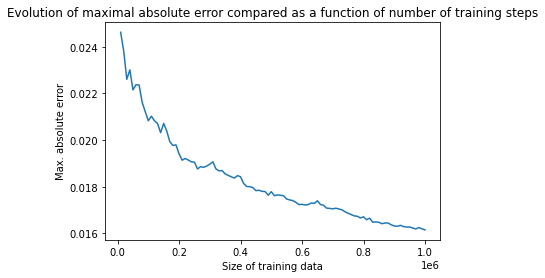

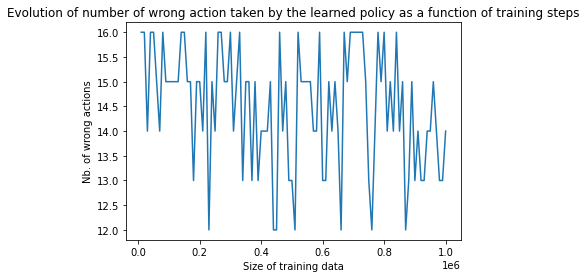


 Wrong actions : 
There are a lot of wrong actions :  14


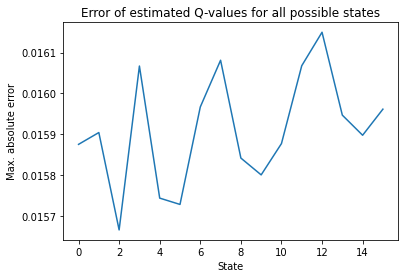


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


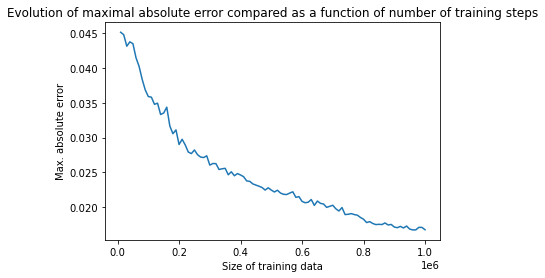

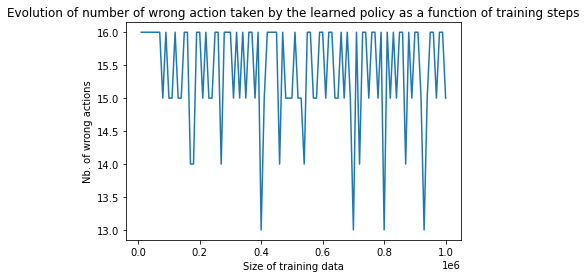


 Wrong actions : 
There are a lot of wrong actions :  15


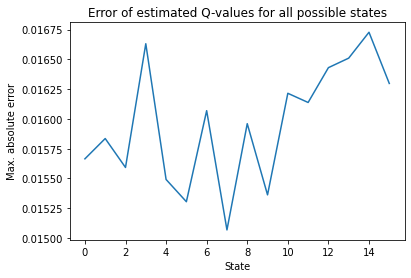


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


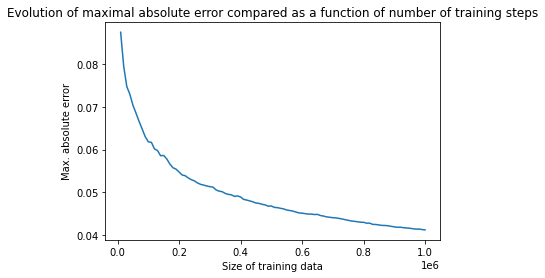

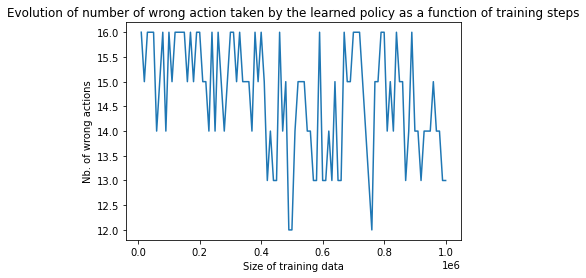


 Wrong actions : 
There are a lot of wrong actions :  13


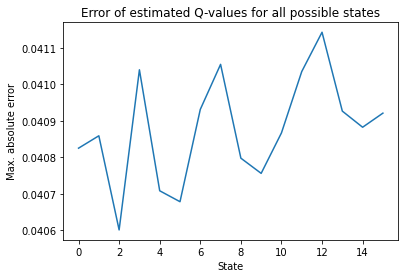


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


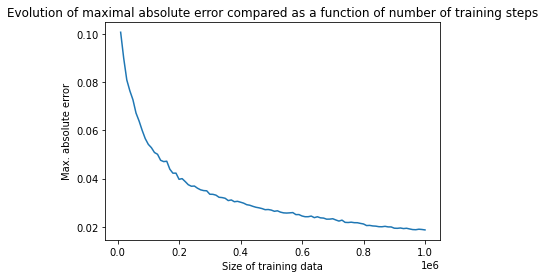

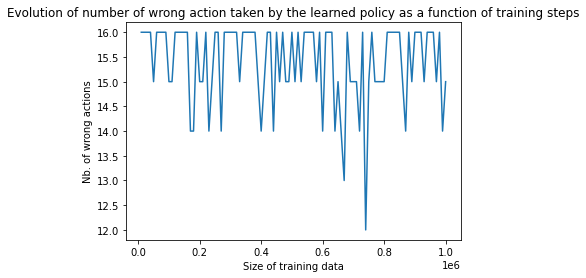


 Wrong actions : 
There are a lot of wrong actions :  15


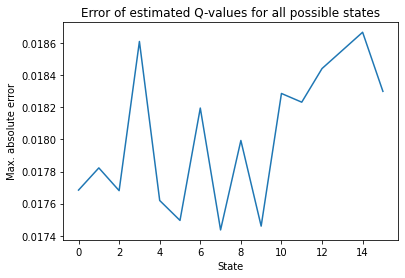


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


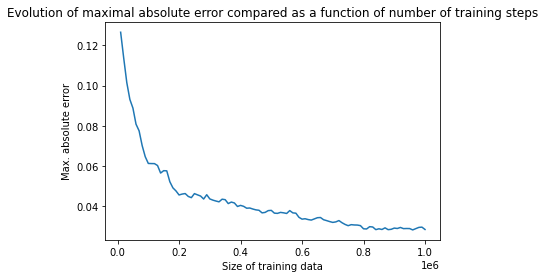

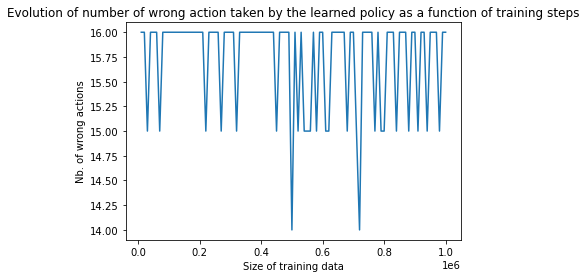


 Wrong actions : 
There are a lot of wrong actions :  16


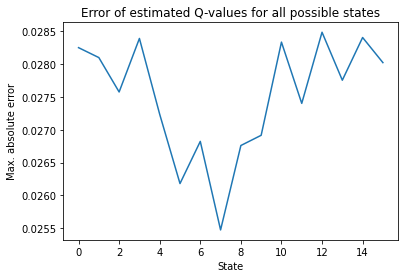


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


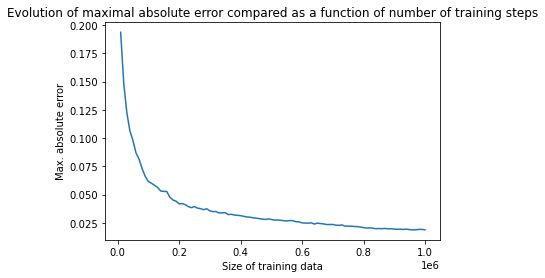

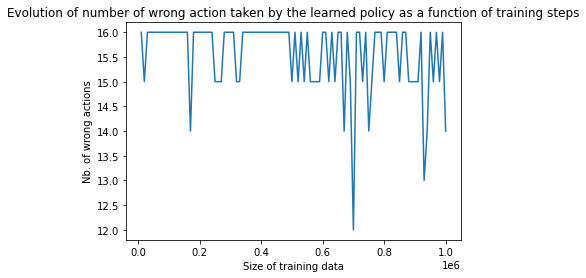


 Wrong actions : 
There are a lot of wrong actions :  14


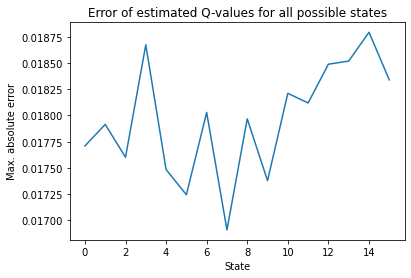


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


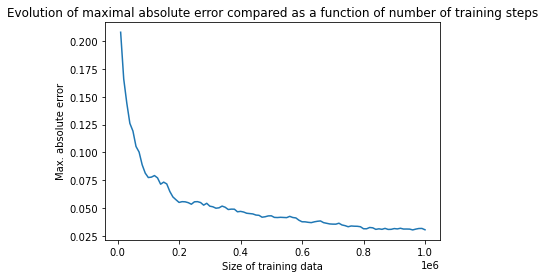

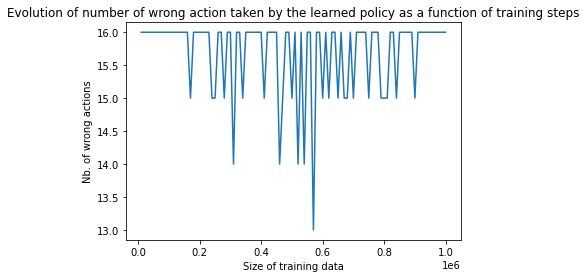


 Wrong actions : 
There are a lot of wrong actions :  16


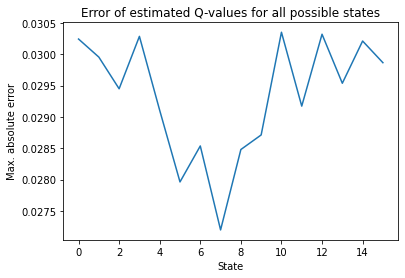


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


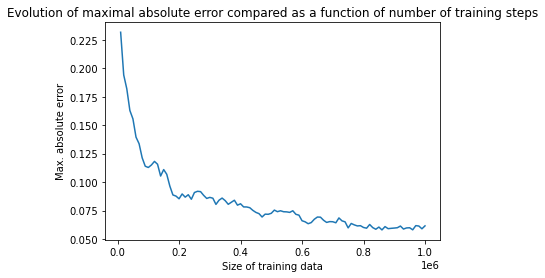

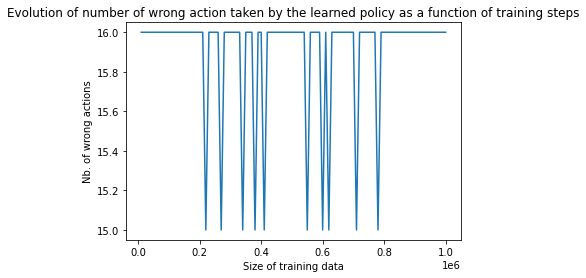


 Wrong actions : 
There are a lot of wrong actions :  16


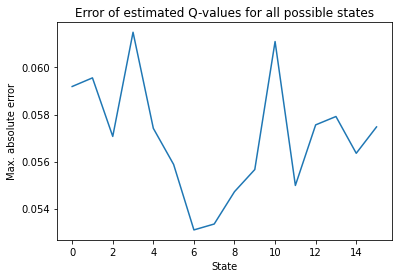


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 1


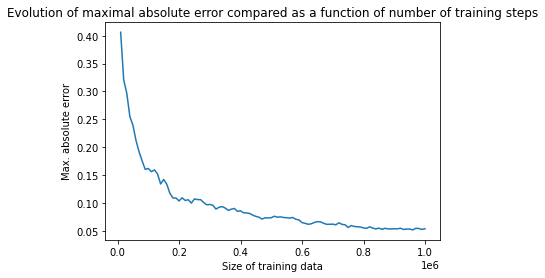

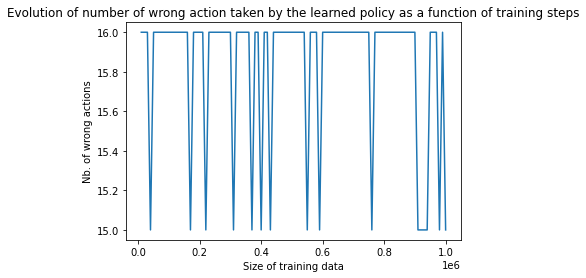


 Wrong actions : 
There are a lot of wrong actions :  15


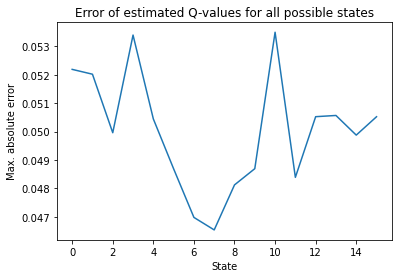


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 0.8


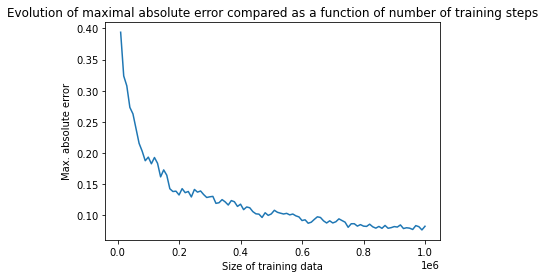

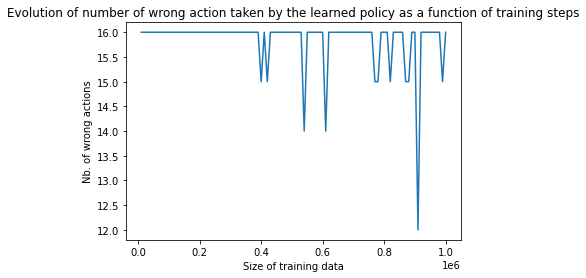


 Wrong actions : 
There are a lot of wrong actions :  16


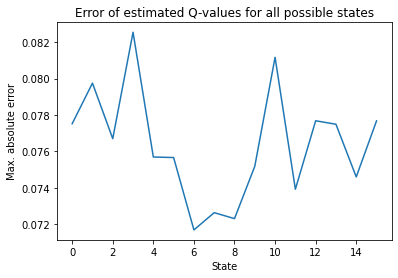


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 0.6


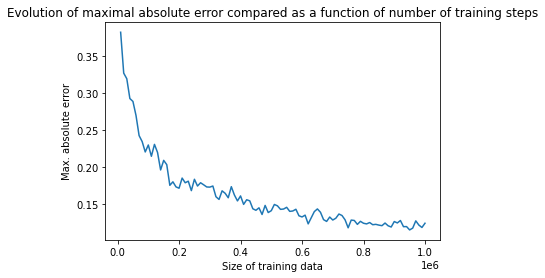

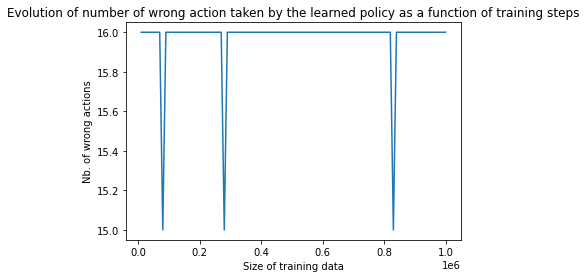


 Wrong actions : 
There are a lot of wrong actions :  16


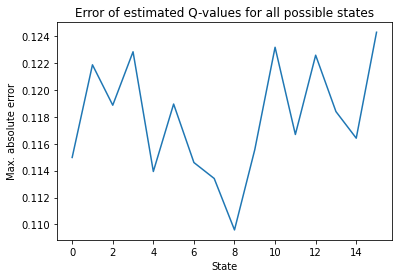

In [52]:
for x in res_bin_w2_adaptlr:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin,true_qval))

In [57]:
for k in res_bin_w2_adaptlr[0]['q_val'].keys():
    print(k, ' Q-Learning action ',np.argmax(res_bin_w2_adaptlr[0]['q_val'][k]))

[1.02, 1.02, 1.02, 1.02]  Q-Learning action  4
[1.02, 1.02, 1.02, 0.98]  Q-Learning action  6
[1.02, 1.02, 0.98, 0.98]  Q-Learning action  6
[1.02, 0.98, 0.98, 1.02]  Q-Learning action  4
[0.98, 0.98, 1.02, 1.02]  Q-Learning action  5
[0.98, 1.02, 1.02, 0.98]  Q-Learning action  8
[1.02, 0.98, 0.98, 0.98]  Q-Learning action  7
[0.98, 1.02, 0.98, 1.02]  Q-Learning action  4
[1.02, 0.98, 1.02, 1.02]  Q-Learning action  1
[1.02, 1.02, 0.98, 1.02]  Q-Learning action  6
[0.98, 1.02, 1.02, 1.02]  Q-Learning action  7
[1.02, 0.98, 1.02, 0.98]  Q-Learning action  1
[0.98, 0.98, 0.98, 0.98]  Q-Learning action  5
[0.98, 0.98, 0.98, 1.02]  Q-Learning action  6
[0.98, 0.98, 1.02, 0.98]  Q-Learning action  4
[0.98, 1.02, 0.98, 0.98]  Q-Learning action  6


# Include correlation between the Bernoulli used to simulate both stock's returns

It doesn't add any relevant information and thus all policies are optimal. We choose high correlation $0.9$.

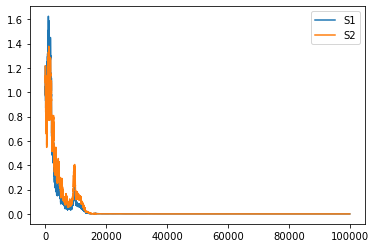

In [18]:
rho=0.9
simplebin_corr=SimpleBinomial(1.02,0.98,0.5,corr=rho)
Nsample=100000
ret_corr=simplebin_corr.simulate(Nsample+1)
plt.plot(np.cumprod(ret_corr[0,:]))
plt.plot(np.cumprod(ret_corr[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [19]:
true_qval_corr=simplebin_corr.true_qval(1e-8)

Time needed to converge with delta =  1e-08  :  458


In [20]:
true_qval_corr

{'[1.02, 1.02]': array([-0.00510053, -0.00506452, -0.00503651, -0.00501651, -0.00500451,
        -0.00500051, -0.00500451, -0.00501651, -0.00503651, -0.00506452,
        -0.00510053]),
 '[1.02, 0.98]': array([-0.00510053, -0.00506452, -0.00503651, -0.00501651, -0.00500451,
        -0.00500051, -0.00500451, -0.00501651, -0.00503651, -0.00506452,
        -0.00510053]),
 '[0.98, 1.02]': array([-0.00510053, -0.00506452, -0.00503651, -0.00501651, -0.00500451,
        -0.00500051, -0.00500451, -0.00501651, -0.00503651, -0.00506452,
        -0.00510053]),
 '[0.98, 0.98]': array([-0.00510053, -0.00506452, -0.00503651, -0.00501651, -0.00500451,
        -0.00500051, -0.00500451, -0.00501651, -0.00503651, -0.00506452,
        -0.00510053])}

In [21]:
for k in true_qval_corr.keys():
    print(k, ' Optimal : ', np.argmax(true_qval_corr[k]))

[1.02, 1.02]  Optimal :  5
[1.02, 0.98]  Optimal :  5
[0.98, 1.02]  Optimal :  5
[0.98, 0.98]  Optimal :  5


In [26]:
Nsim=10000
test_ret_corr=simplebin_corr.simulate(Nsim)

PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corr,index=['S1','S2']) ,np.array(test_ret_corr),  window=1, decay_rate=decay_rate,true_qval = true_qval_corr)])
            
    res_bin_corr = pool.map(multi_train_QLearning, params)
    


 

Decay rate : 1, Beta : 0, Tau : 1


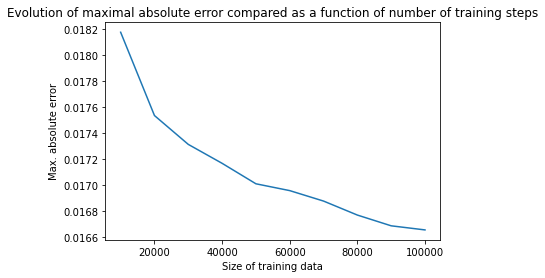

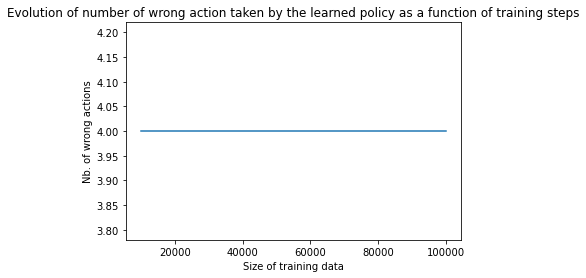


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  7
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  6


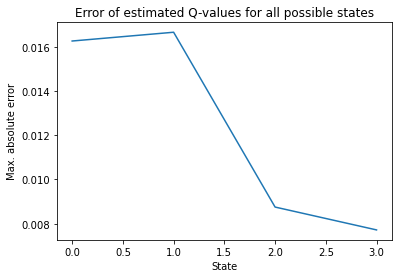


 

Decay rate : 0.1, Beta : 0, Tau : 1


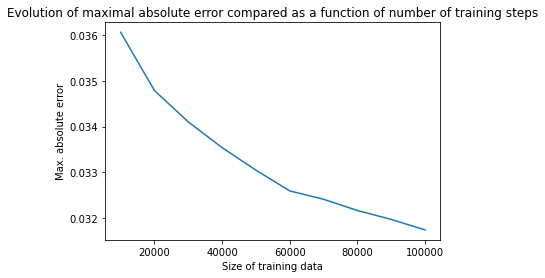

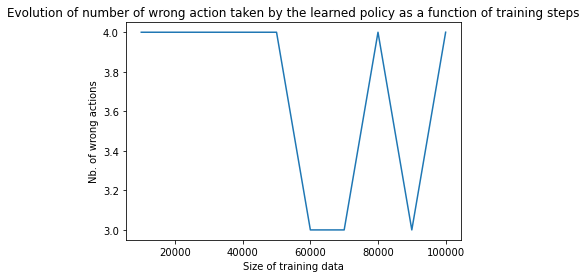


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


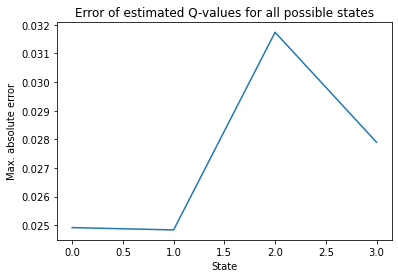


 

Decay rate : 0.01, Beta : 0, Tau : 1


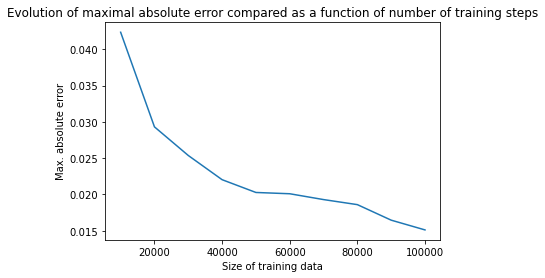

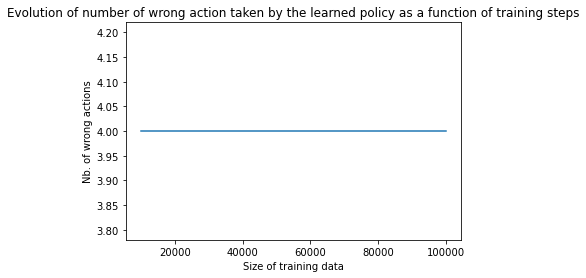


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


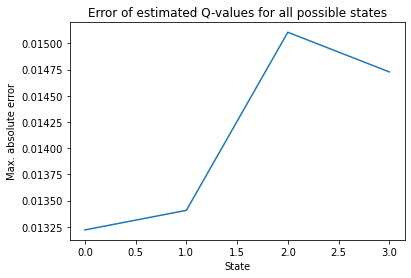


 

Decay rate : 0.001, Beta : 0, Tau : 1


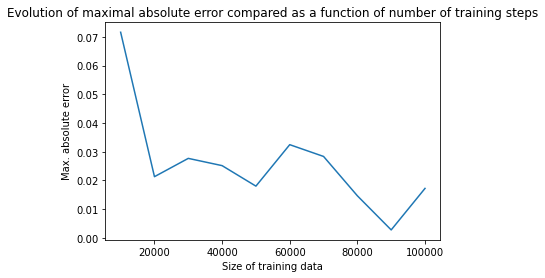

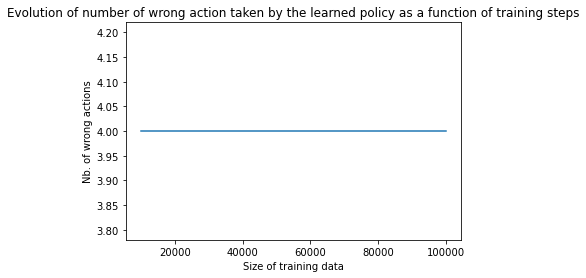


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  1
[1.02, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  0
[0.98, 1.02] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10
[0.98, 0.98] ; Action from discrete policy :  5 ; Action from Q-Learning algorithm :  10


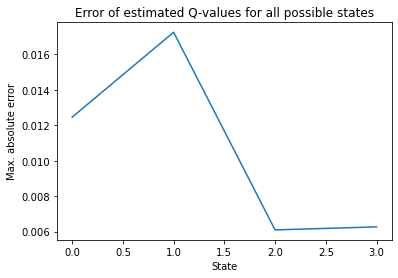

In [28]:
for x in res_bin_corr:
    plot_res_multi_QLearning(x,true_qval_corr)

Correlation doesn't change the fact that optimal policy is always equal to $0.5$. We remark that the wrong action for different returns between first and second stock is far from $0.5$. This comes from the fact that those states are rare due to the high correlation between both returns, $\rho=0.9$.

# Higher $p$ for first stock, $p_1=0.52$
Same up/down values, no correlation but stock one has $0.02$ more probability to go up. Thus the optimal policy should always choose policy putting all weight in the first stock. There are no time dependence, hence :
\begin{equation*}
\begin{split}
    \mathbb{E}[r_{1,t}] &= p_1\cdot 1.02 + (1-p_1) \cdot 0.98 = 1.0008\\
    \mathbb{E}[r_{2,t}] &= p_2\cdot 1.02 + (1-p_2)\cdot 0.98 = 1.0
\end{split}
\end{equation*}

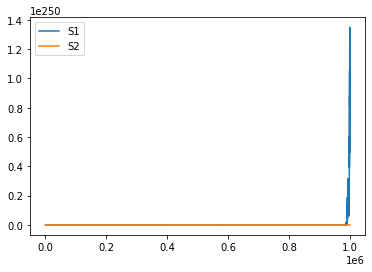

In [9]:
simplebin_w=SimpleBinomial(1.02,0.98,p1=0.52,p2=0.5)
Nsample=1000000
ret_w=simplebin_w.simulate(Nsample+1)
plt.plot(np.cumprod(ret_w[0,:]))
plt.plot(np.cumprod(ret_w[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [10]:
Nsim=10000
test_ret_w=simplebin_w.simulate(Nsim)


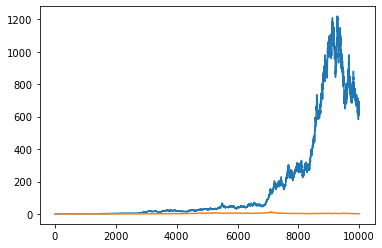

In [11]:
plt.plot(np.cumprod(test_ret_w[0,:]))
plt.plot(np.cumprod(test_ret_w[1,:]))

In [12]:
true_qval_w=simplebin_w.true_qval(1e-8)

Time needed to converge with delta =  1e-08  :  547


In [13]:
true_qval_w

{'[1.02, 1.02]': array([0.02920274, 0.02931878, 0.0294268 , 0.02952681, 0.02961881,
        0.02970281, 0.02977882, 0.02984682, 0.02990682, 0.02995883,
        0.03000285]),
 '[1.02, 0.98]': array([0.02920274, 0.02931878, 0.0294268 , 0.02952681, 0.02961881,
        0.02970281, 0.02977882, 0.02984682, 0.02990682, 0.02995883,
        0.03000285]),
 '[0.98, 1.02]': array([0.02920274, 0.02931878, 0.0294268 , 0.02952681, 0.02961881,
        0.02970281, 0.02977882, 0.02984682, 0.02990682, 0.02995883,
        0.03000285]),
 '[0.98, 0.98]': array([0.02920274, 0.02931878, 0.0294268 , 0.02952681, 0.02961881,
        0.02970281, 0.02977882, 0.02984682, 0.02990682, 0.02995883,
        0.03000285])}

In [14]:
for k in true_qval_w.keys():
    print(k, ' Optimal action : ', np.argmax(true_qval_w[k]))

[1.02, 1.02]  Optimal action :  10
[1.02, 0.98]  Optimal action :  10
[0.98, 1.02]  Optimal action :  10
[0.98, 0.98]  Optimal action :  10


As awaited optimal policy chooses weight $1.0$ at all states.

In [35]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_w,index=['S1','S2']) ,np.array(test_ret_w),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval_w)])
            
    res_w = pool.map(multi_train_QLearning, params)
   


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


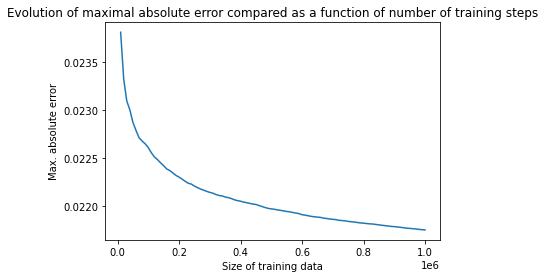

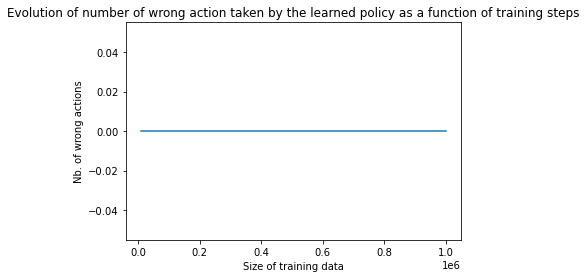


 Wrong actions : 
Optimal policy derived !!


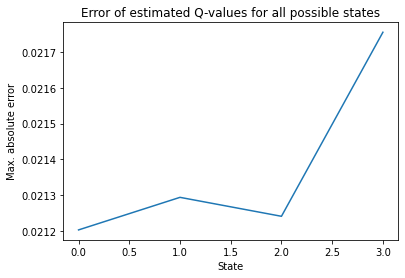


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


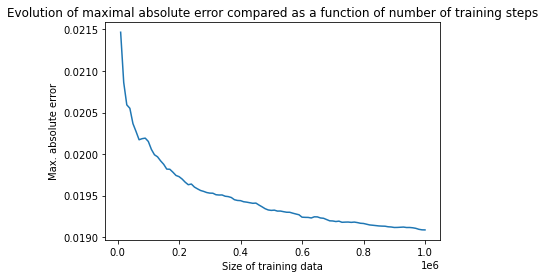

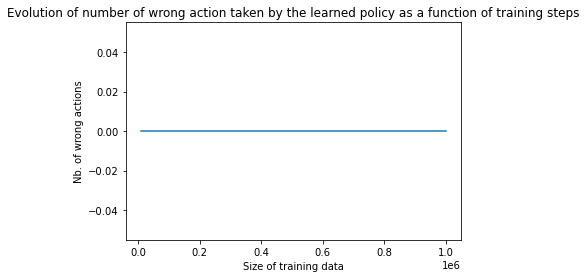


 Wrong actions : 
Optimal policy derived !!


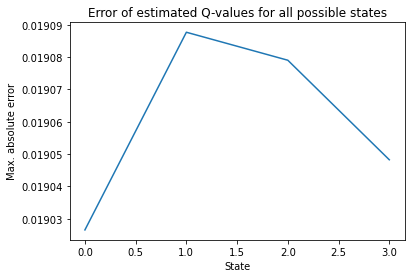


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


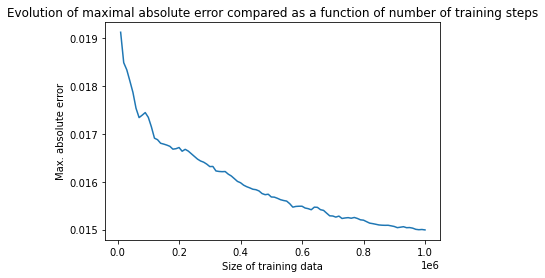

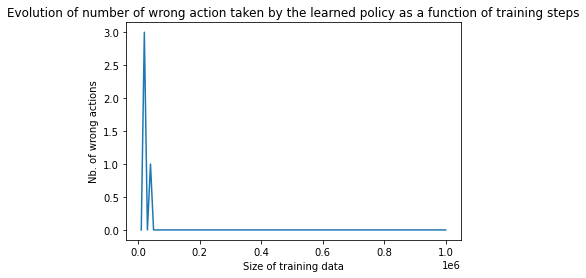


 Wrong actions : 
Optimal policy derived !!


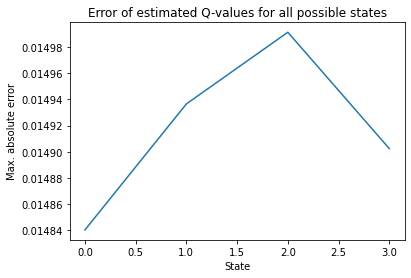


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


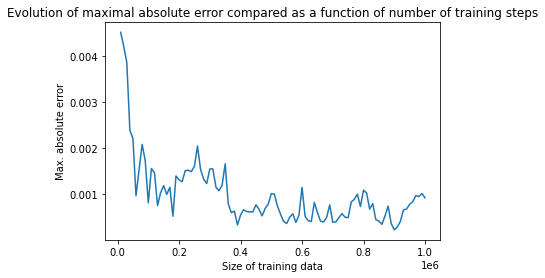

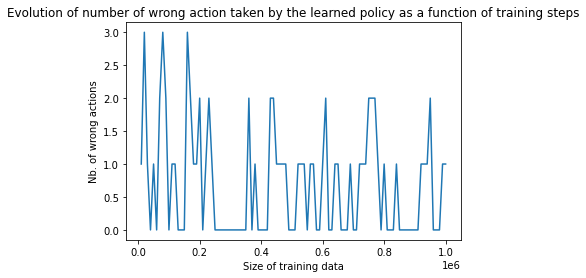


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


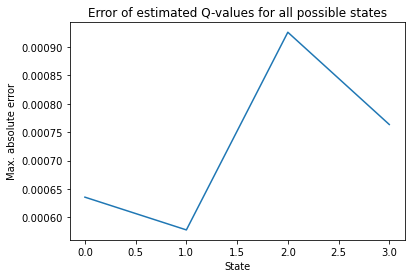


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


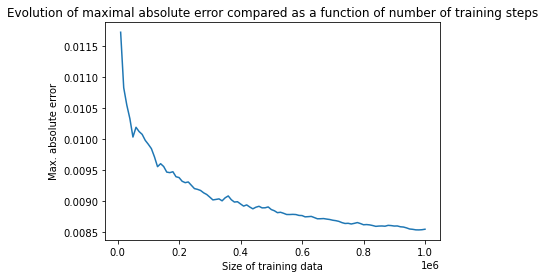

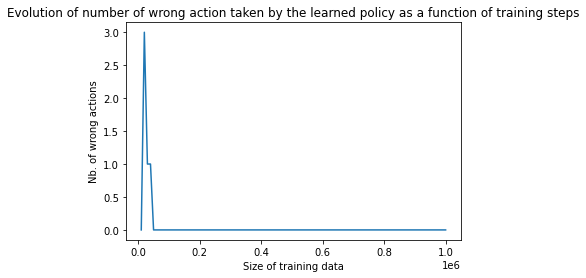


 Wrong actions : 
Optimal policy derived !!


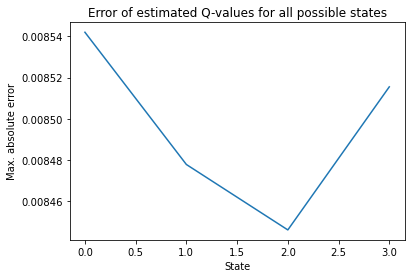


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


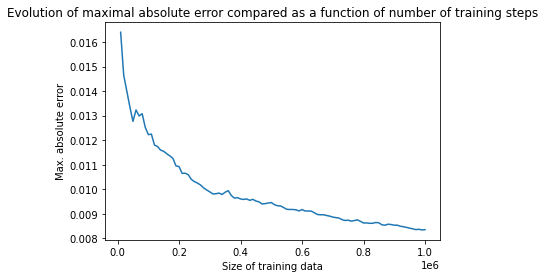

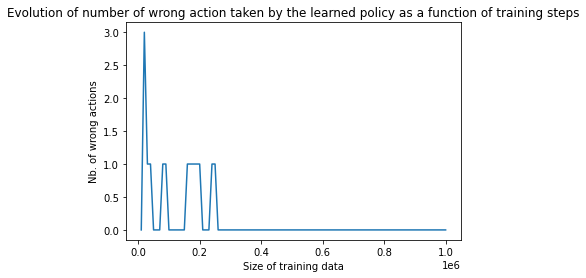


 Wrong actions : 
Optimal policy derived !!


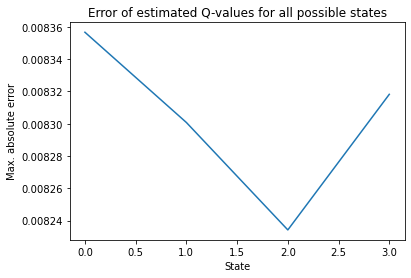


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


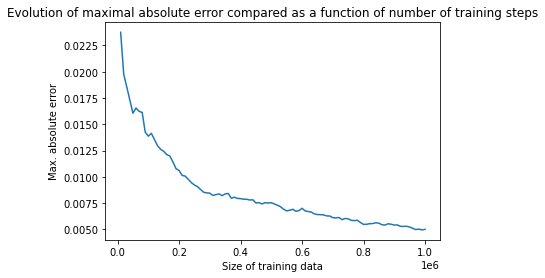

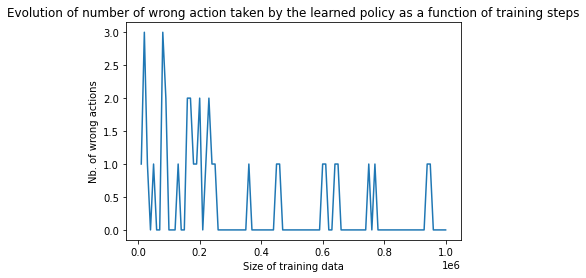


 Wrong actions : 
Optimal policy derived !!


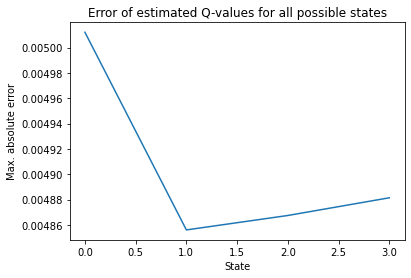


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


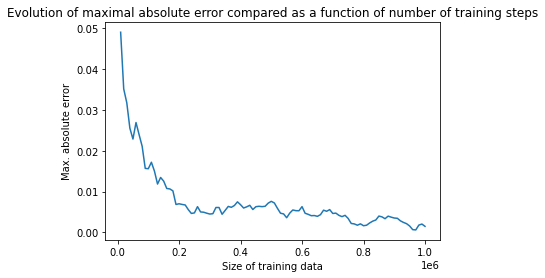

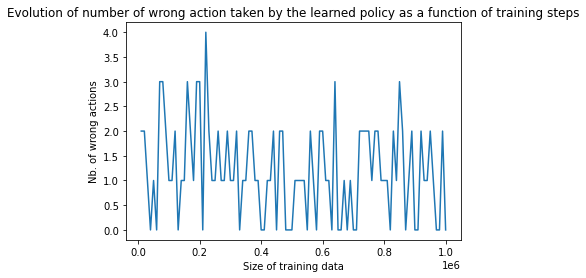


 Wrong actions : 
Optimal policy derived !!


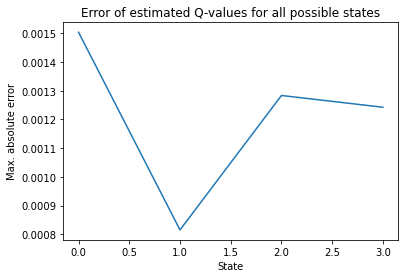


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


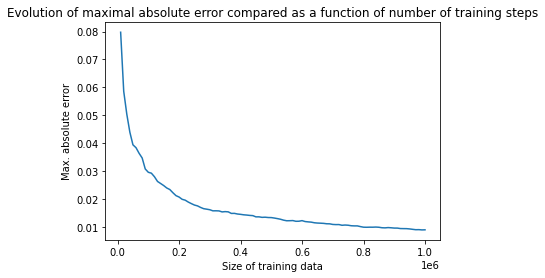

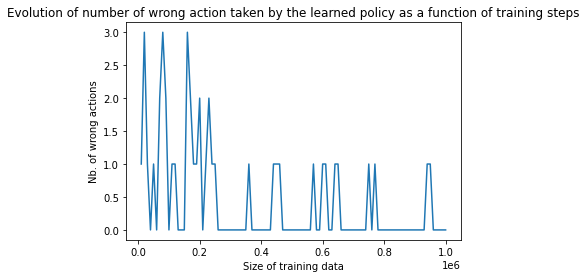


 Wrong actions : 
Optimal policy derived !!


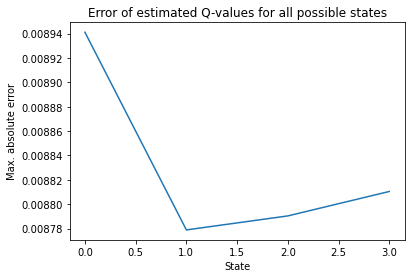


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


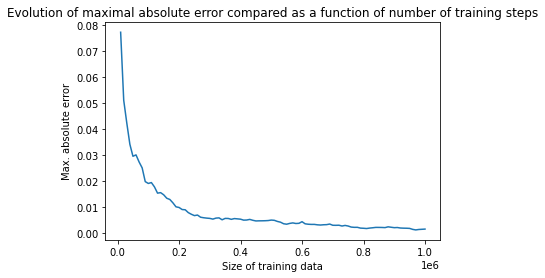

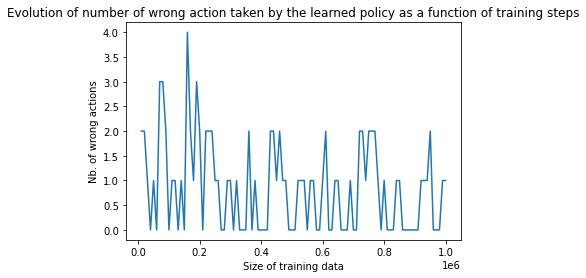


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


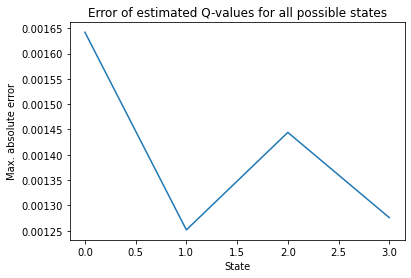


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


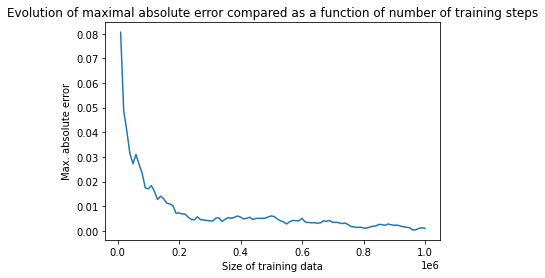

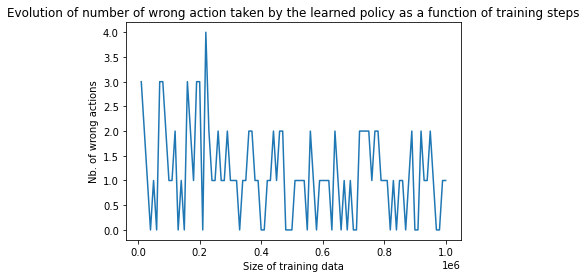


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


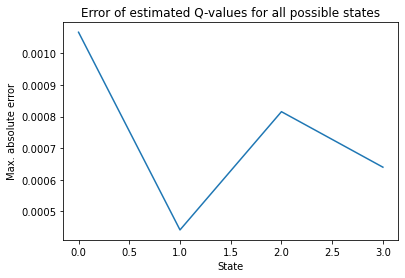


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


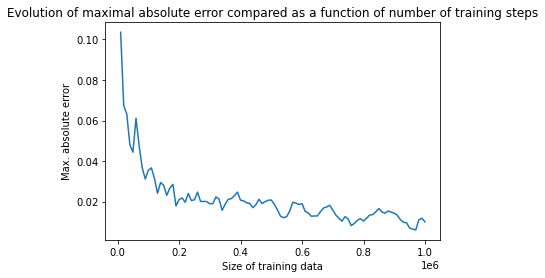

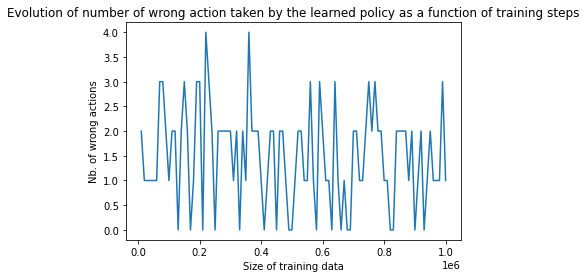


 Wrong actions : 
[0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


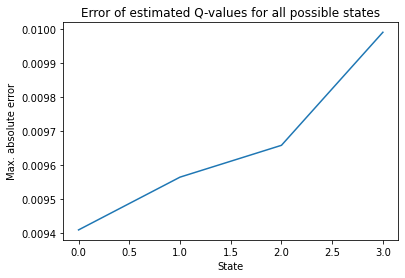


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


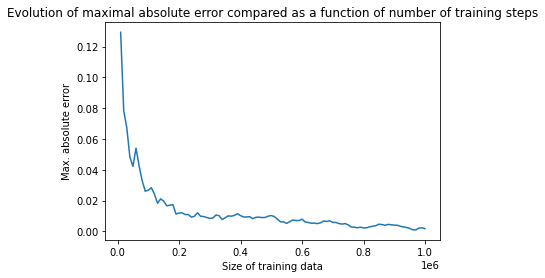

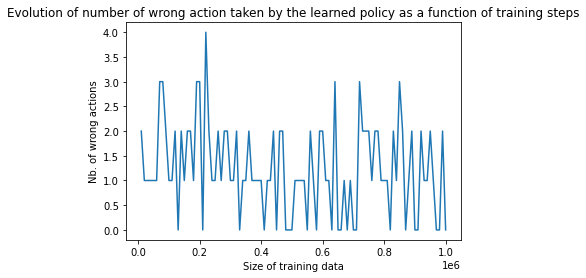


 Wrong actions : 
Optimal policy derived !!


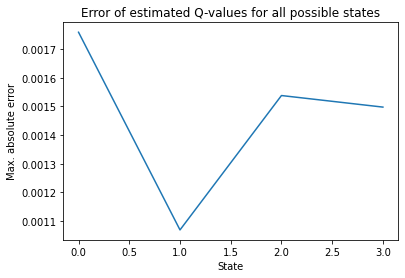


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


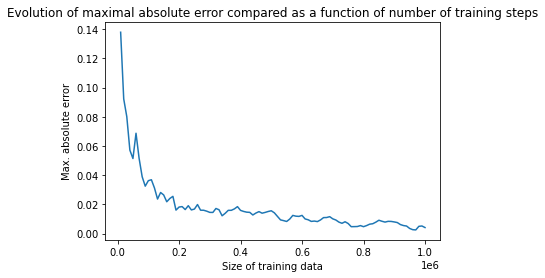

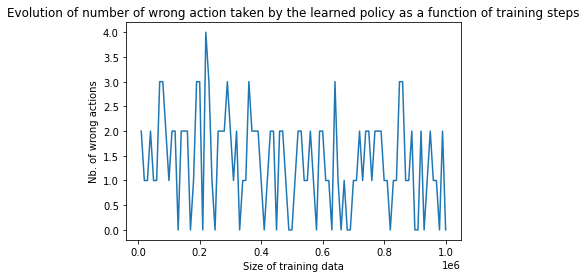


 Wrong actions : 
Optimal policy derived !!


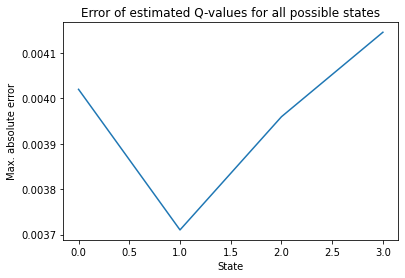


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


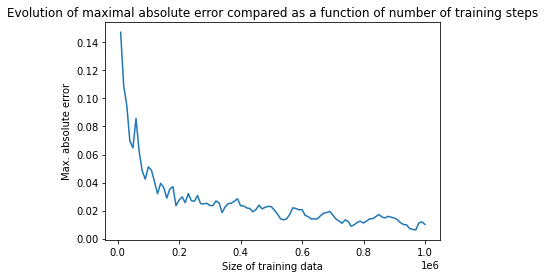

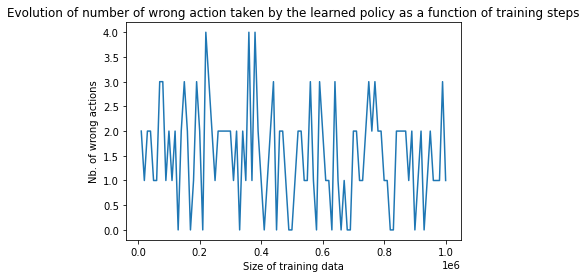


 Wrong actions : 
[0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


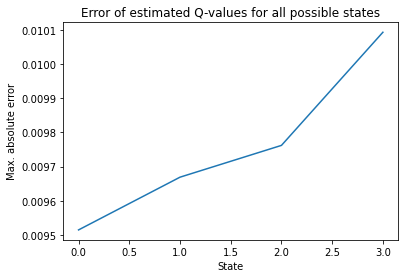


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


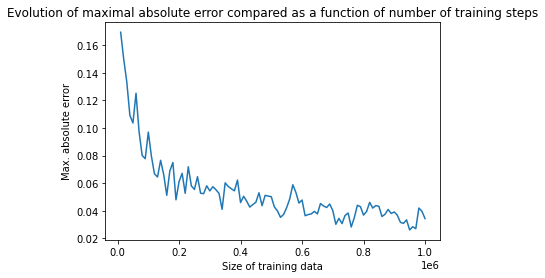

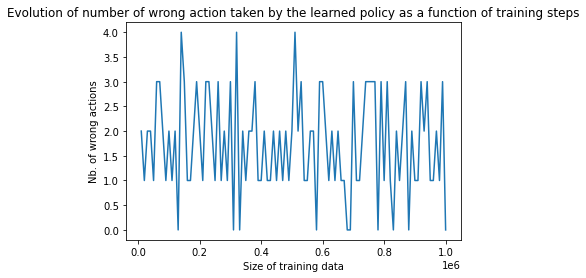


 Wrong actions : 
Optimal policy derived !!


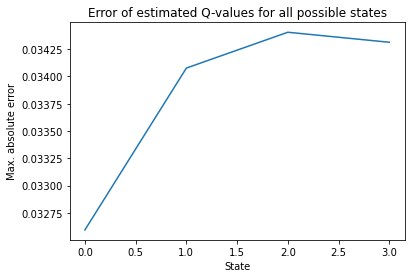

In [36]:
for x in res_w:
    plot_res_multi_QLearning(x,true_qval_w)

In [37]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1,0.01]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_w,index=['S1','S2']) ,np.array(test_ret_w),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval_w,adaptive_lr=True)])
            
    res_w_adaptlr = pool.map(multi_train_QLearning, params)
   


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


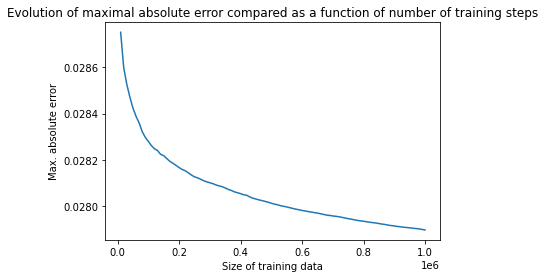

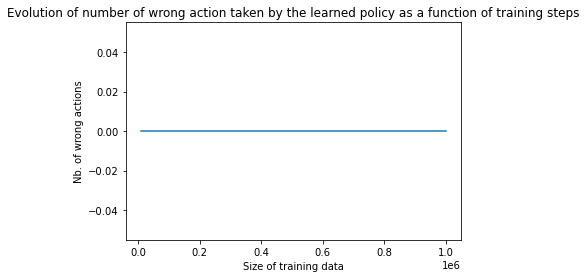


 Wrong actions : 
Optimal policy derived !!


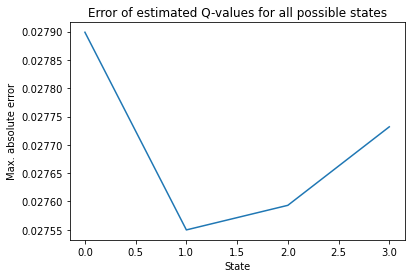


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.9


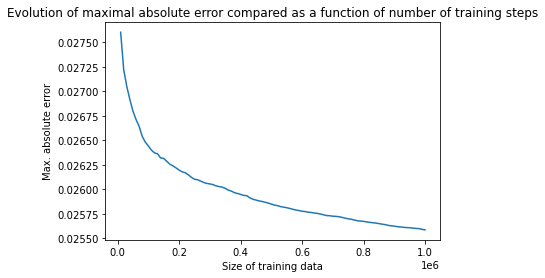

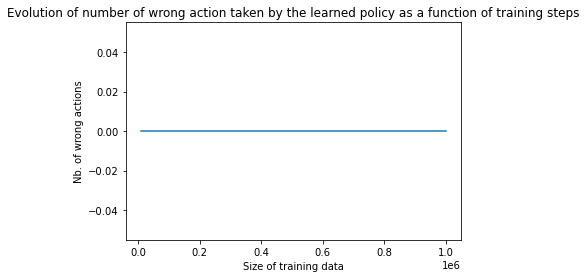


 Wrong actions : 
Optimal policy derived !!


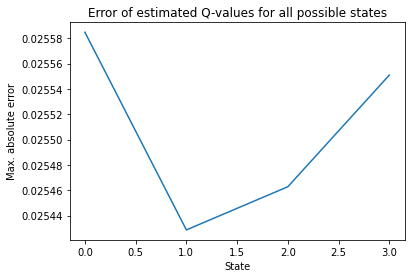


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.8


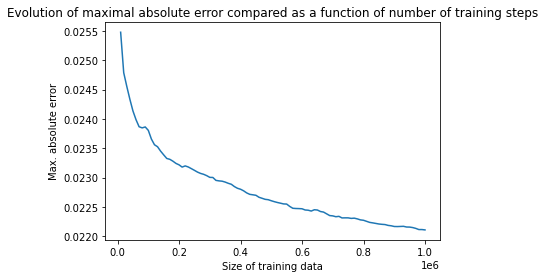

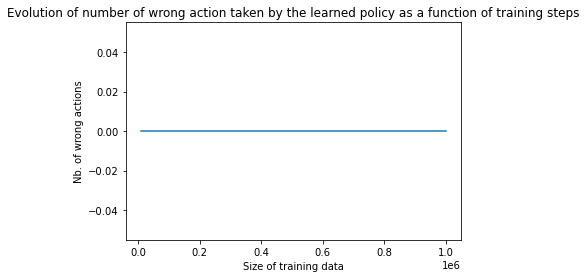


 Wrong actions : 
Optimal policy derived !!


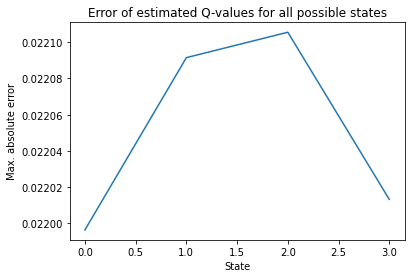


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.6


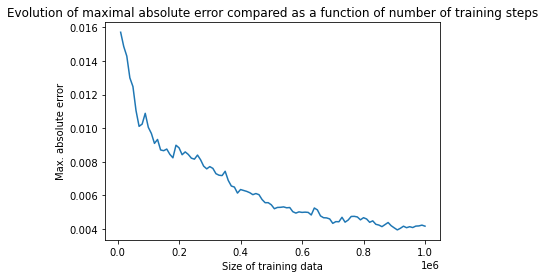

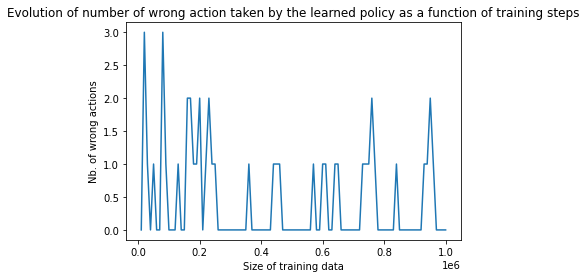


 Wrong actions : 
Optimal policy derived !!


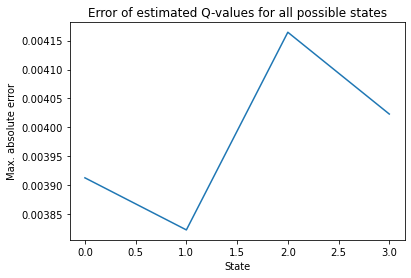


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


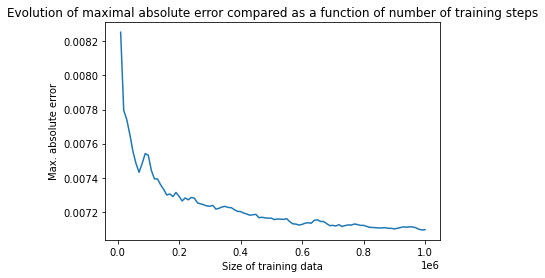

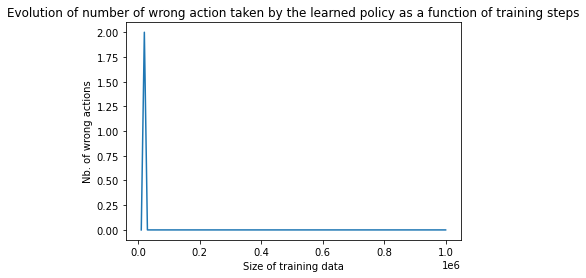


 Wrong actions : 
Optimal policy derived !!


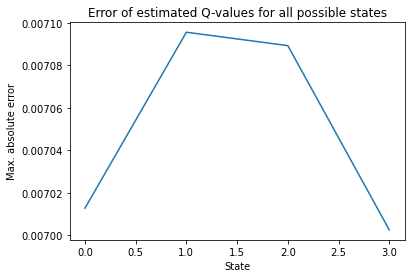


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


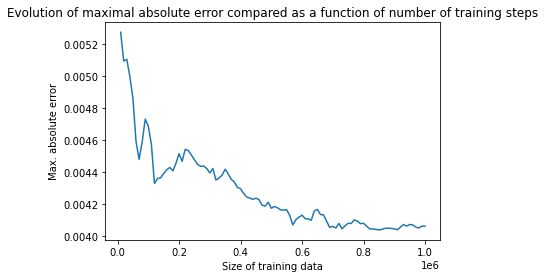

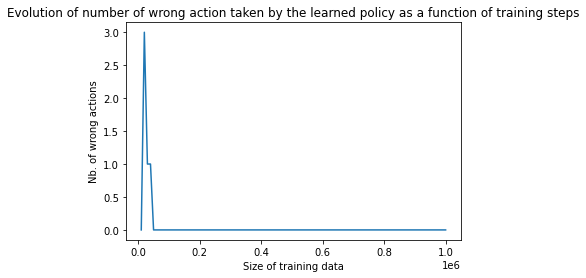


 Wrong actions : 
Optimal policy derived !!


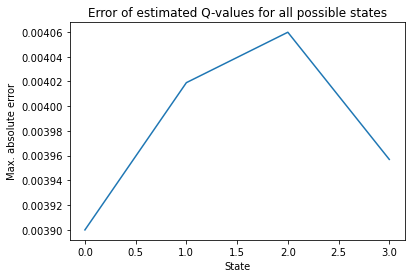


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


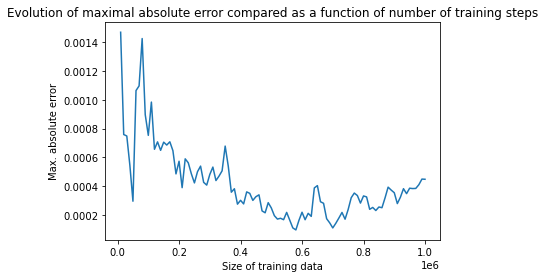

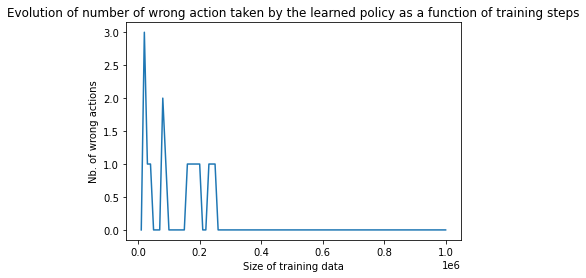


 Wrong actions : 
Optimal policy derived !!


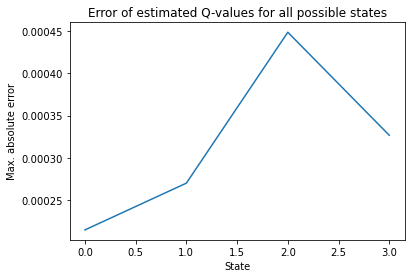


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


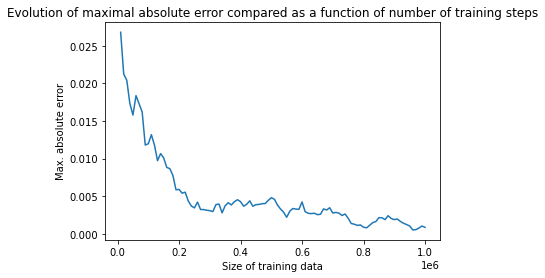

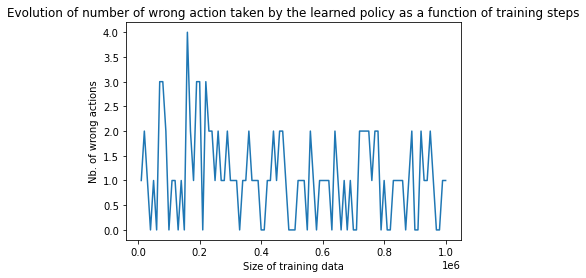


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


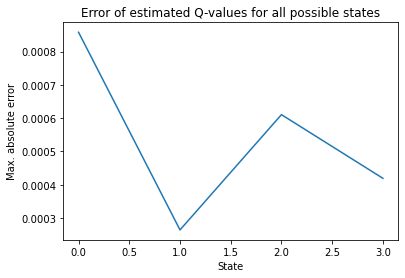


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


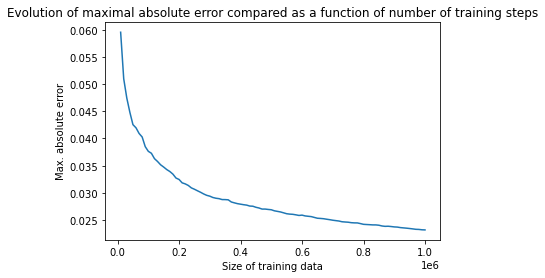

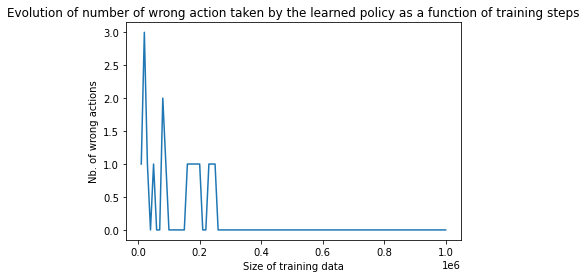


 Wrong actions : 
Optimal policy derived !!


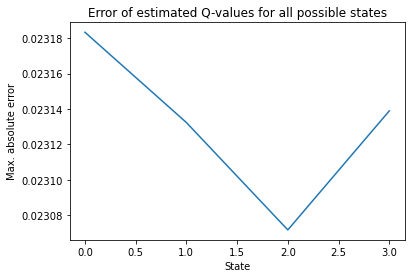


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


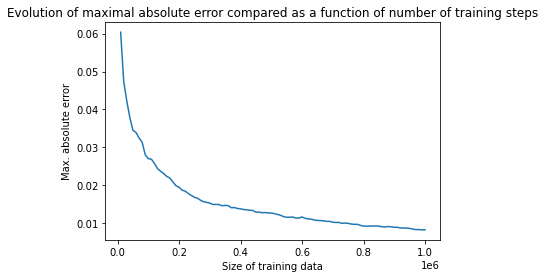

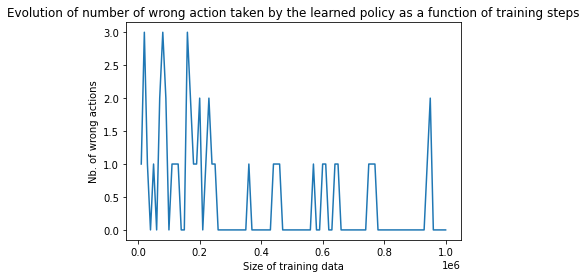


 Wrong actions : 
Optimal policy derived !!


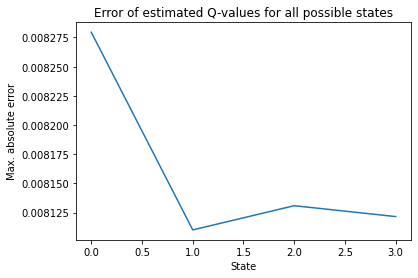


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


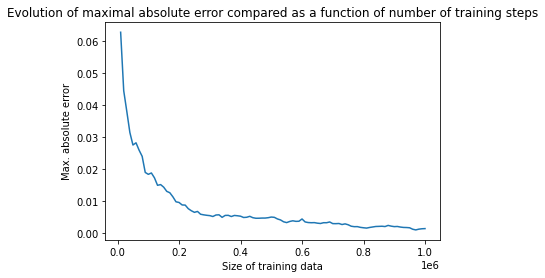

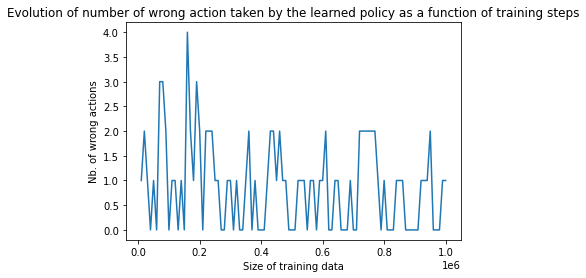


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


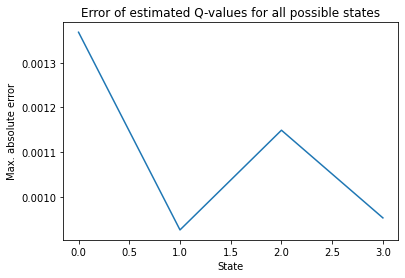


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


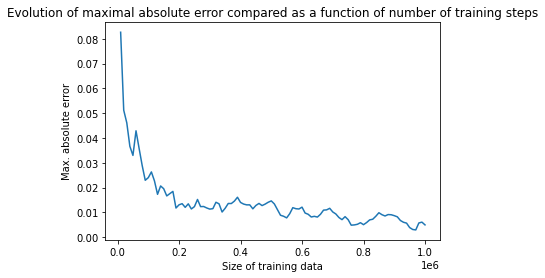

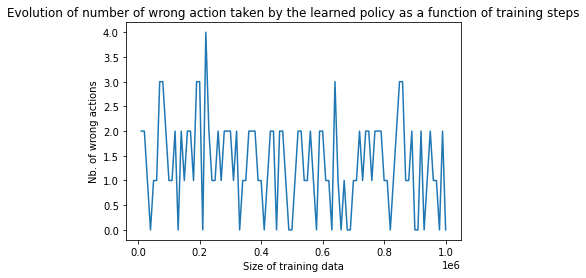


 Wrong actions : 
Optimal policy derived !!


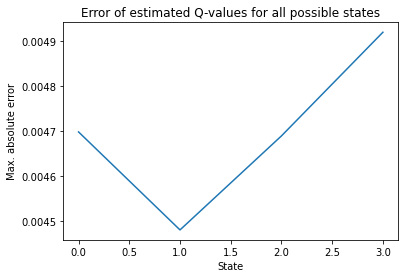


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


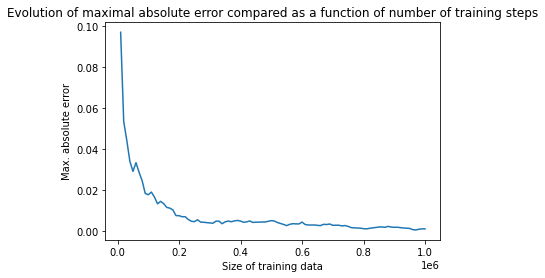

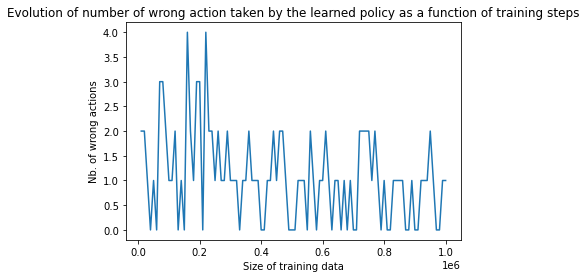


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7


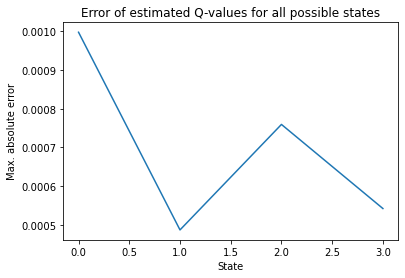


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.9


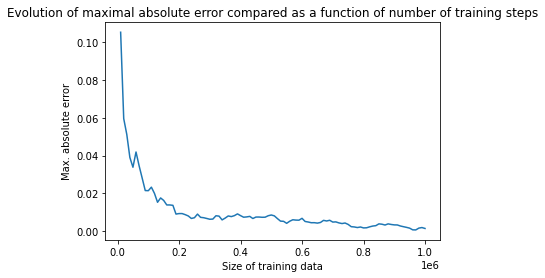

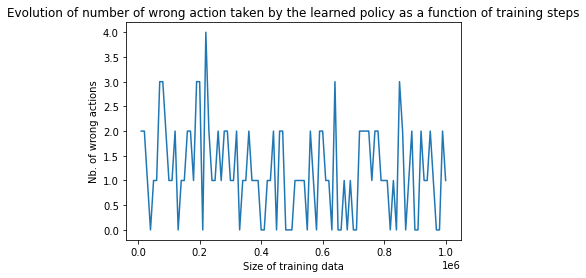


 Wrong actions : 
[0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


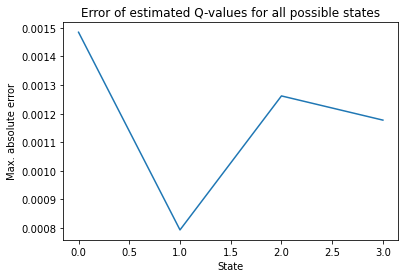


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


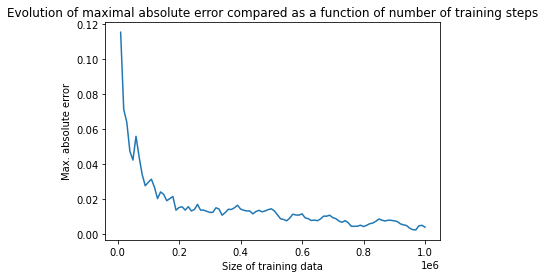

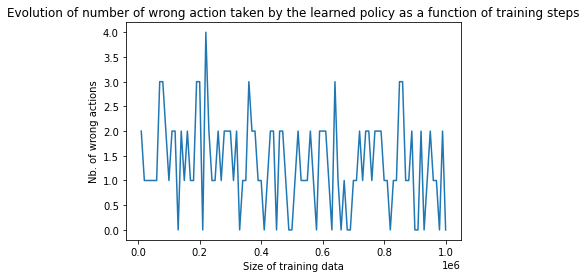


 Wrong actions : 
Optimal policy derived !!


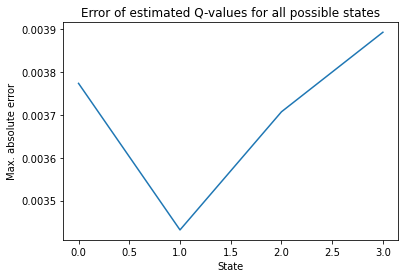


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


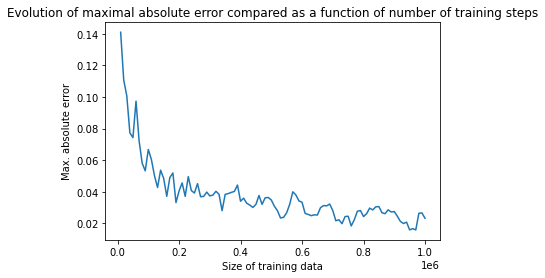

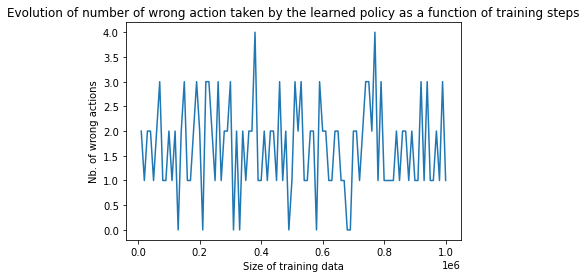


 Wrong actions : 
[0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7


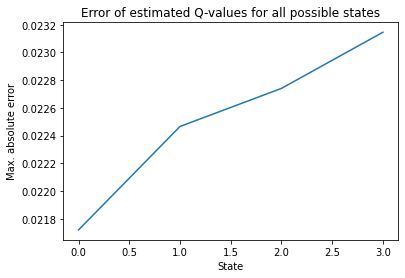

In [38]:
for x in res_w_adaptlr:
    plot_res_multi_QLearning(x,true_qval_w)

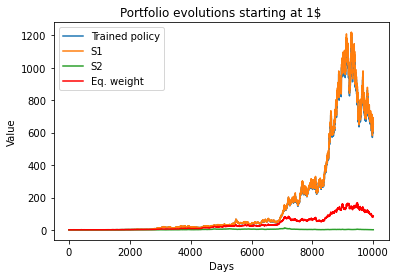

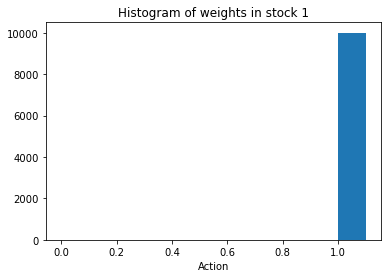

In [39]:
plot_result(res_w[4]['exploit_test'])

In [40]:
res_w[4]['q_val']

{'[0.98, 0.98]': array([0.03774472, 0.03785235, 0.03795195, 0.03804354, 0.03812712,
        0.0382027 , 0.03827027, 0.03832983, 0.0383814 , 0.03842496,
        0.03846052]),
 '[1.02, 1.02]': array([0.03768055, 0.03778155, 0.03787455, 0.03795955, 0.03803654,
        0.03810554, 0.03816654, 0.03821956, 0.03826458, 0.03830161,
        0.03833064]),
 '[1.02, 0.98]': array([0.03750901, 0.037639  , 0.03776098, 0.03787496, 0.03798093,
        0.0380789 , 0.03816888, 0.03825087, 0.03832487, 0.03839088,
        0.0384489 ]),
 '[0.98, 1.02]': array([0.03771822, 0.03782502, 0.03792385, 0.03801472, 0.03809764,
        0.03817261, 0.03823963, 0.03829871, 0.03834984, 0.03839303,
        0.03842827])}

Found optimal policy really fast and estimated q-value function is close to the true ones.

#### Optimal policy found quickly

Estimated Q-values also really close to true state-action value function.

### However, there are at least one wrong action if $\lambda < 0.1$
Such variations apppear as for a smaller decay rate, the learning rate is larger and thus the updates for the Q-table are also bigger. The values of the true optimal policy for any state differs only by $0.008$ as we computed the expectations, hence the convergence will need a little bit more training data to converge entirely.

#### Window = 2

In [15]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.8]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_w,index=['S1','S2']) ,np.array(test_ret_w),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin_w,true_qval_w))])
            
    res_w_w2 = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


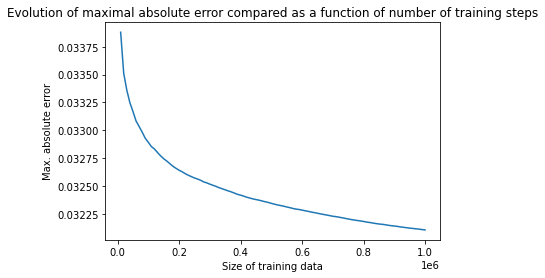

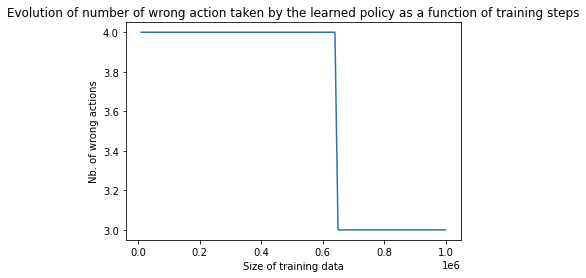


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


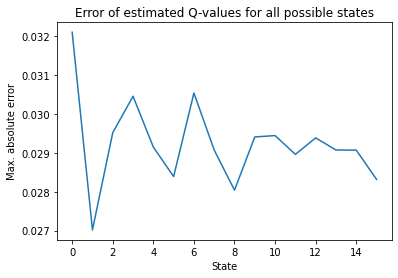


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


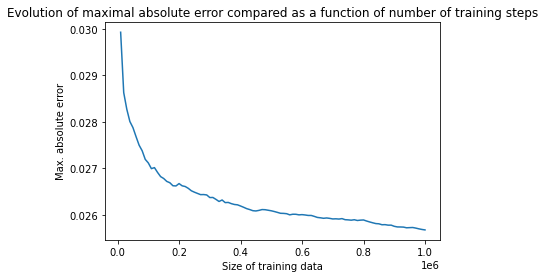

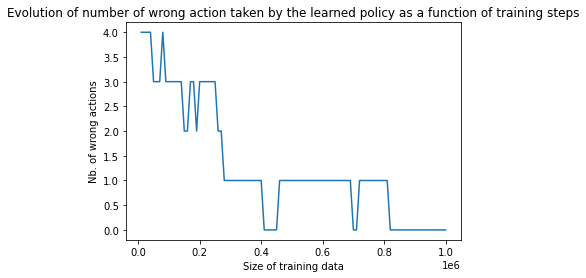


 Wrong actions : 
Optimal policy derived !!


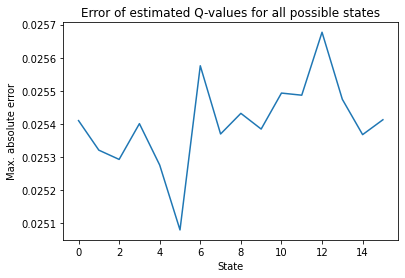


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


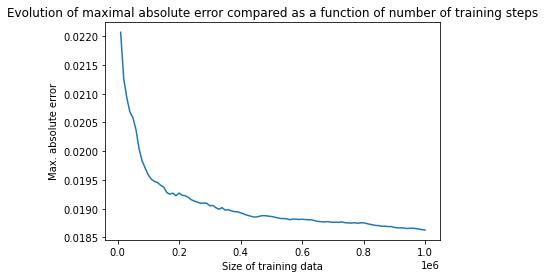

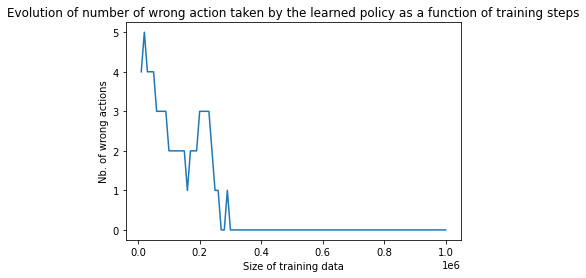


 Wrong actions : 
Optimal policy derived !!


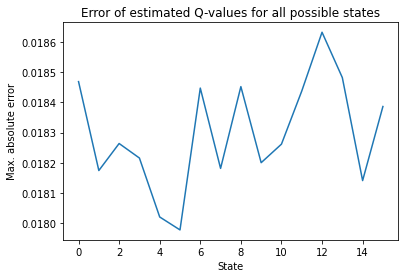


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


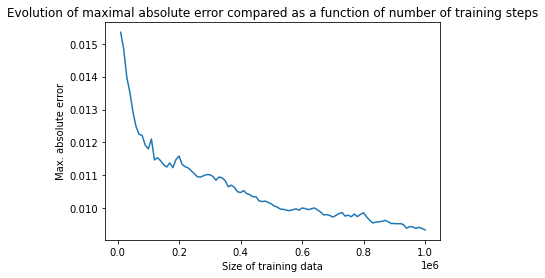

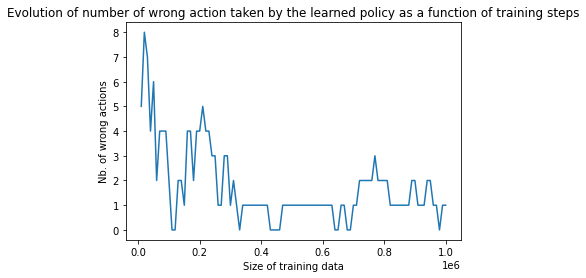


 Wrong actions : 
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


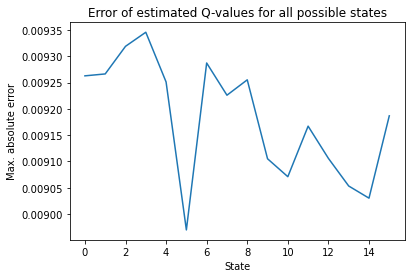


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


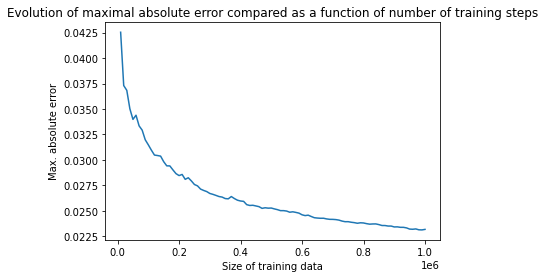

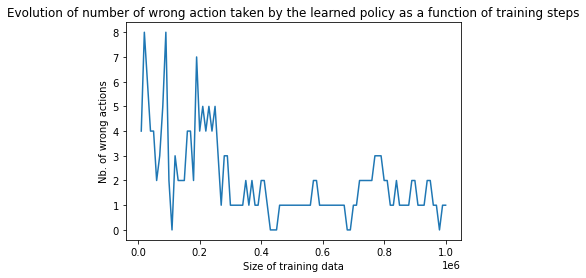


 Wrong actions : 
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


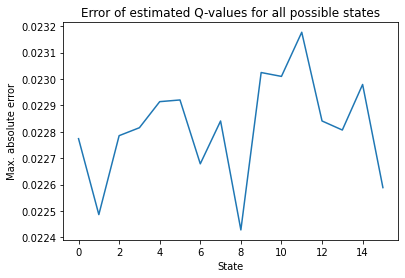


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


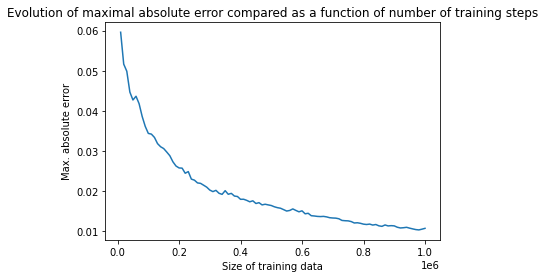

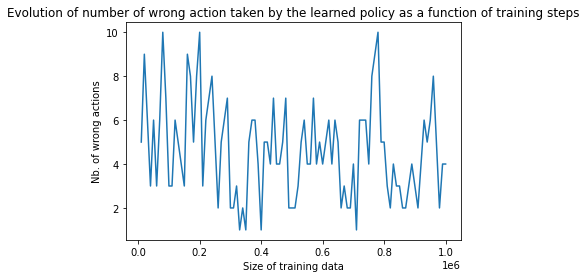


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  4
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  6


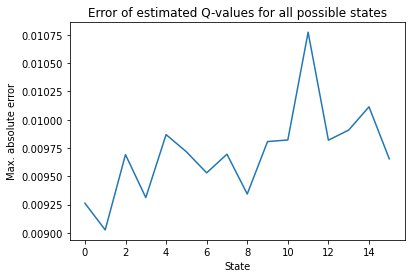


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


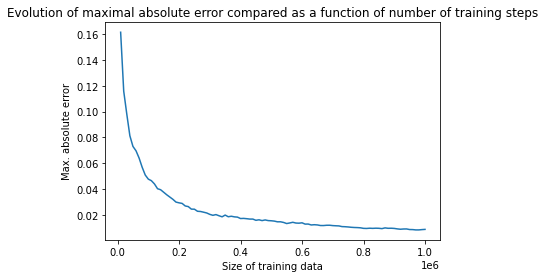

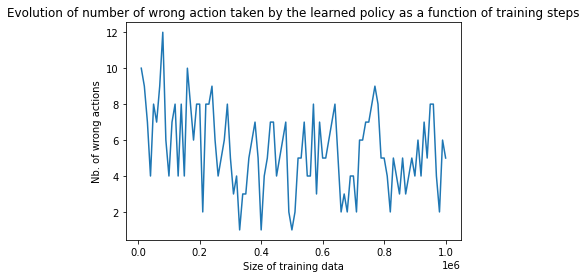


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  3
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


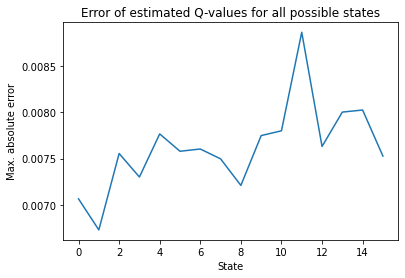


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


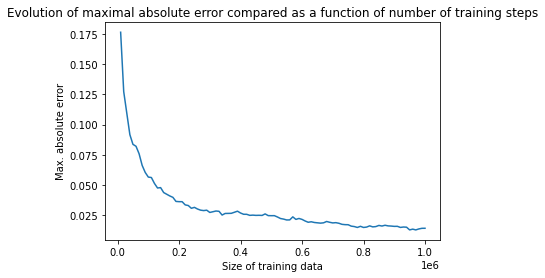

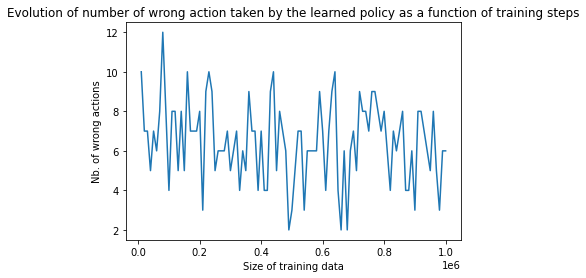


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  6
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8


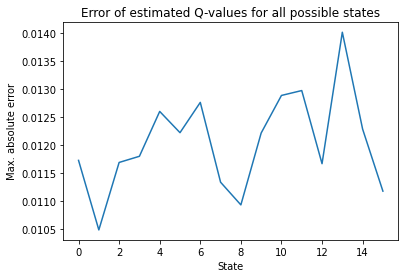

In [16]:
for x in res_w_w2:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin_w,true_qval_w))

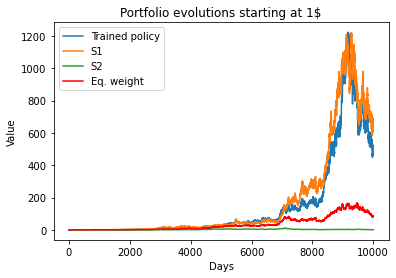

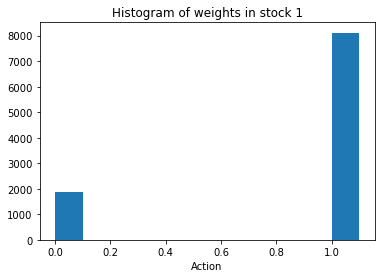

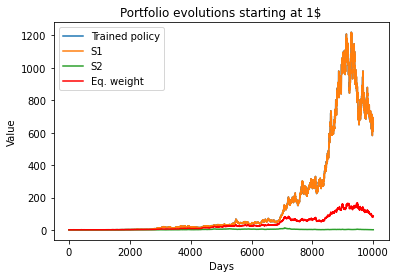

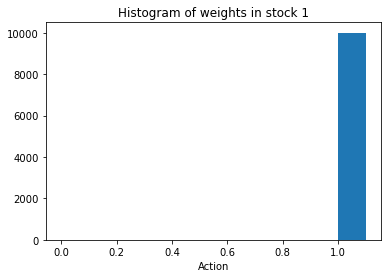

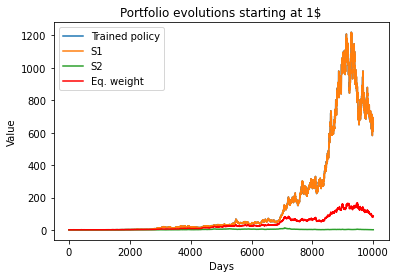

...

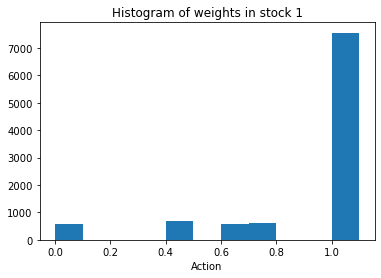

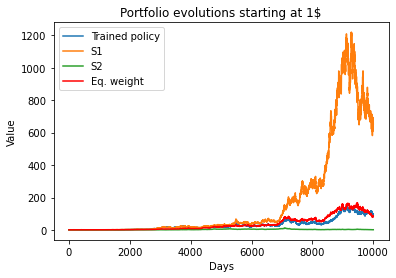

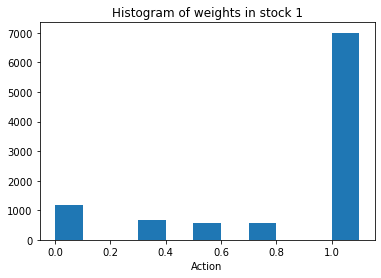

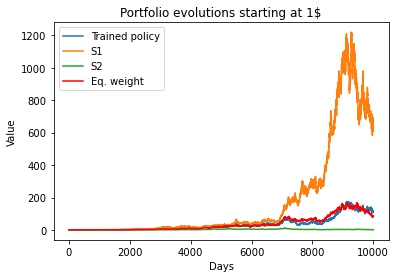

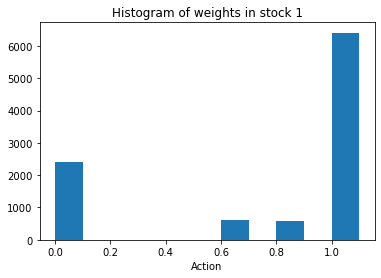

In [23]:
for x in res_w_w2:
    plot_result(x['exploit_test'])

In [17]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1,0.01]:
        for tau in [1,0.8]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_w,index=['S1','S2']) ,np.array(test_ret_w),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin_w,true_qval_w),adaptive_lr=True)])
            
    res_w_w2_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


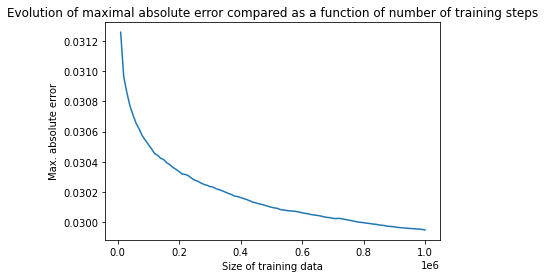

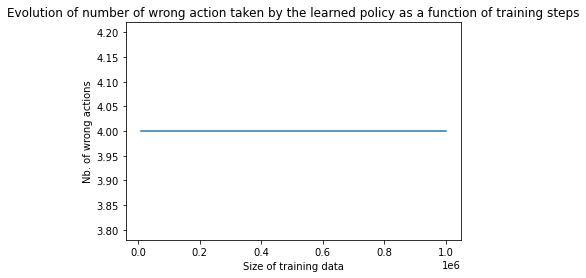


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


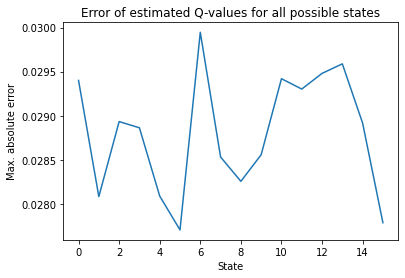


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.8


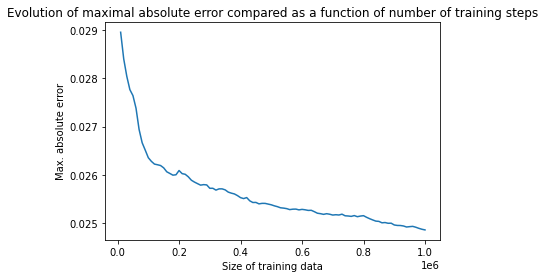

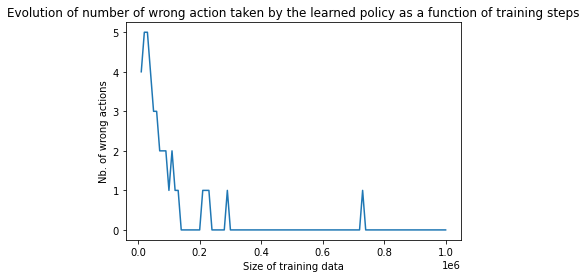


 Wrong actions : 
Optimal policy derived !!


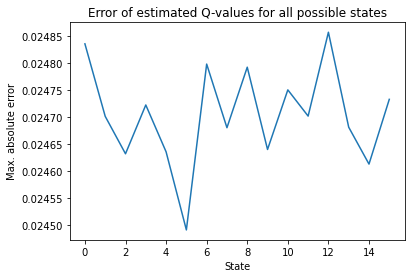


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


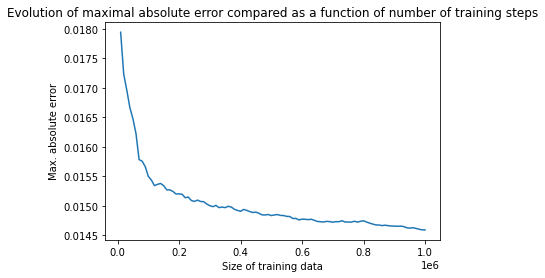

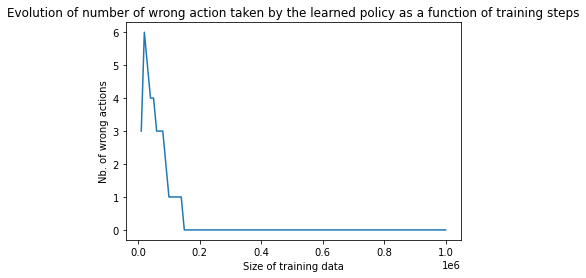


 Wrong actions : 
Optimal policy derived !!


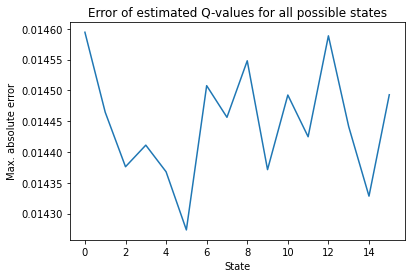


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


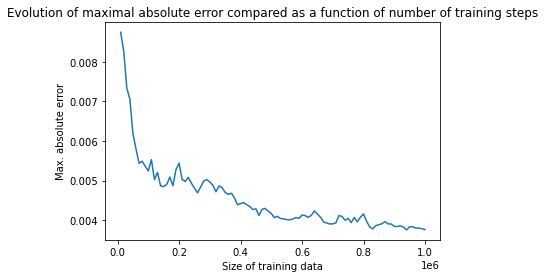

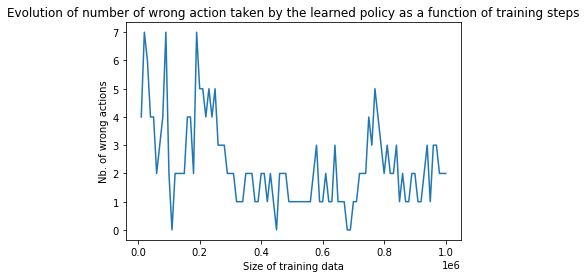


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7


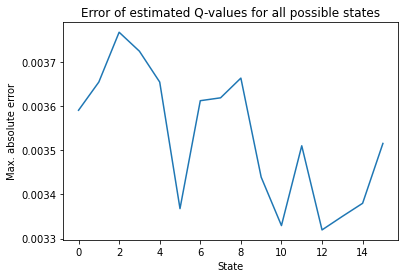


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


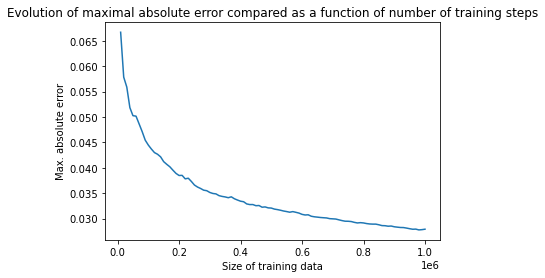

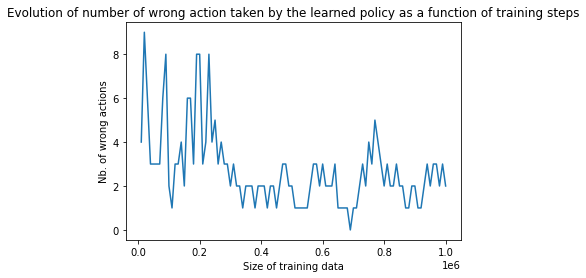


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  6


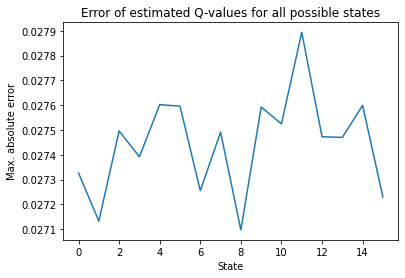


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


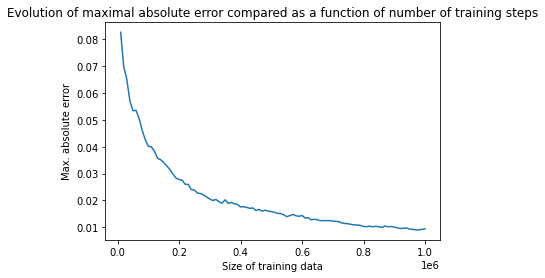

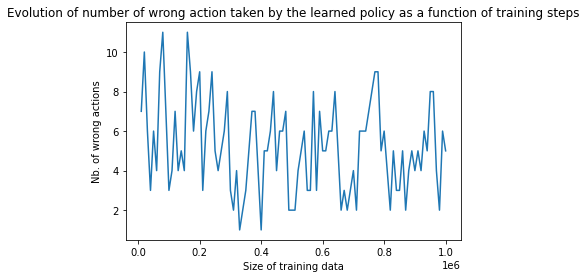


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  3
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


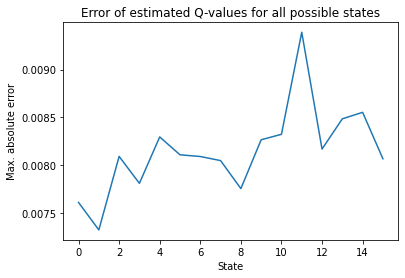


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


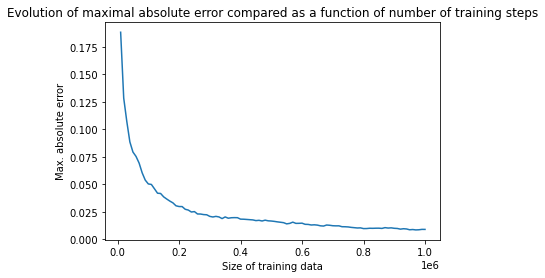

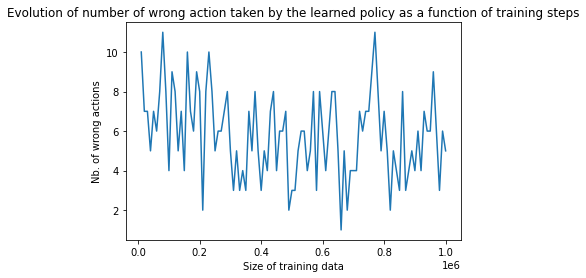


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


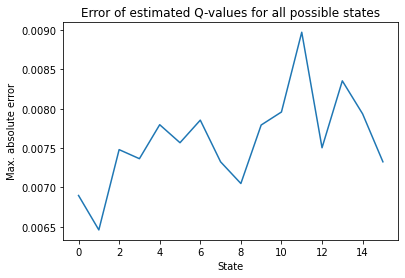


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


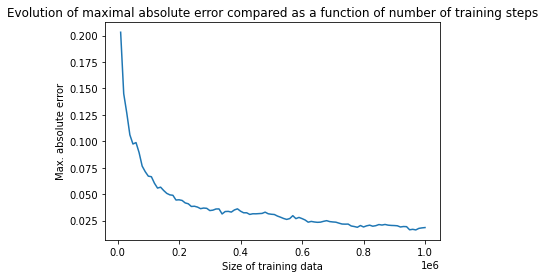

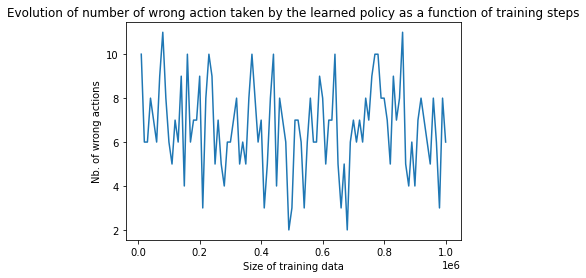


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9


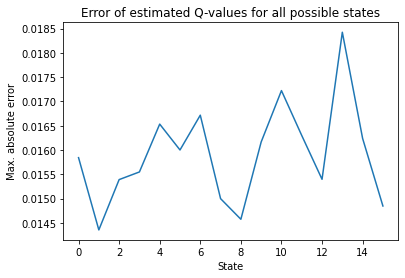

In [18]:
for x in res_w_w2_adaptlr:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin_w,true_qval_w))

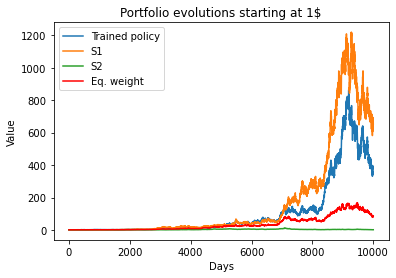

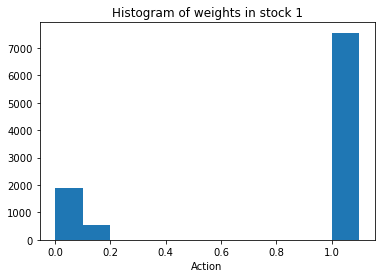

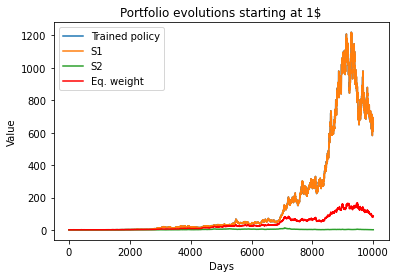

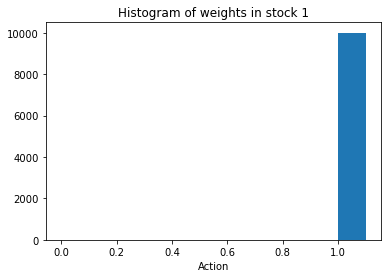

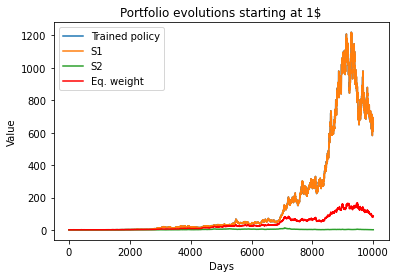

...

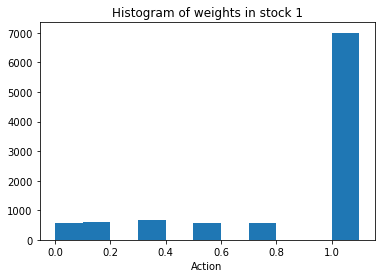

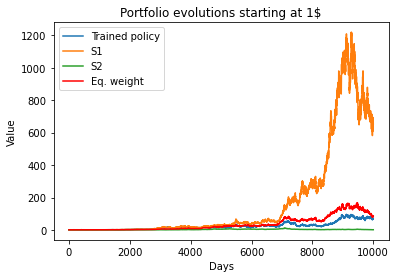

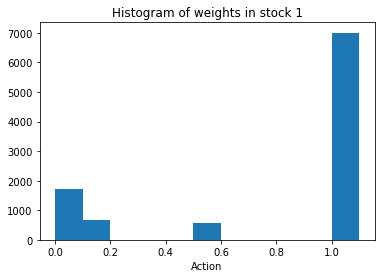

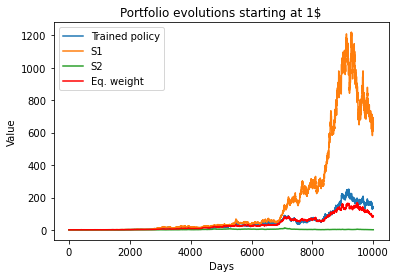

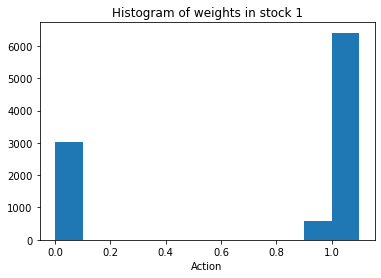

In [22]:
for x in res_w_w2_adaptlr:
    plot_result(x['exploit_test'])

#### Optimal policy found quickly for $\lambda = 0.1$

Same as for window ($w= 1$), but higher errors compared to true Q-values. It makes sense as there are more state for $w=2$.

A simple definition for the learning rate with a quite high decay rate is better than more complex definition with some power given by $\tau=0.8$ or $\tau =0.6$ for example.

# Higher $u$ for stock 1
Same probability $p$ and same down value $d$, no correlation but first stock satisfies $u_1=u2+0.01$. Thus optimal policy should always choose policy having higher up value.
\begin{equation*}
\begin{split}
    \mathbb{E}[r_{1,t}] &= 0.5\cdot 1.03 + 0.5 \cdot 0.98 = 1.005\\
    \mathbb{E}[r_{2,t}] &= 0.5\cdot 1.02 + 0.5\cdot 0.98 = 1.0
\end{split}
\end{equation*}

The difference in this case is higher compared to the previous simulation with $p_1=0.52$

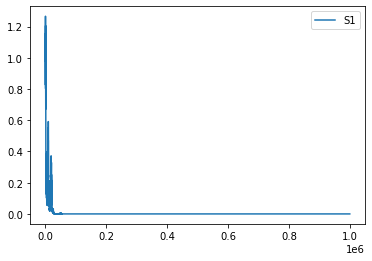

In [2]:
simplebin_u=SimpleBinomial(1.03,0.98,0.5,u2=1.02)
# Less simulations otherwise we get infinity for the value of S1.
Nsample=1000000
ret_u=simplebin_u.simulate(Nsample+1)
# plt.plot(np.cumprod(ret_u[0,:]))
plt.plot(np.cumprod(ret_u[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [13]:
Nsim=10000
test_ret_u=simplebin_u.simulate(Nsim)
np.mean(test_ret_u,axis=1)

array([1.00518 , 0.999724])

In [14]:
true_qval_u=simplebin_u.true_qval()

Time needed to converge with delta =  1e-05  :  307


In [15]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_u,index=['S1','S2']) ,np.array(test_ret_u),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval_u)])
            
    res_u = pool.map(multi_train_QLearning, params)
    


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


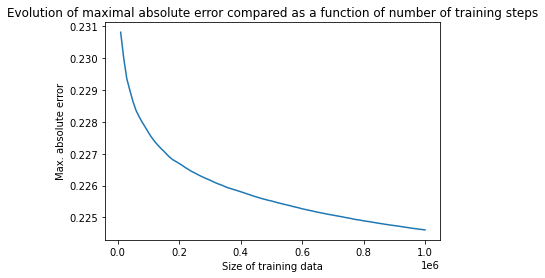

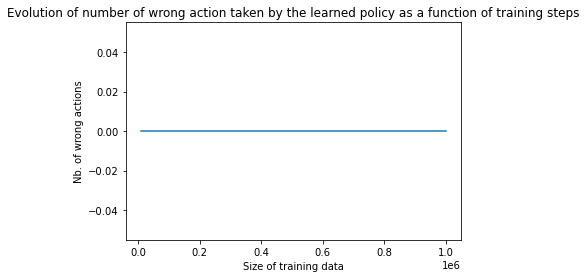


 Wrong actions : 
Optimal policy derived !!


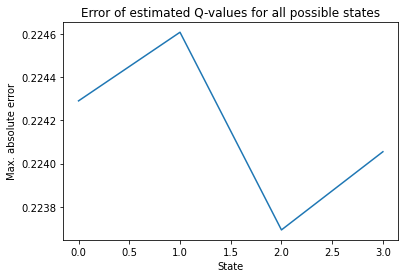


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


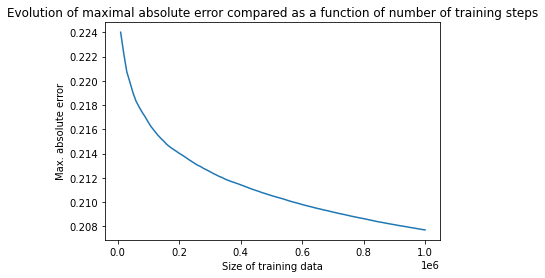

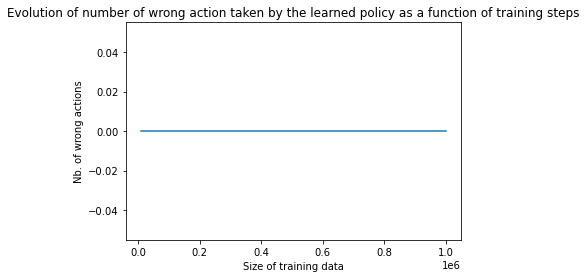


 Wrong actions : 
Optimal policy derived !!


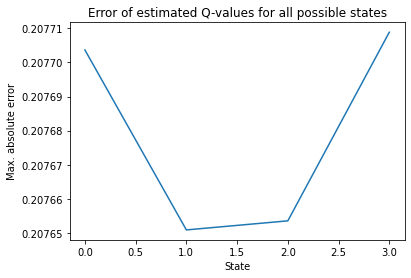


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


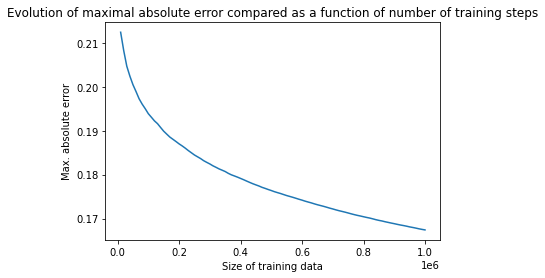

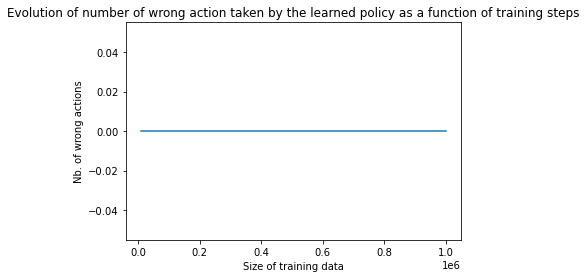


 Wrong actions : 
Optimal policy derived !!


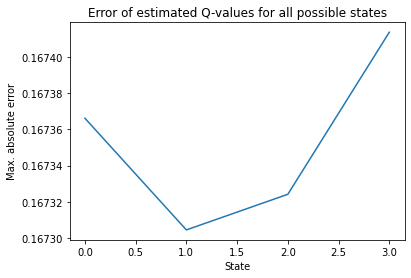


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


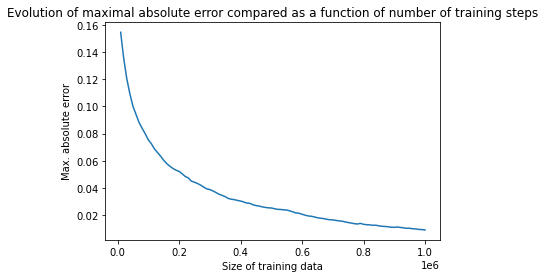

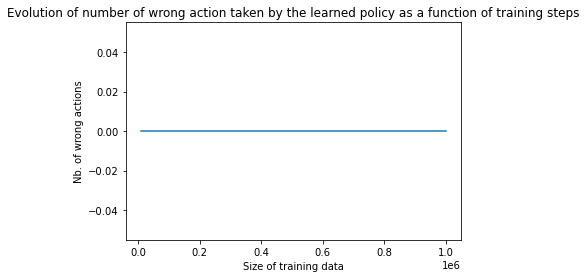


 Wrong actions : 
Optimal policy derived !!


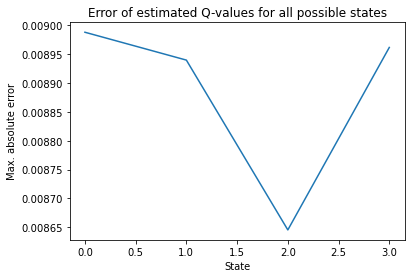


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


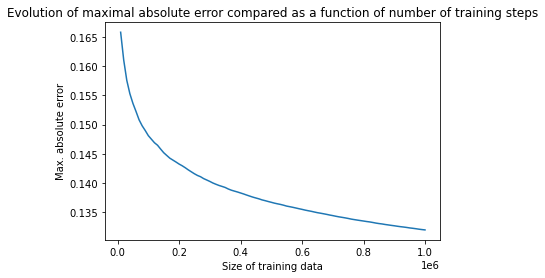

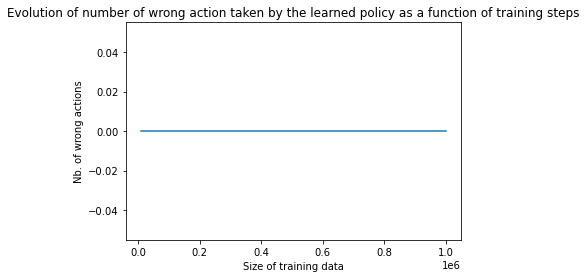


 Wrong actions : 
Optimal policy derived !!


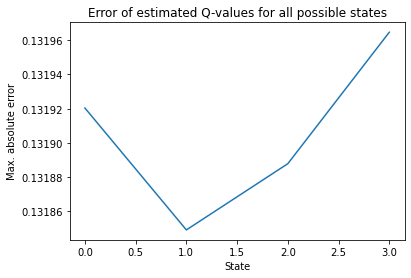


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


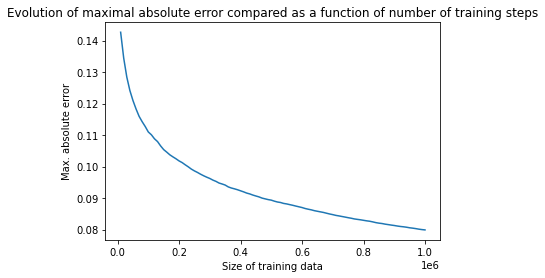

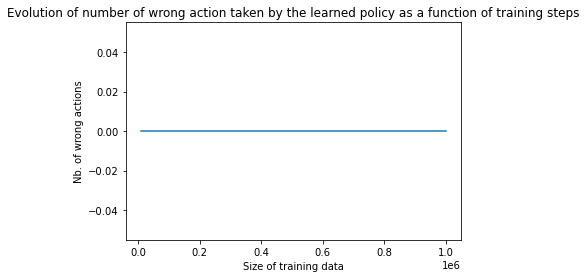


 Wrong actions : 
Optimal policy derived !!


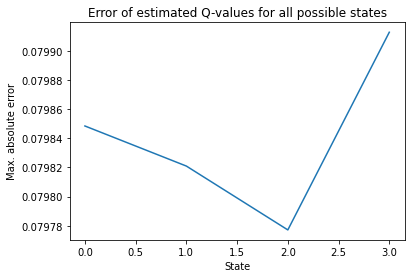


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


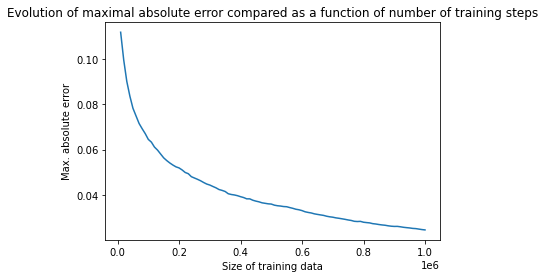

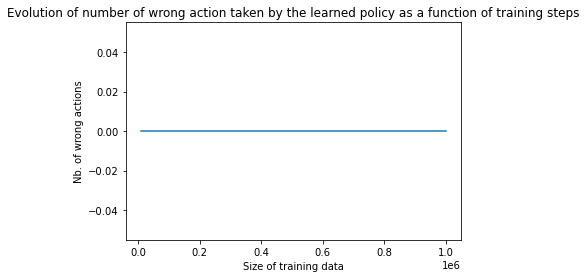


 Wrong actions : 
Optimal policy derived !!


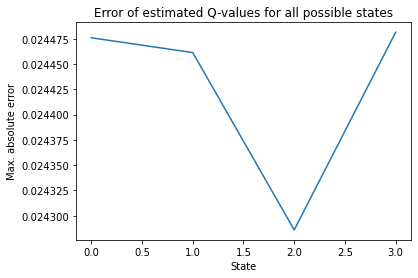


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


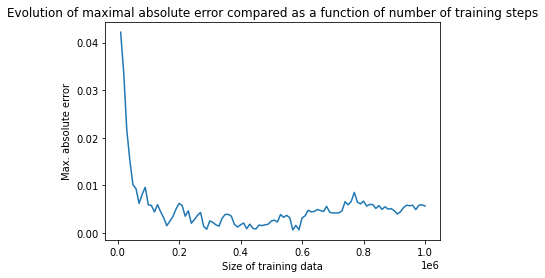

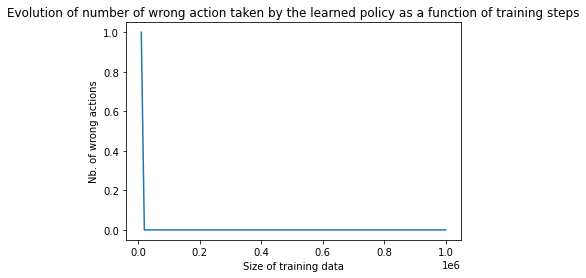


 Wrong actions : 
Optimal policy derived !!


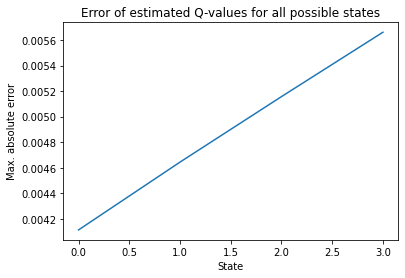


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


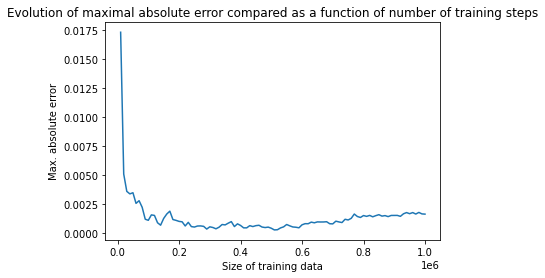

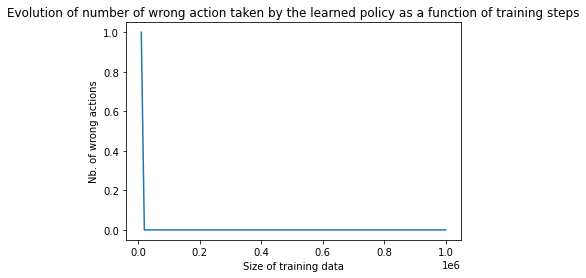


 Wrong actions : 
Optimal policy derived !!


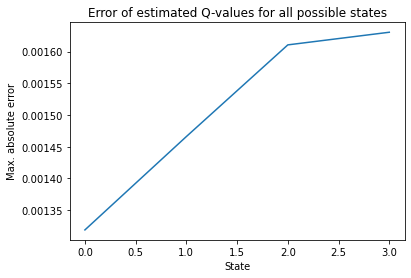


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


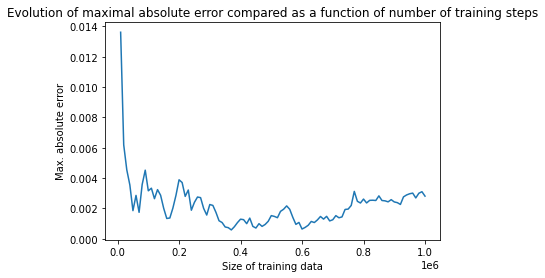

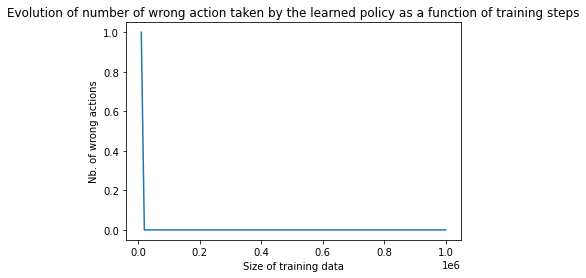


 Wrong actions : 
Optimal policy derived !!


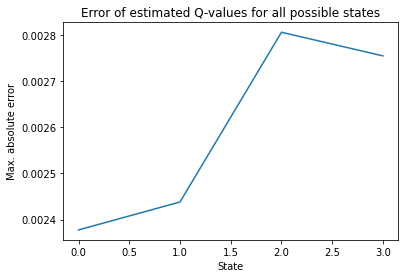


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


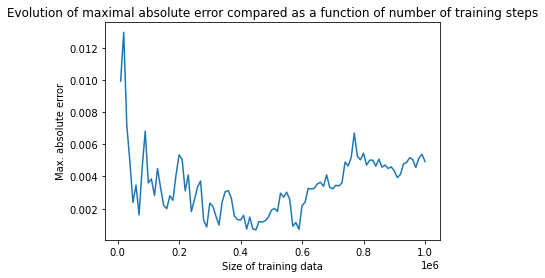

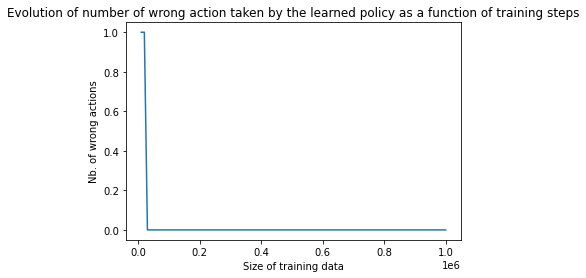


 Wrong actions : 
Optimal policy derived !!


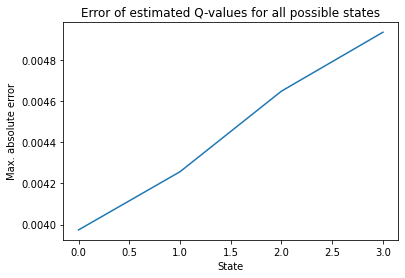


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


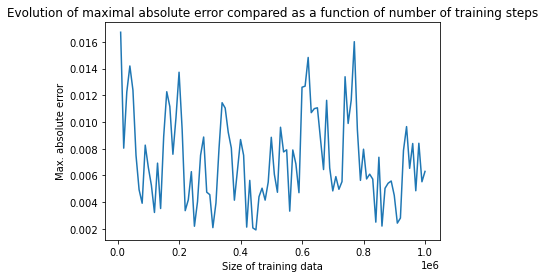

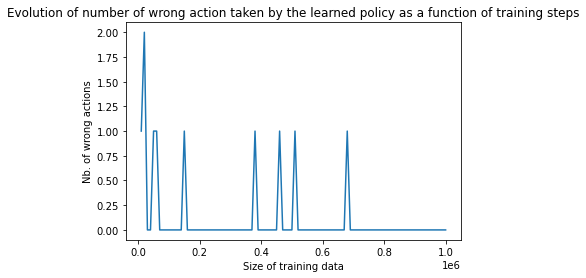


 Wrong actions : 
Optimal policy derived !!


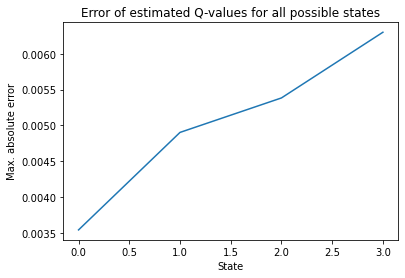


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


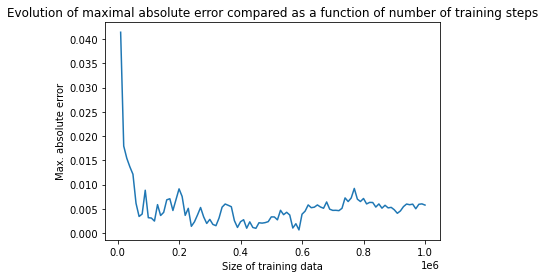

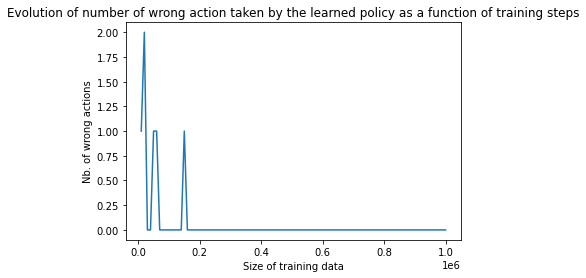


 Wrong actions : 
Optimal policy derived !!


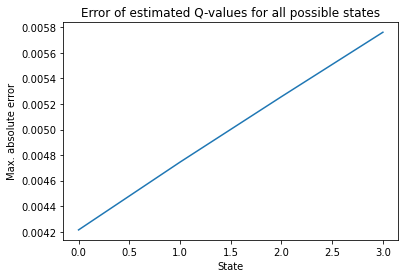


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


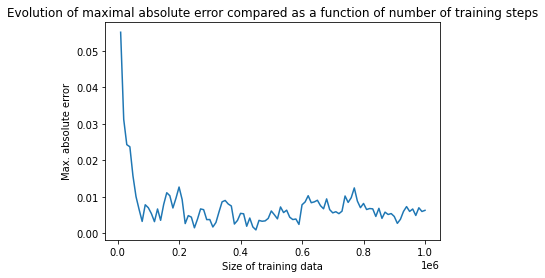

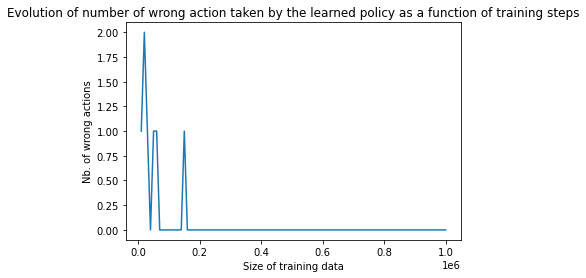


 Wrong actions : 
Optimal policy derived !!


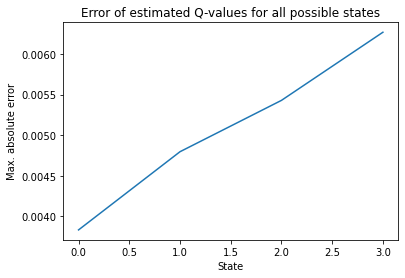


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


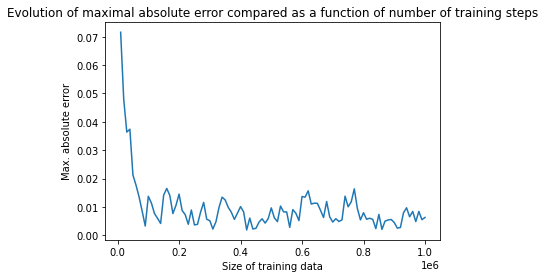

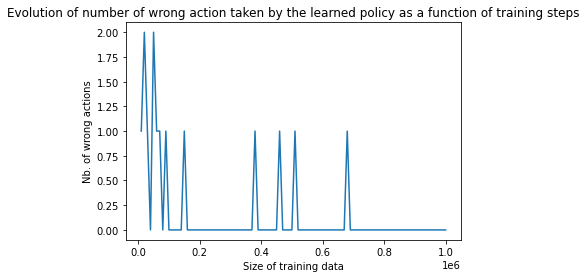


 Wrong actions : 
Optimal policy derived !!


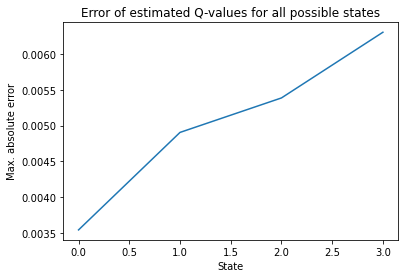


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


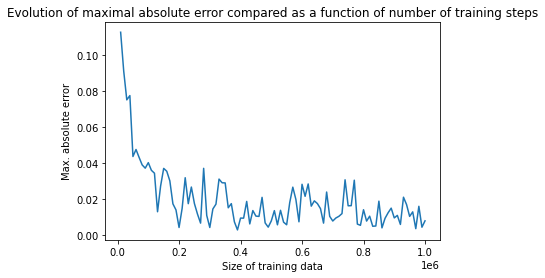

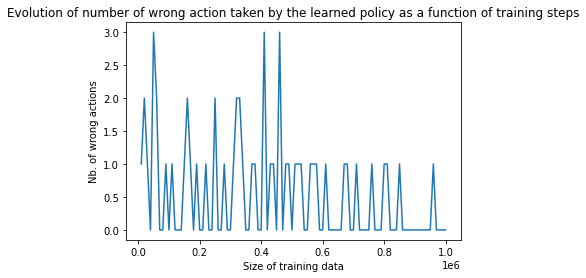


 Wrong actions : 
Optimal policy derived !!


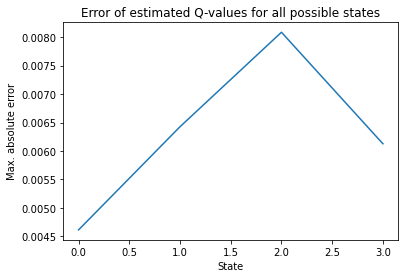

In [16]:
for x in res_u:
    plot_res_multi_QLearning(x,true_qval_u)

In [17]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1,0.01]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_u,index=['S1','S2']) ,np.array(test_ret_u),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval_u,adaptive_lr=True)])
            
    res_u_adaptlr = pool.map(multi_train_QLearning, params)
    


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


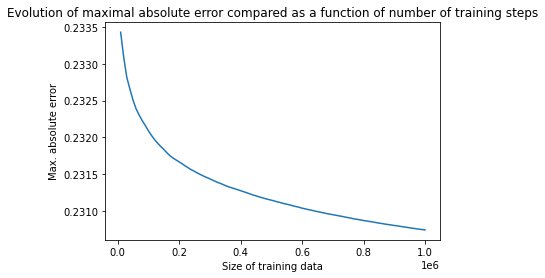

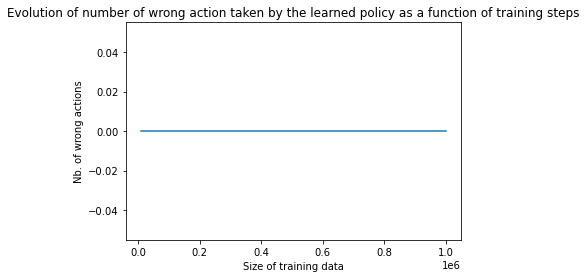


 Wrong actions : 
Optimal policy derived !!


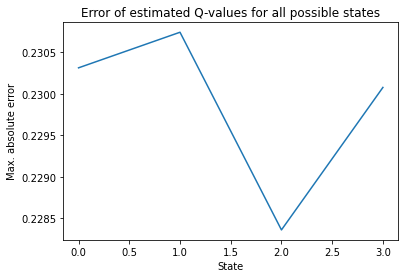


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.9


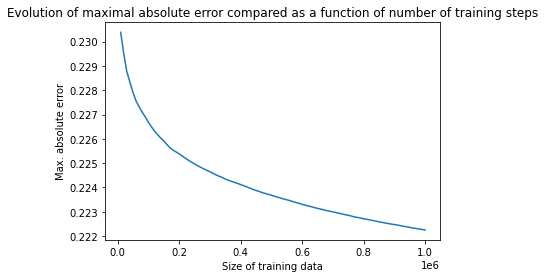

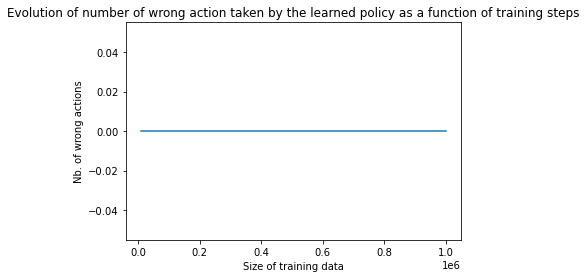


 Wrong actions : 
Optimal policy derived !!


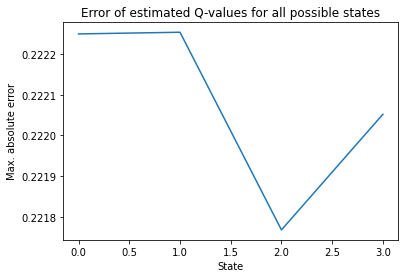


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.8


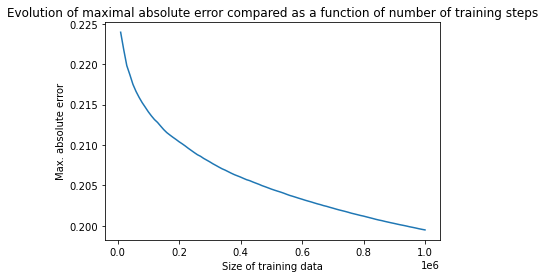

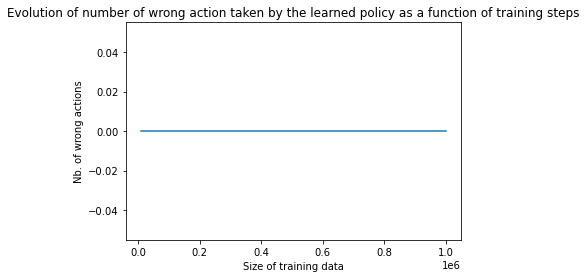


 Wrong actions : 
Optimal policy derived !!


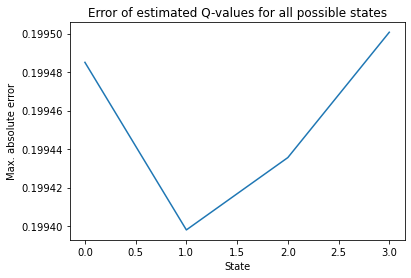


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.6


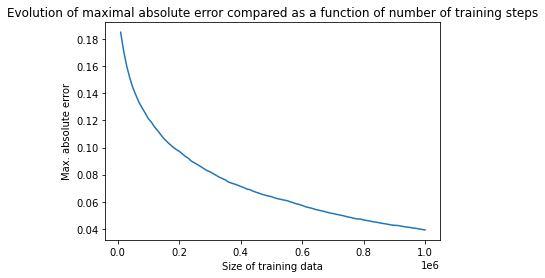

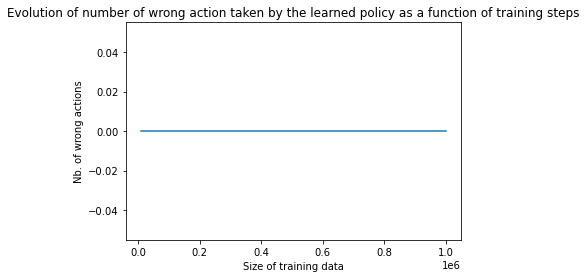


 Wrong actions : 
Optimal policy derived !!


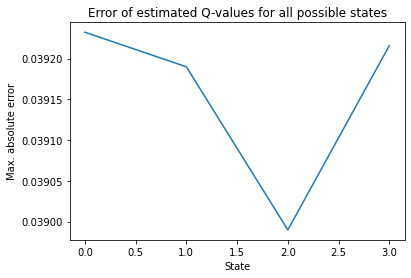


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


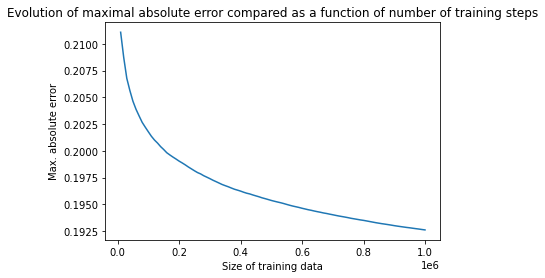

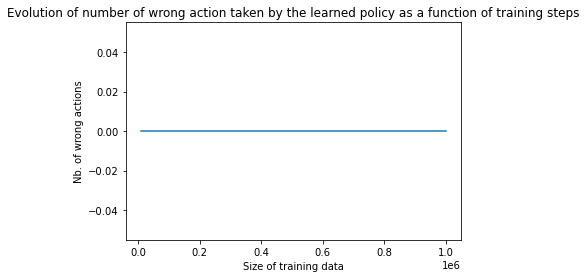


 Wrong actions : 
Optimal policy derived !!


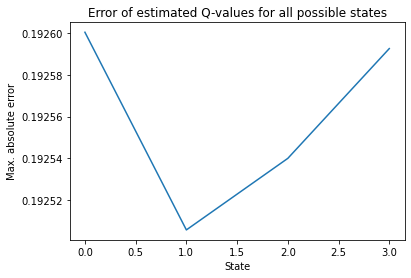


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


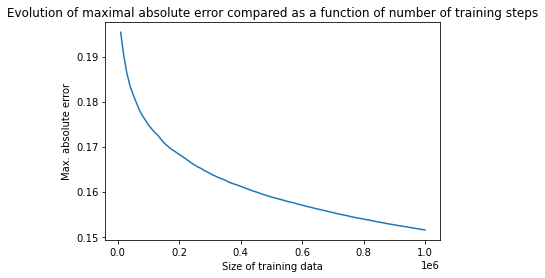

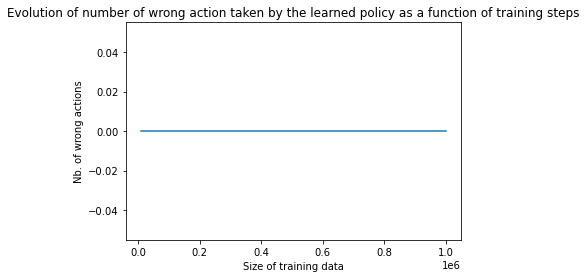


 Wrong actions : 
Optimal policy derived !!


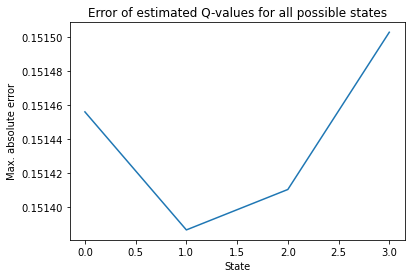


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


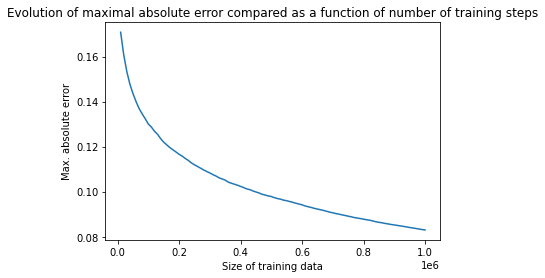

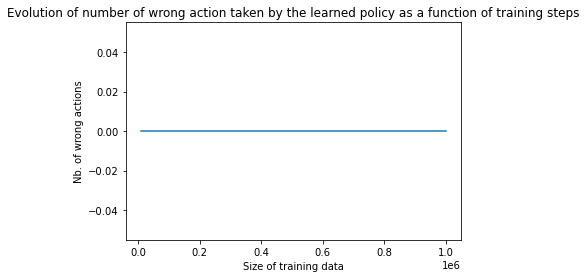


 Wrong actions : 
Optimal policy derived !!


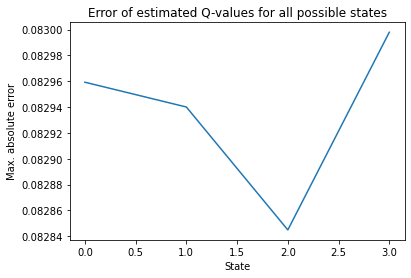


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


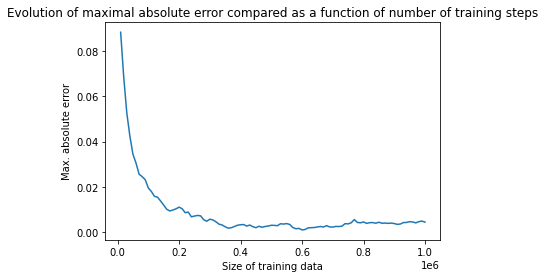

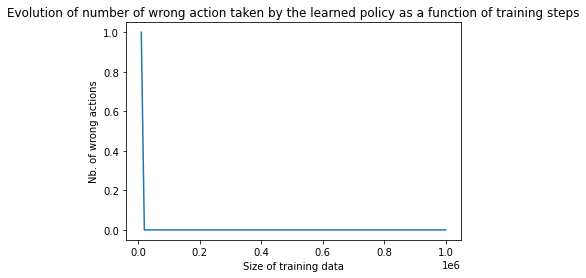


 Wrong actions : 
Optimal policy derived !!


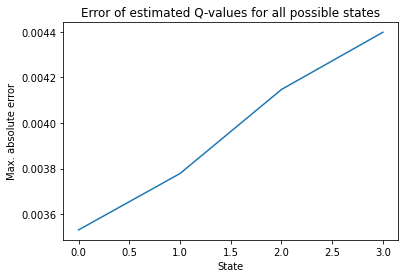


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


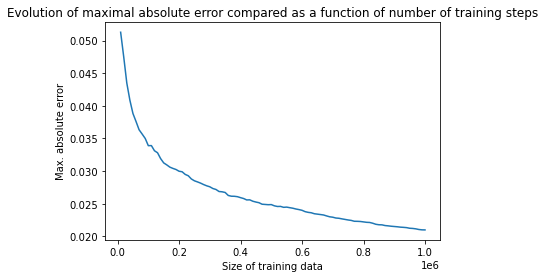

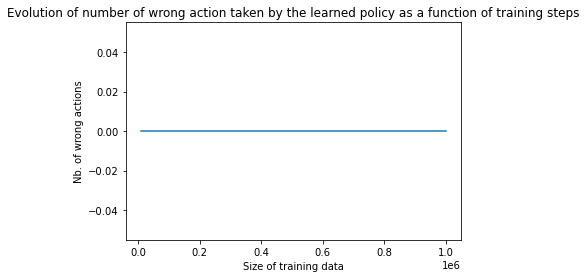


 Wrong actions : 
Optimal policy derived !!


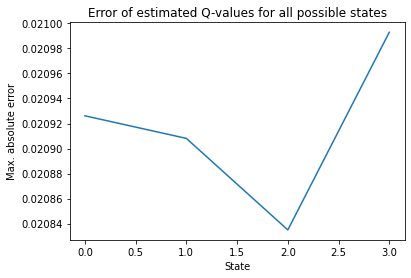


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


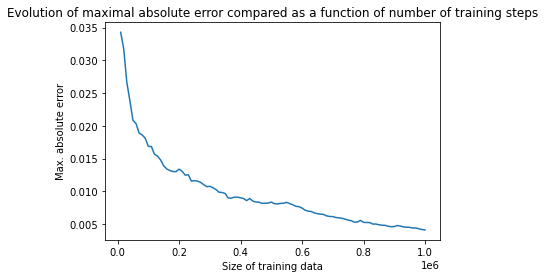

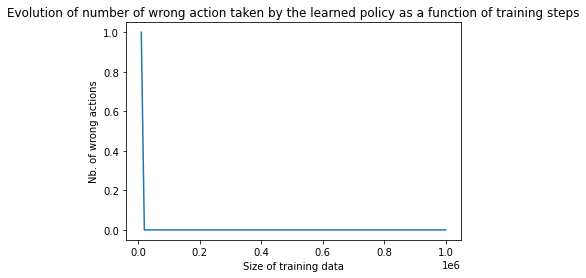


 Wrong actions : 
Optimal policy derived !!


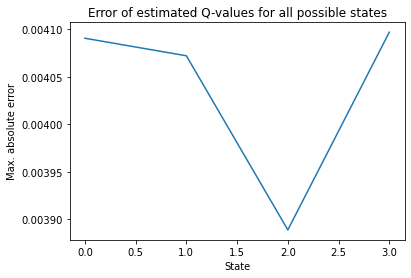


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


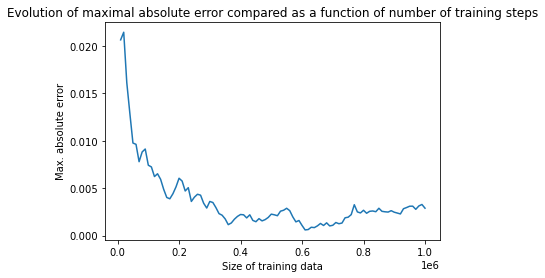

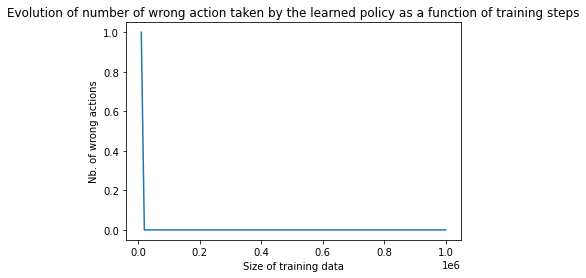


 Wrong actions : 
Optimal policy derived !!


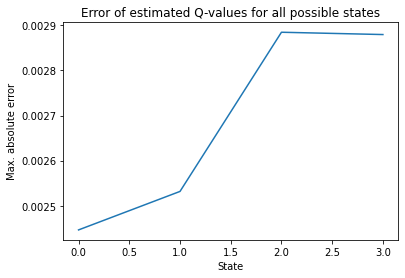


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


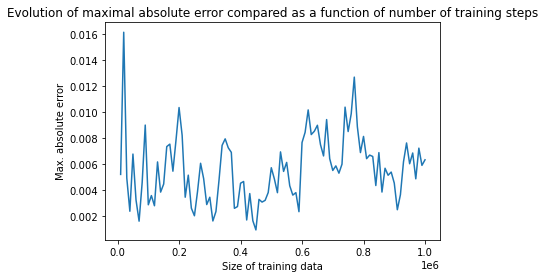

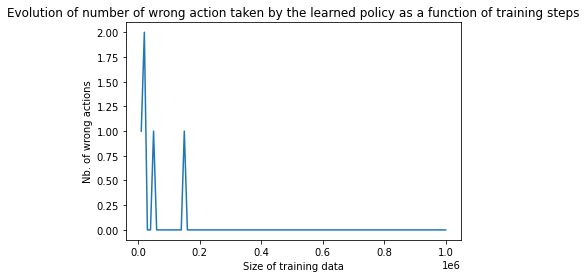


 Wrong actions : 
Optimal policy derived !!


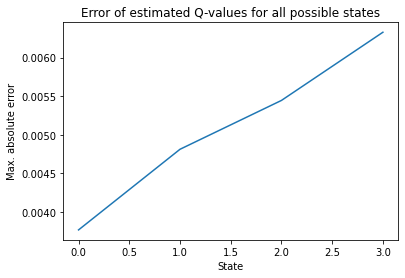


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


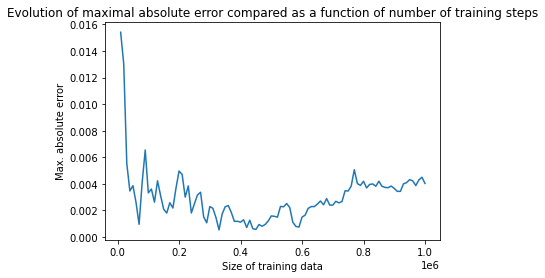

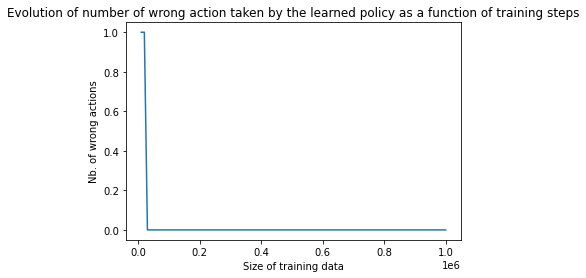


 Wrong actions : 
Optimal policy derived !!


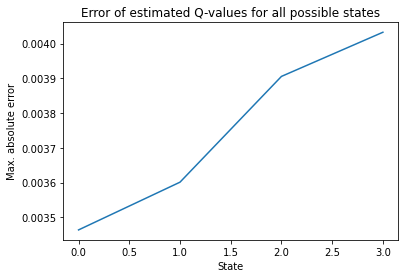


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.9


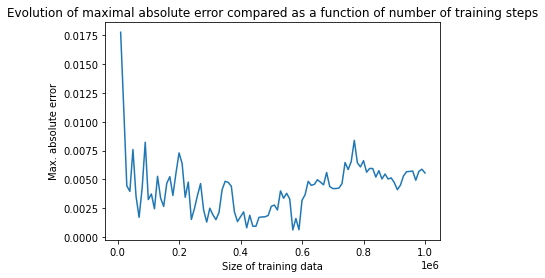

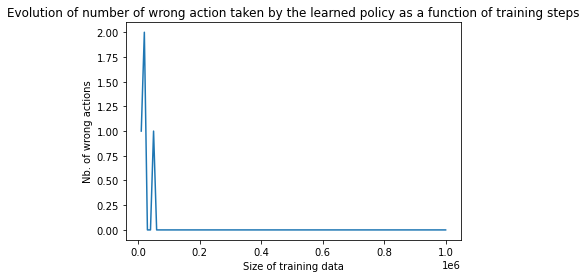


 Wrong actions : 
Optimal policy derived !!


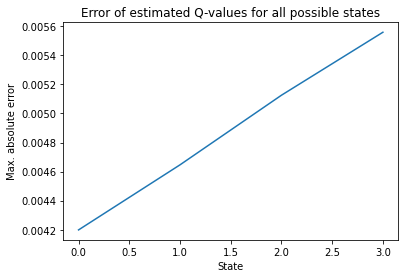


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


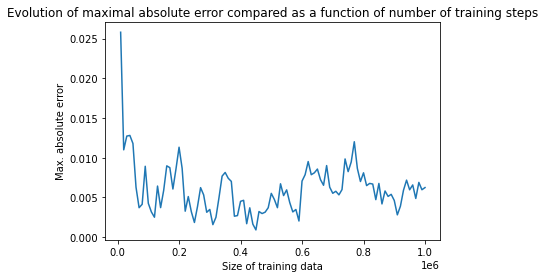

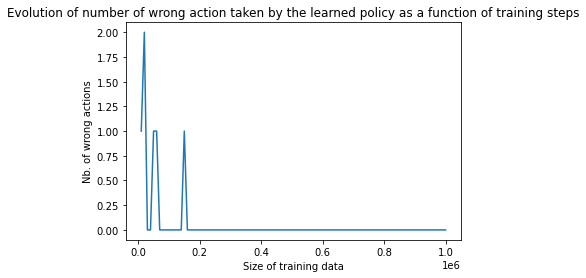


 Wrong actions : 
Optimal policy derived !!


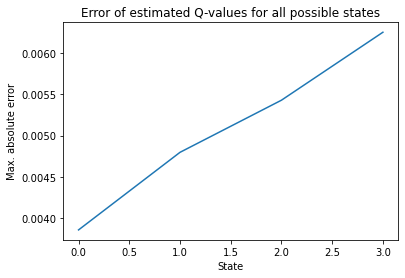


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


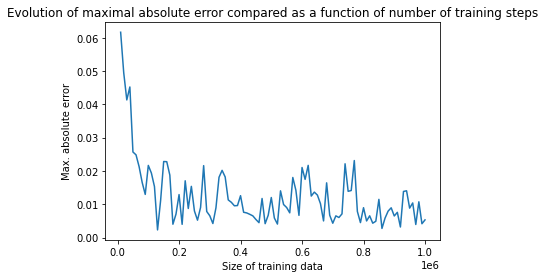

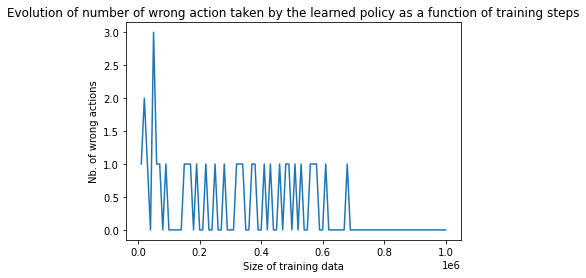


 Wrong actions : 
Optimal policy derived !!


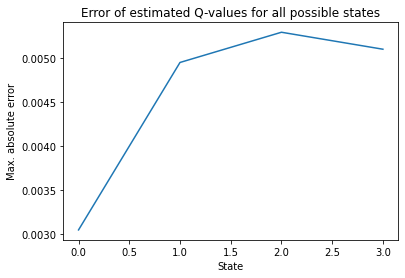

In [18]:
for x in res_u_adaptlr:
    plot_res_multi_QLearning(x,true_qval_u)

#### Optimal policy found for different parameters for the learning rate.

We see that the optimal policy was learned almost immediately, the error between estimated and true Q-values gets really low except with $\lambda=0.1$.

### Impact of smaller decay rate

It leads to approximately $10$ times smaller error when choosing $\tau =0.01$ instead of $\tau=0.1$, however the learned policy was already optimal.

### Window = 2

In [19]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_u,index=['S1','S2']) ,np.array(test_ret_u),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin_u,true_qval_u))])
            
    res_u_w2 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


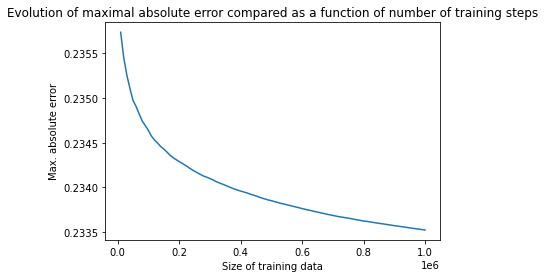

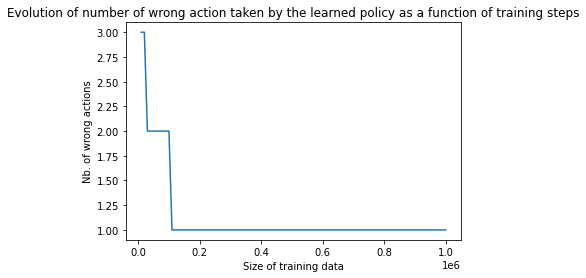


 Wrong actions : 
[1.03, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


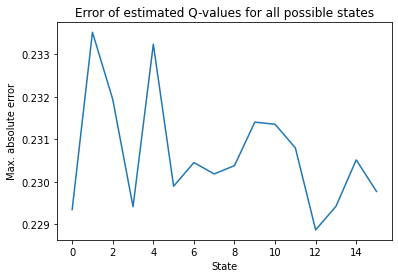


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


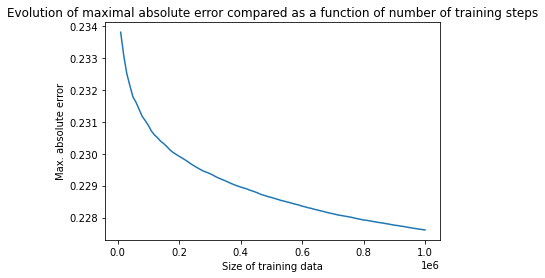

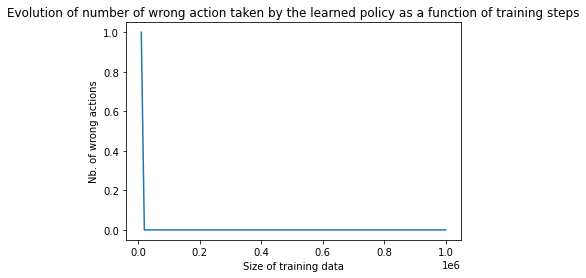


 Wrong actions : 
Optimal policy derived !!


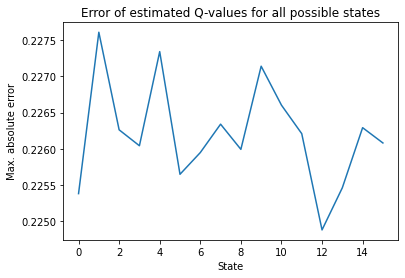


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


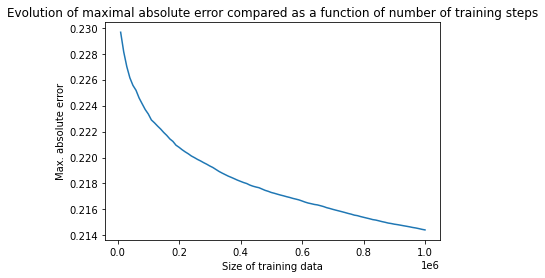

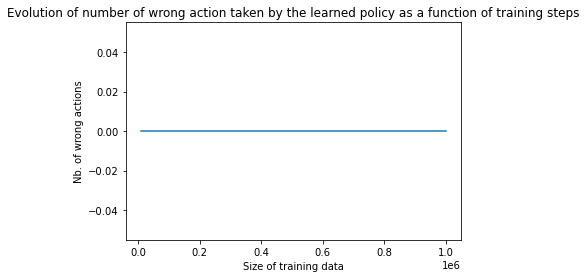


 Wrong actions : 
Optimal policy derived !!


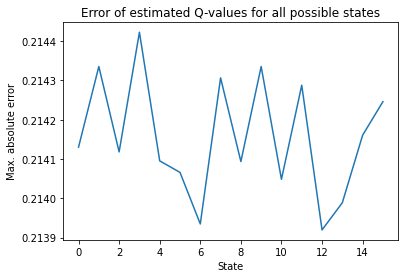


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


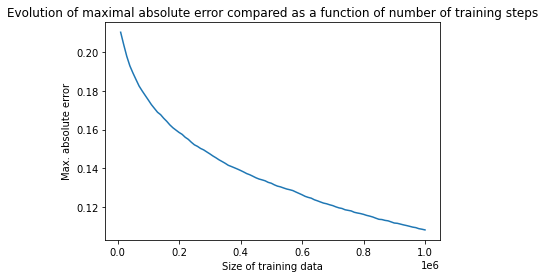

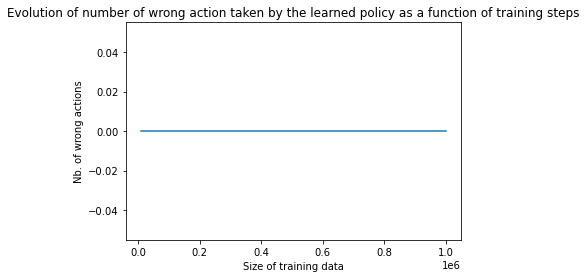


 Wrong actions : 
Optimal policy derived !!


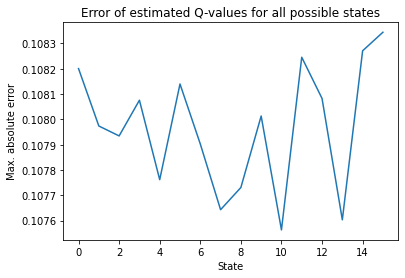


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


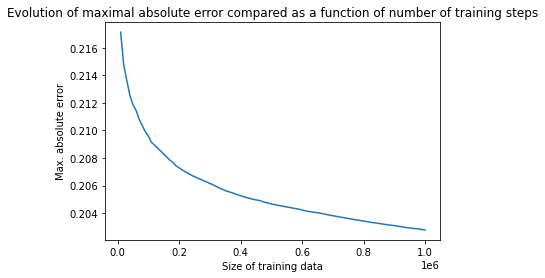

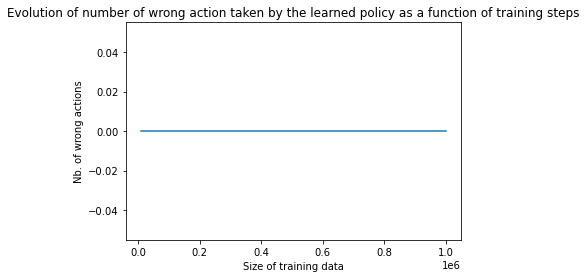


 Wrong actions : 
Optimal policy derived !!


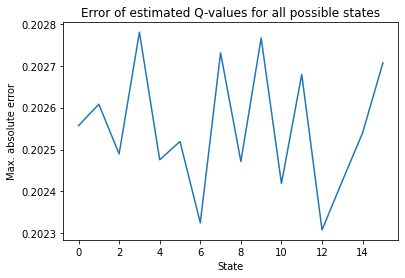


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


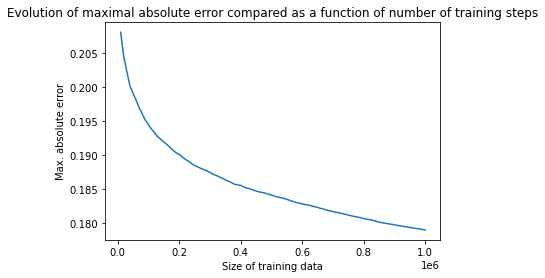

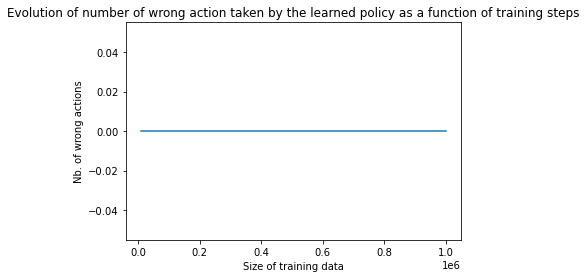


 Wrong actions : 
Optimal policy derived !!


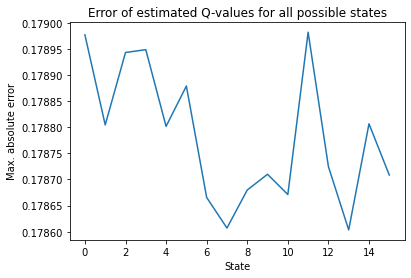


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


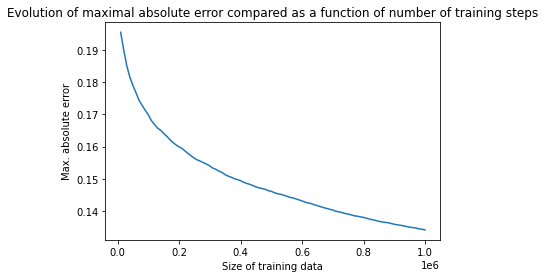

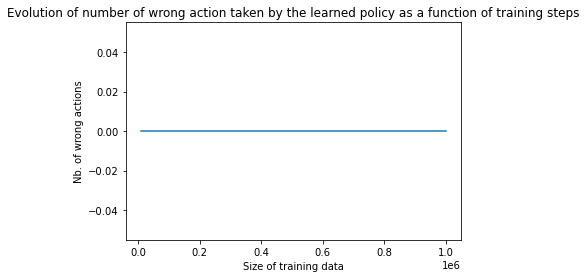


 Wrong actions : 
Optimal policy derived !!


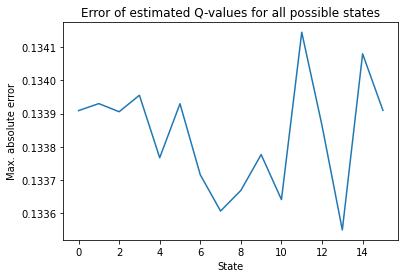


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


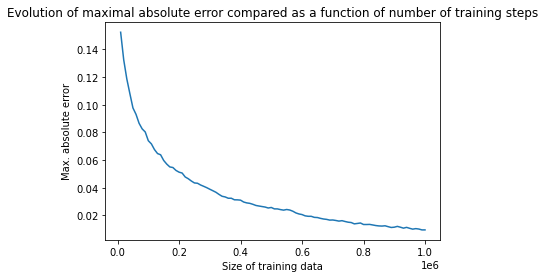

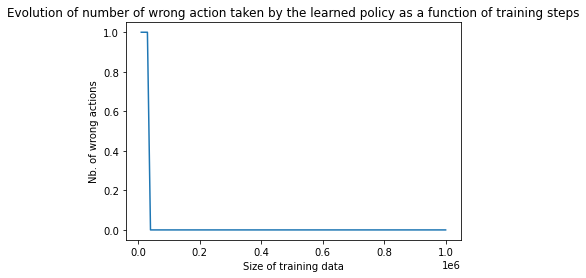


 Wrong actions : 
Optimal policy derived !!


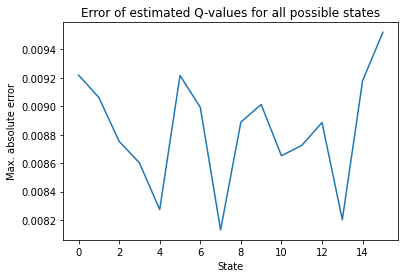


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


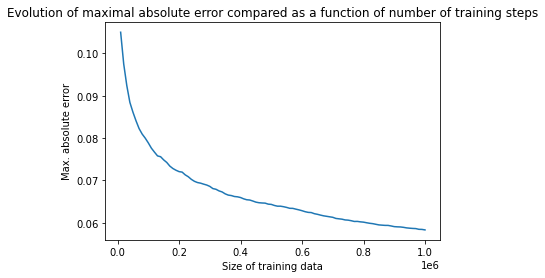

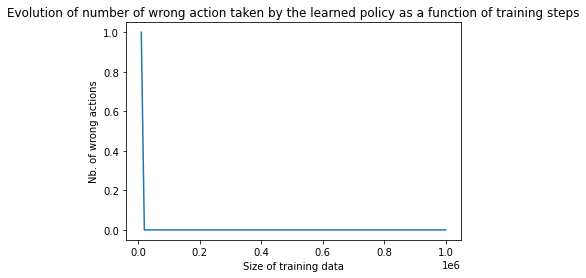


 Wrong actions : 
Optimal policy derived !!


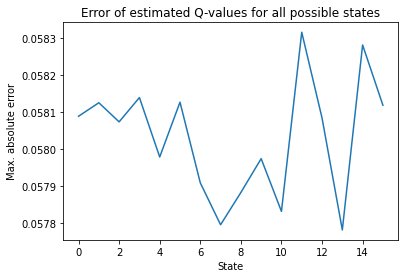


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


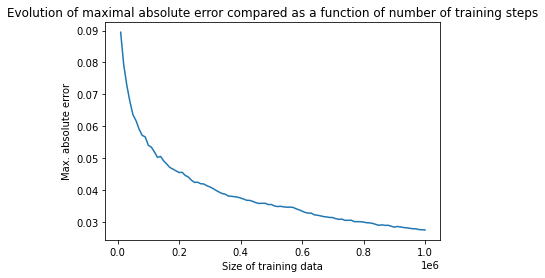

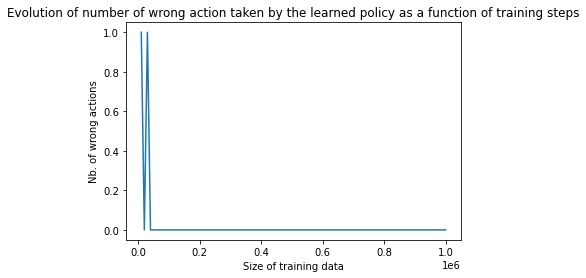


 Wrong actions : 
Optimal policy derived !!


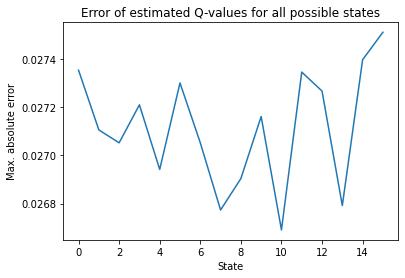


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


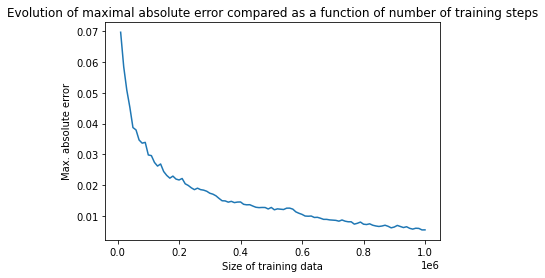

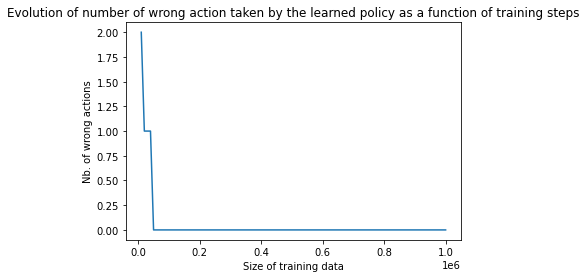


 Wrong actions : 
Optimal policy derived !!


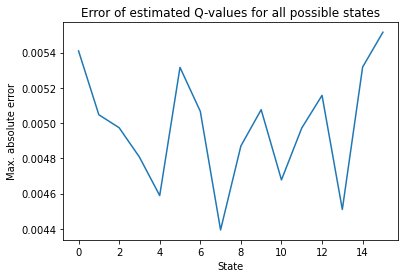


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


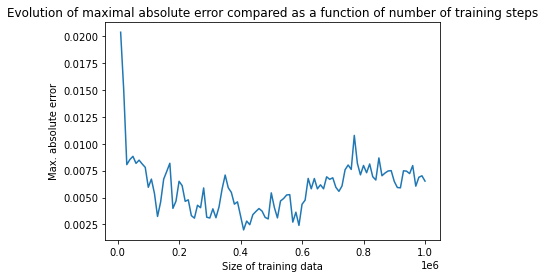

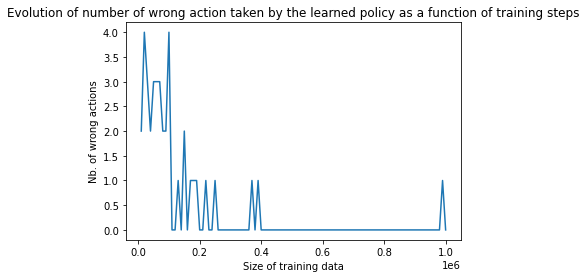


 Wrong actions : 
Optimal policy derived !!


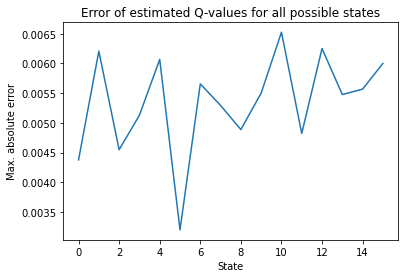


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


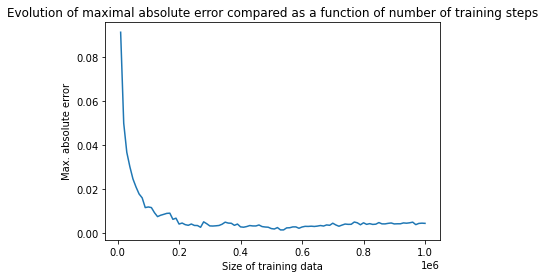

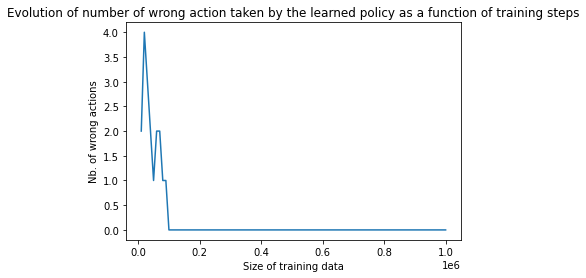


 Wrong actions : 
Optimal policy derived !!


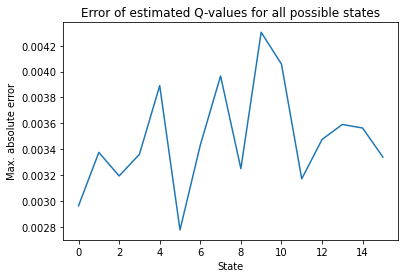


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


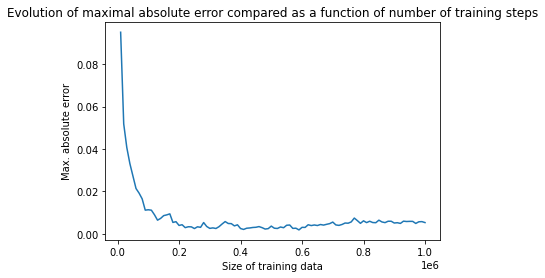

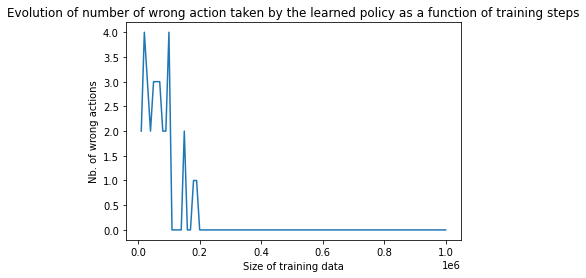


 Wrong actions : 
Optimal policy derived !!


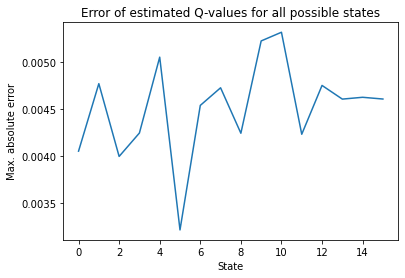


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


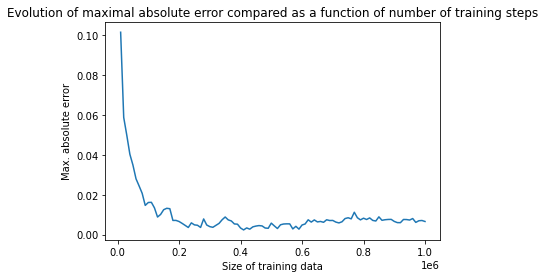

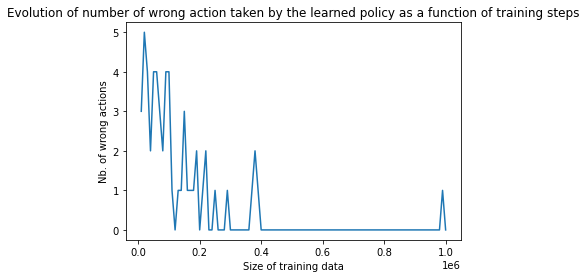


 Wrong actions : 
Optimal policy derived !!


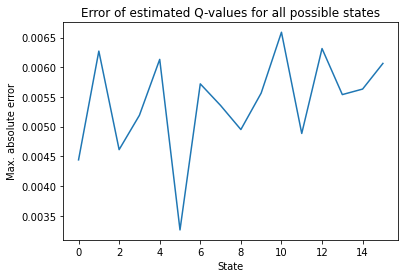


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


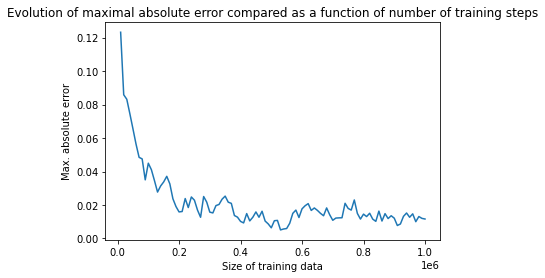

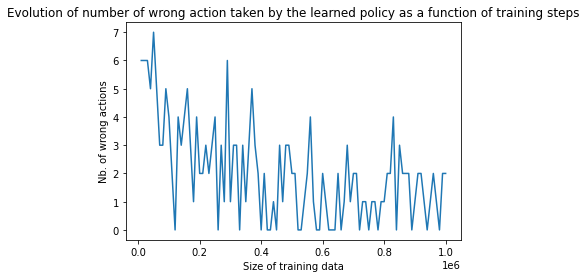


 Wrong actions : 
[0.98, 1.03, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


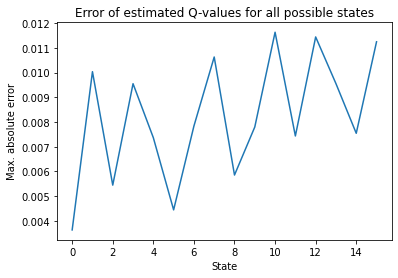

In [20]:
for x in res_u_w2:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin_u,true_qval_u))

As seen below it chooses always weight equal to one for the first which is the optimal policy. Error of estimated Q-values are not small but as we saw for window size equal to $1$, a smaller decay rate of $0.01$ induce better estimated Q-values.

Smaller decay rate leads to smaller maximal absolute error.

# Delayed by two days: 

$$r_{2,t}=r_{1,t+2}$$

The optimal policy can only be derived when $w\geq 2$ and corresponds to:

\begin{equation*}
    \pi^\star(a_t\vert s_t) = \begin{cases}
        \mathbf{1}_{\{a_t=1.0\}}, \qquad &\text{ if } r_{2,t-1} = u\\
        \mathbf{1}_{\{a_t=0.0\}}, \qquad &\text{ if } r_{2,t-1} = d\\
    \end{cases}
\end{equation*}

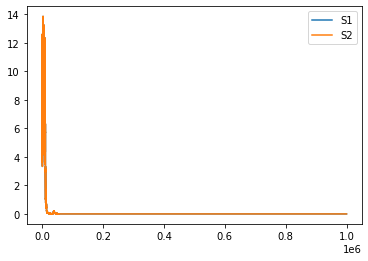

In [48]:
np.random.seed(91917)

simplebin_delay=SimpleBinomial(1.02,0.98,0.5,delay=2)
ret_delay=simplebin_delay.simulate(Nsample)

plt.plot(10*np.cumprod(ret_delay[0,:]))
plt.plot(10*np.cumprod(ret_delay[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [49]:
pd.DataFrame(ret_delay,index=['S1','S2'])

,0,1,2,3,4,5,6,7,8,9,...,999990,999991,999992,999993,999994,999995,999996,999997,999998,999999
S1,1.02,0.98,0.98,0.98,1.02,0.98,1.02,1.02,0.98,1.02,...,1.02,0.98,0.98,0.98,1.02,0.98,0.98,0.98,1.02,0.98
S2,0.98,0.98,1.02,0.98,1.02,1.02,0.98,1.02,1.02,1.02,...,0.98,0.98,1.02,0.98,0.98,0.98,1.02,0.98,0.98,1.02


Above we see that we have:
$$
r_{2,t}= r_{1,t+2}
$$

In [50]:
true_qval_delay=simplebin_delay.true_qval()

Time needed to converge with delta =  1e-05  :  343


In [51]:
for k in true_qval_delay.keys():
    print(k, " : ", np.argmax(true_qval_delay[k]))

[1.02, 1.02, 1.02, 1.02]  :  10
[1.02, 1.02, 1.02, 0.98]  :  10
[1.02, 1.02, 0.98, 1.02]  :  0
[1.02, 1.02, 0.98, 0.98]  :  0
[1.02, 0.98, 1.02, 1.02]  :  10
[1.02, 0.98, 1.02, 0.98]  :  10
[1.02, 0.98, 0.98, 1.02]  :  0
[1.02, 0.98, 0.98, 0.98]  :  0
[0.98, 1.02, 1.02, 1.02]  :  10
[0.98, 1.02, 1.02, 0.98]  :  10
[0.98, 1.02, 0.98, 1.02]  :  0
[0.98, 1.02, 0.98, 0.98]  :  0
[0.98, 0.98, 1.02, 1.02]  :  10
[0.98, 0.98, 1.02, 0.98]  :  10
[0.98, 0.98, 0.98, 1.02]  :  0
[0.98, 0.98, 0.98, 0.98]  :  0


In [52]:
Nsim=10000
test_ret_delay=simplebin_delay.simulate(Nsim)


It is really the optimal policy !

## Window $w=2$

In [53]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_delay,index=['S1','S2']) ,np.array(test_ret_delay),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_delay)])
            
    res_delay = pool.map(multi_train_QLearning, params)



 

Decay rate : 1, Beta : 0, Tau : 1


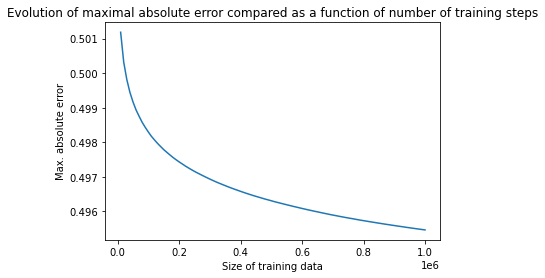

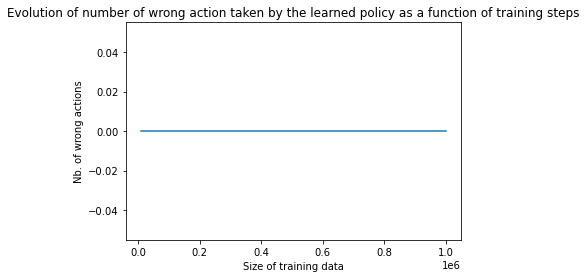


 Wrong actions : 
Optimal policy derived !!


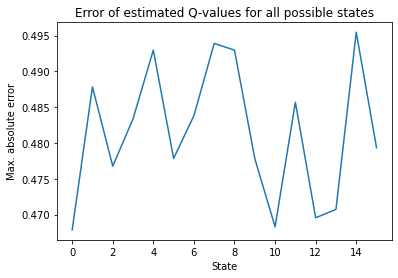


 

Decay rate : 1, Beta : 0, Tau : 0.9


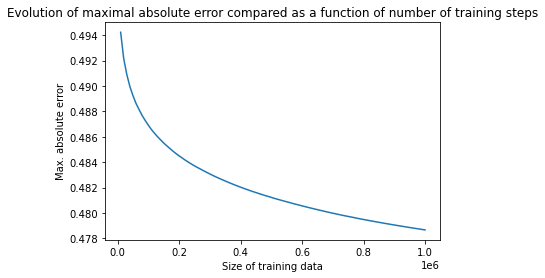

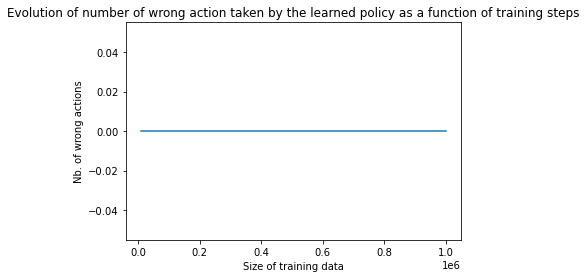


 Wrong actions : 
Optimal policy derived !!


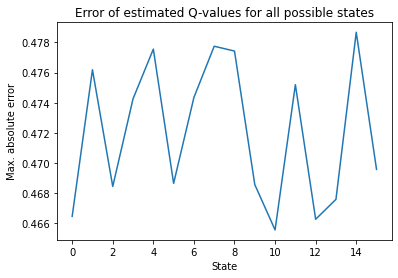


 

Decay rate : 1, Beta : 0, Tau : 0.8


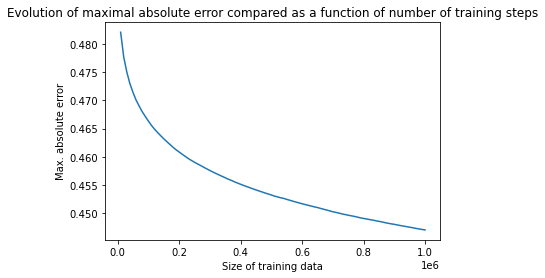

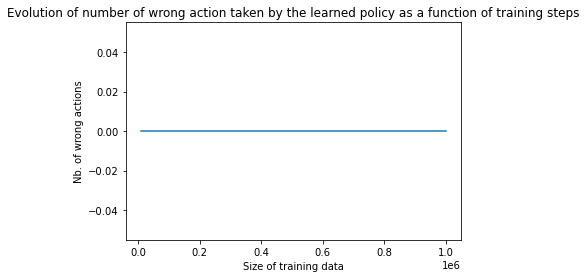


 Wrong actions : 
Optimal policy derived !!


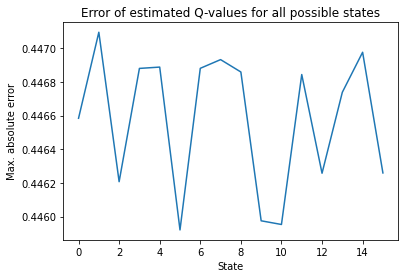


 

Decay rate : 1, Beta : 0, Tau : 0.6


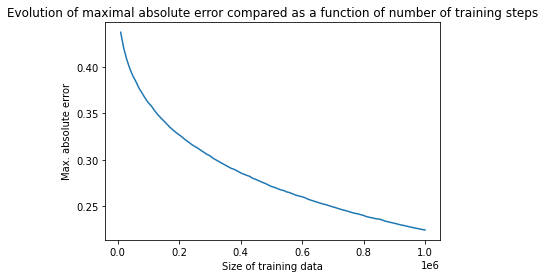

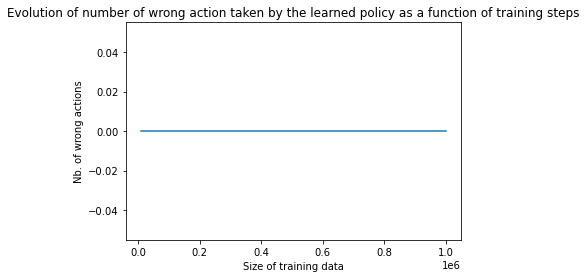


 Wrong actions : 
Optimal policy derived !!


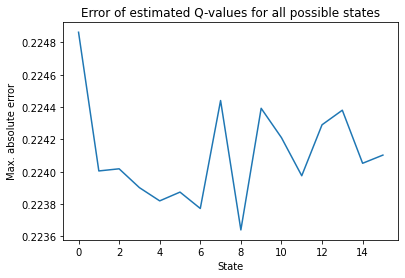


 

Decay rate : 0.1, Beta : 0, Tau : 1


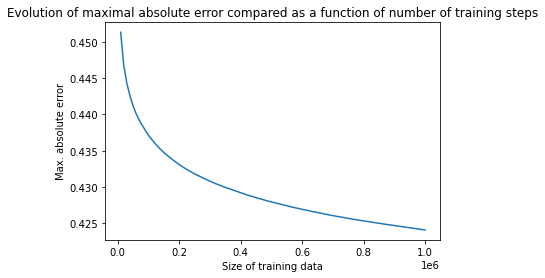

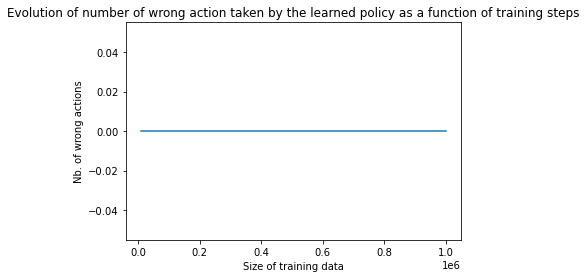


 Wrong actions : 
Optimal policy derived !!


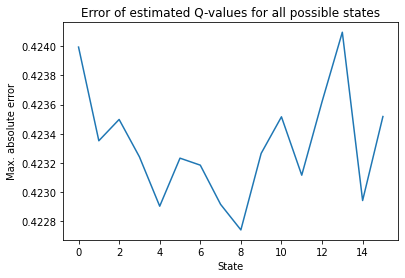


 

Decay rate : 0.1, Beta : 0, Tau : 0.9


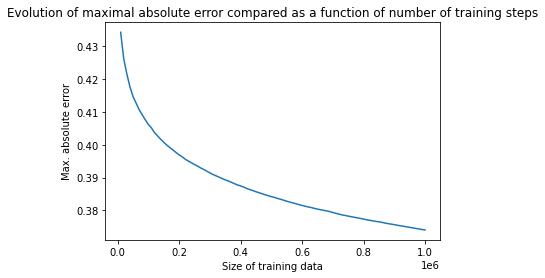

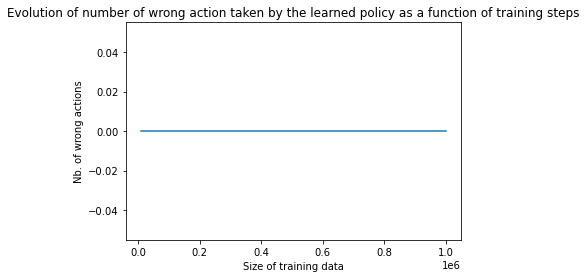


 Wrong actions : 
Optimal policy derived !!


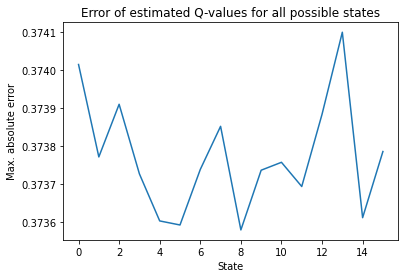


 

Decay rate : 0.1, Beta : 0, Tau : 0.8


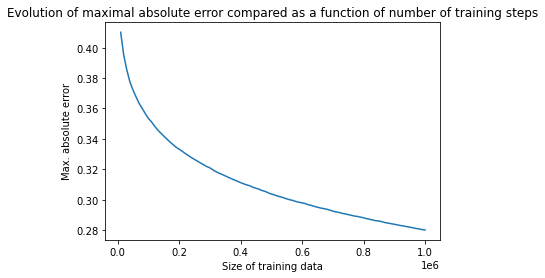

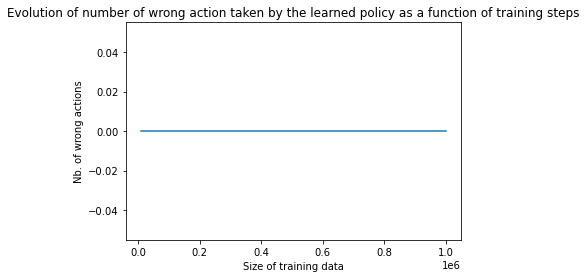


 Wrong actions : 
Optimal policy derived !!


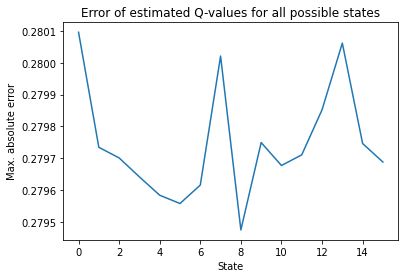


 

Decay rate : 0.1, Beta : 0, Tau : 0.6


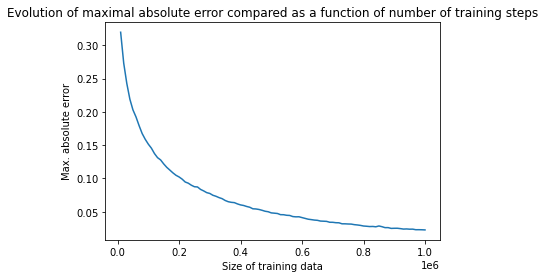

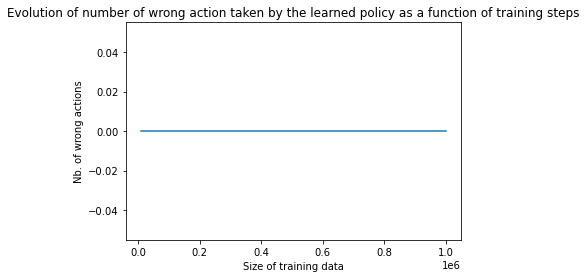


 Wrong actions : 
Optimal policy derived !!


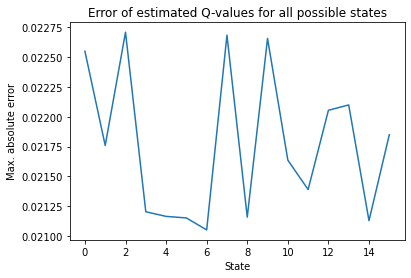


 

Decay rate : 0.01, Beta : 0, Tau : 1


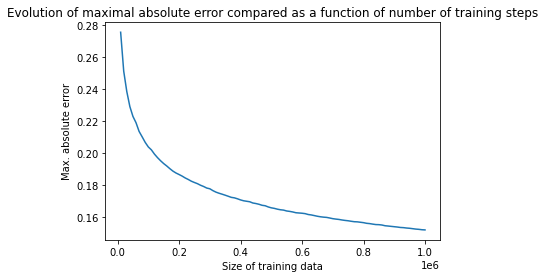

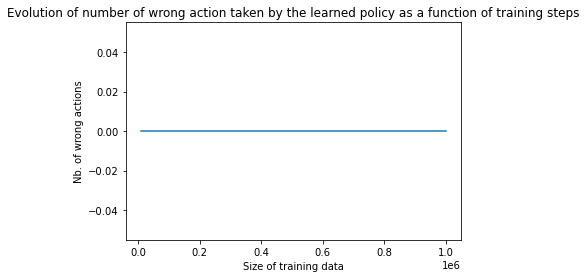


 Wrong actions : 
Optimal policy derived !!


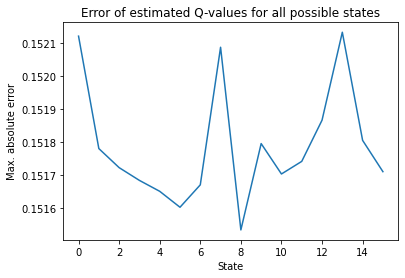


 

Decay rate : 0.01, Beta : 0, Tau : 0.9


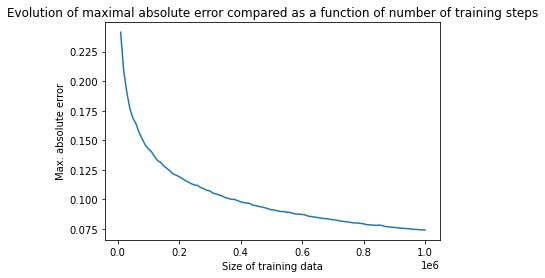

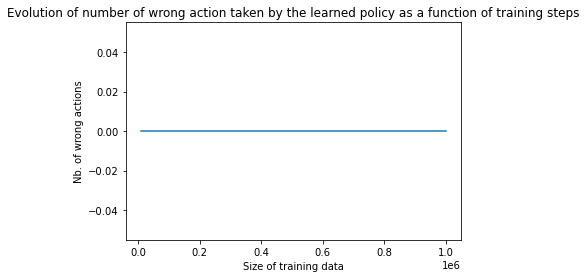


 Wrong actions : 
Optimal policy derived !!


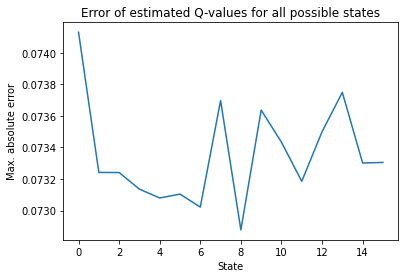


 

Decay rate : 0.01, Beta : 0, Tau : 0.8


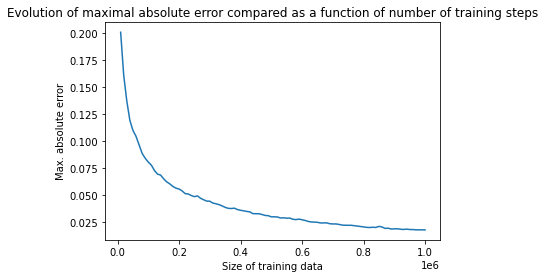

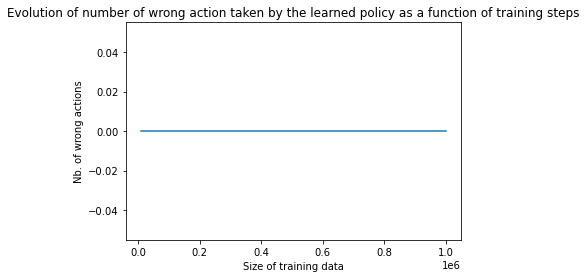


 Wrong actions : 
Optimal policy derived !!


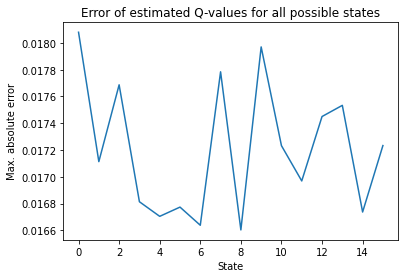


 

Decay rate : 0.01, Beta : 0, Tau : 0.6


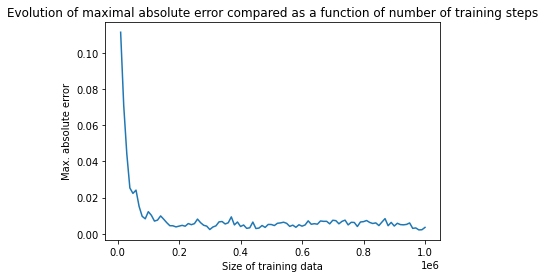

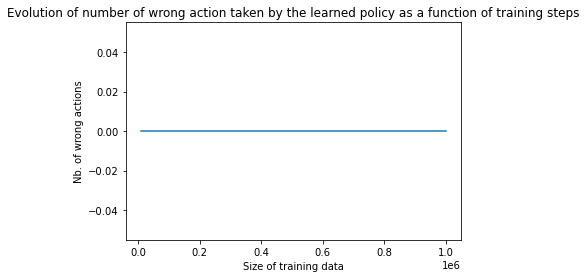


 Wrong actions : 
Optimal policy derived !!


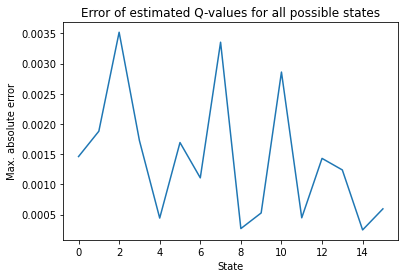


 

Decay rate : 0.001, Beta : 0, Tau : 1


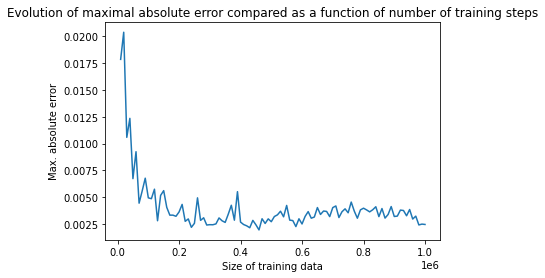

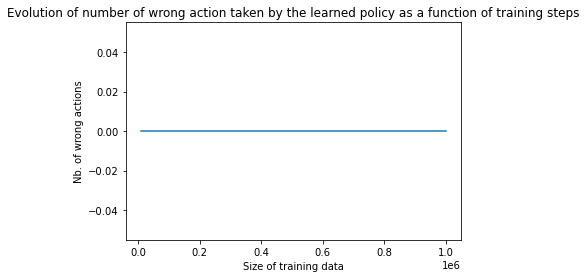


 Wrong actions : 
Optimal policy derived !!


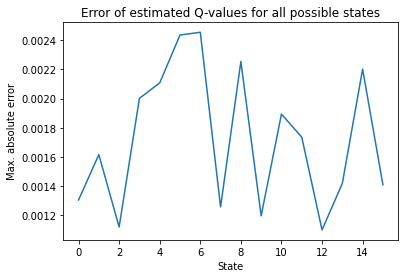


 

Decay rate : 0.001, Beta : 0, Tau : 0.9


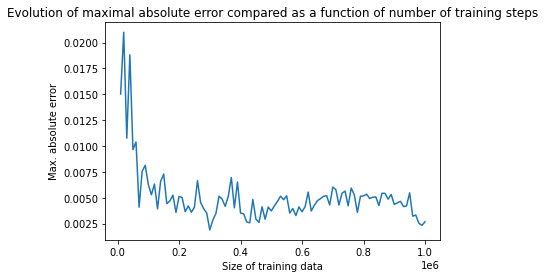

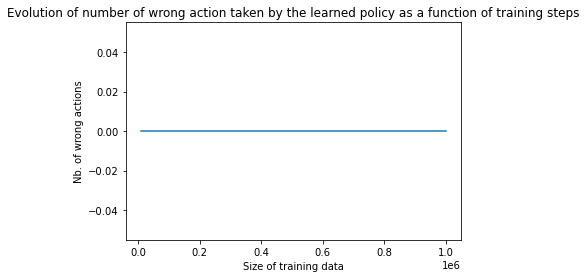


 Wrong actions : 
Optimal policy derived !!


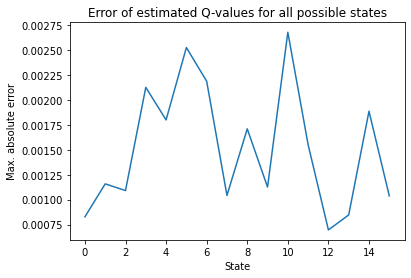


 

Decay rate : 0.001, Beta : 0, Tau : 0.8


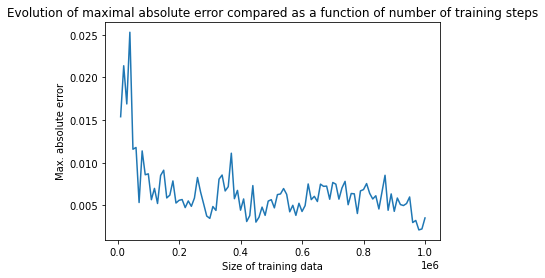

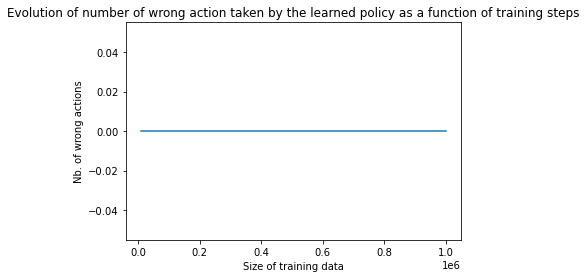


 Wrong actions : 
Optimal policy derived !!


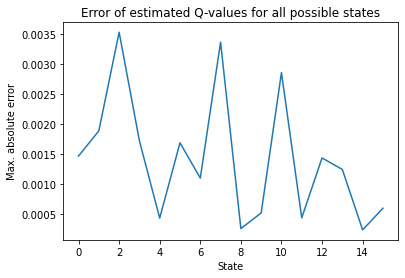


 

Decay rate : 0.001, Beta : 0, Tau : 0.6


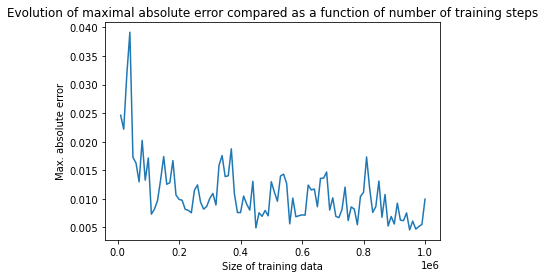

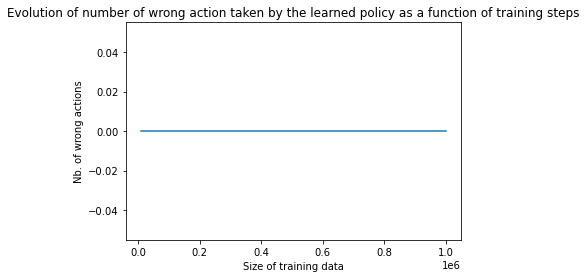


 Wrong actions : 
Optimal policy derived !!


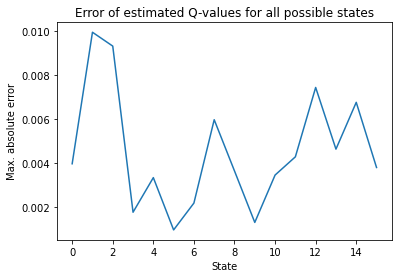

In [54]:
for x in res_delay:
    plot_res_multi_QLearning(x,true_qval_delay)

A smaller decay rate improved the errors of the estimated Q-values by a factor of fifty when setting $\lambda=0.001$ instead of $\lambda=1$, nevertheless they still remain high. Otherwise, the optimal policy is always immediately found.

However, we try with $\lambda=0.001$, in this case, it leads to very low errors (around $0.003$ for the best choice of parameters).

## Window $w = 3$

In [56]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        params.extend([create_param_QLearning(pd.DataFrame(ret_delay,index=['S1','S2']) ,np.array(test_ret_delay),  window=3, decay_rate=decay_rate,tau=1,true_qval = extend_qtablebin(simplebin_delay,true_qval_delay))])
            
    res_delay_w3 = pool.map(multi_train_QLearning, params)


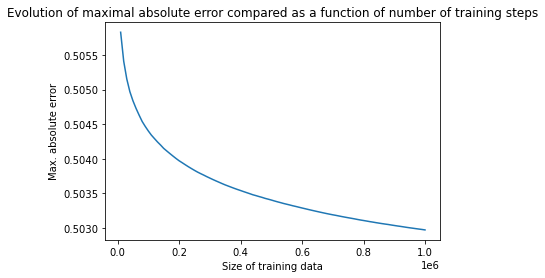

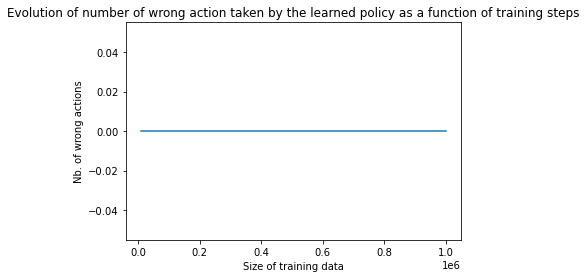


 Wrong actions : 
Optimal policy derived !!


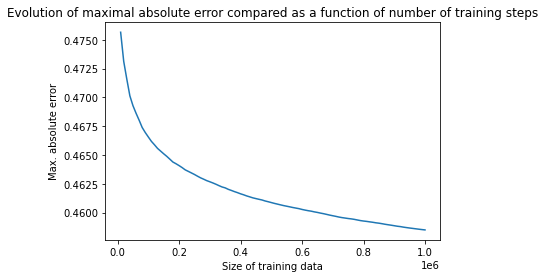

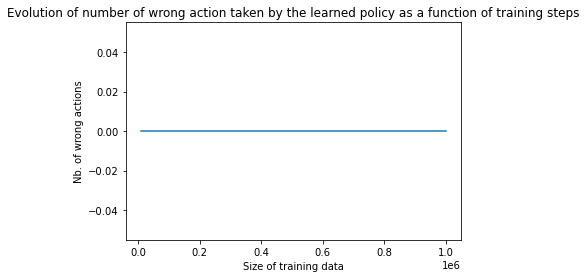


 Wrong actions : 
Optimal policy derived !!


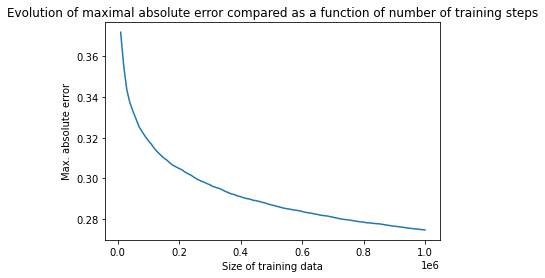

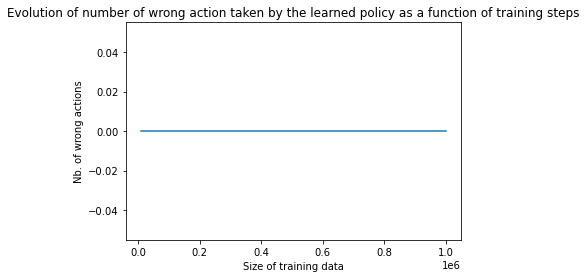


 Wrong actions : 
Optimal policy derived !!


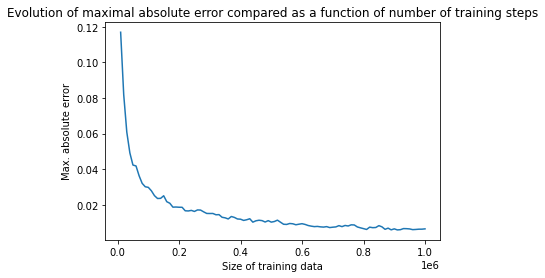

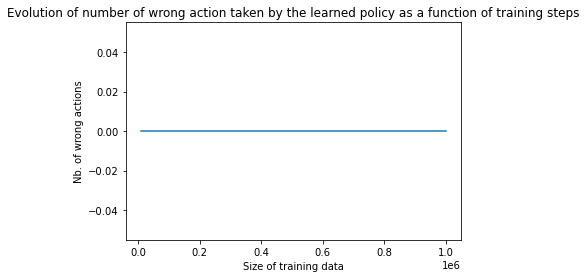


 Wrong actions : 
Optimal policy derived !!


In [89]:
for result in res_delay_w3:
    plt.plot(10000 * np.arange(1, len(result['max_error']) + 1), np.array(result['max_error']))
    plt.title('Evolution of maximal absolute error compared as a function of number of training steps')
    plt.xlabel('Size of training data')
    plt.ylabel('Max. absolute error')
    plt.show()

    plt.plot(10000 * np.arange(1, len(result['max_error']) + 1), np.array(result['nb_wrong']))
    plt.title('Evolution of number of wrong action taken by the learned policy as a function of training steps')
    plt.xlabel('Size of training data')
    plt.ylabel('Nb. of wrong actions')
    plt.show()

    nb_wrong_action=0
    print('\n', 'Wrong actions : ')
    for k in result['q_val'].keys():
        if np.argmax(extend_qtablebin(simplebin_delay,true_qval_delay)[k]) != np.argmax(result['q_val'][k]):
            nb_wrong_action += 1

    if nb_wrong_action == 0:
        print('Optimal policy derived !!')

    elif nb_wrong_action <= 10:
        for k in result['q_val'].keys():
            if np.argmax(extend_qtablebin(simplebin_delay,true_qval_delay)[k]) != np.argmax(result['q_val'][k]):
                print(k, '; Action from discrete policy : ', np.argmax(extend_qtablebin(simplebin_delay,true_qval_delay)[k]), '; Action from Q-Learning algorithm : ',
                      np.argmax(result['q_val'][k]))

#### Setting window size $w=3$ also leads to the optimal policy 

# Correlated by 0.1 + delayed by one time step

The optimal policy corresponds exactly to the case when : $r_{1,t+1}=r_{2,t}$.

This is the case as long as the correlation verifies $\rho > 0$.

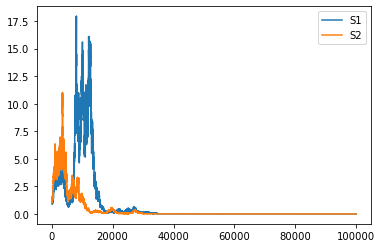

In [21]:
np.random.seed(92103)
rho=0.1
simplebin_corrdel6=SimpleBinomial(1.02,0.98,0.5,corr=rho,delay=1)
Nsample=100000
ret_corrdel6=simplebin_corrdel6.simulate(Nsample+1)
plt.plot(np.cumprod(ret_corrdel6[0,:]))
plt.plot(np.cumprod(ret_corrdel6[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [22]:
true_qval_corrdel6=simplebin_corrdel6.true_qval(1e-8)

Time needed to converge with delta =  1e-08  :  19


In [23]:
for k in true_qval_corrdel6.keys():
    print(k, ' : Action ', np.argmax(true_qval_corrdel6[k]))

[1.02, 1.02]  : Action  10
[1.02, 0.98]  : Action  0
[0.98, 1.02]  : Action  10
[0.98, 0.98]  : Action  0


In [24]:
Nsim=10000
test_ret_corrdel6=simplebin_corrdel6.simulate(Nsim)

In [25]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel6,index=['S1','S2']) ,np.array(test_ret_corrdel6),  window=1, decay_rate=decay_rate,tau=tau,true_qval = true_qval_corrdel6)])
            
    res_corrdel6 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


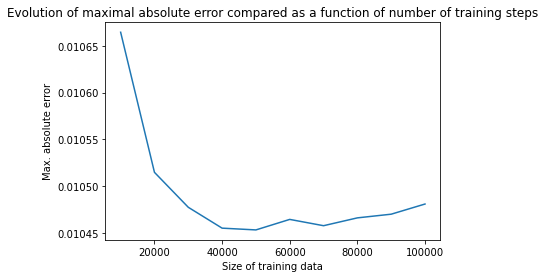

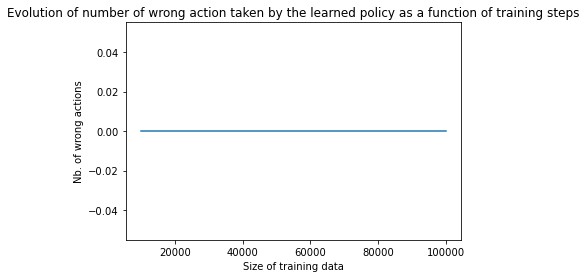


 Wrong actions : 
Optimal policy derived !!


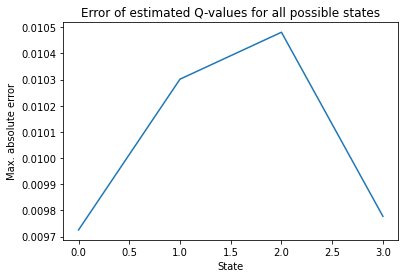


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


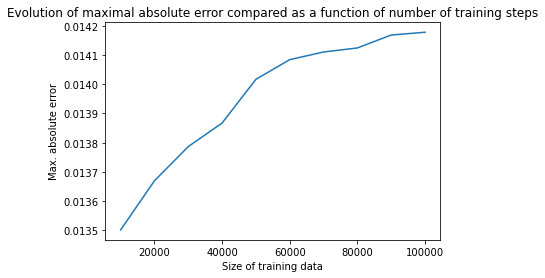

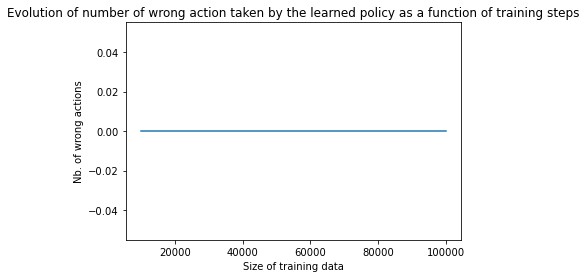


 Wrong actions : 
Optimal policy derived !!


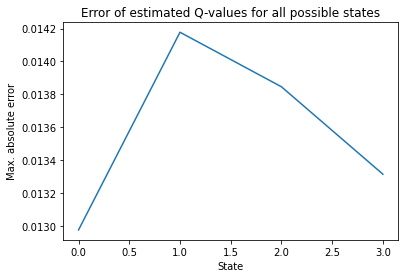


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


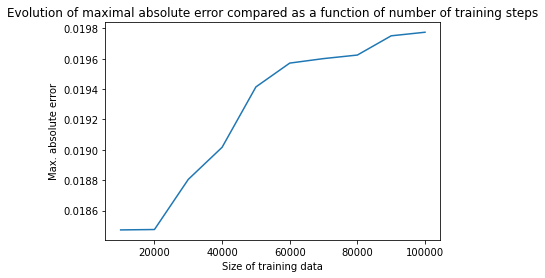

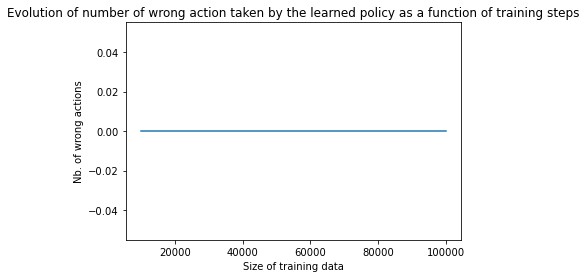


 Wrong actions : 
Optimal policy derived !!


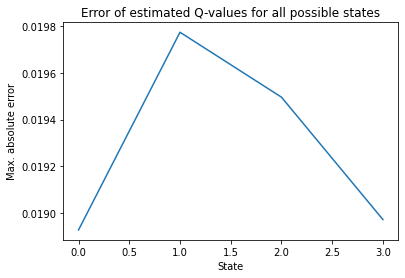


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


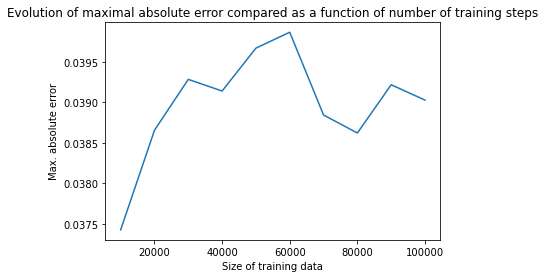

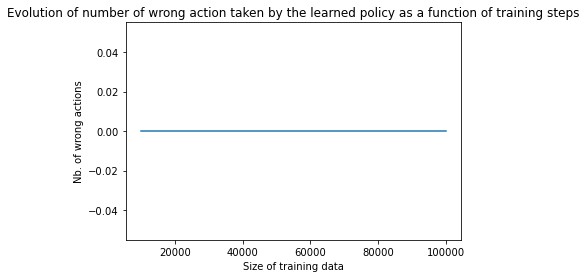


 Wrong actions : 
Optimal policy derived !!


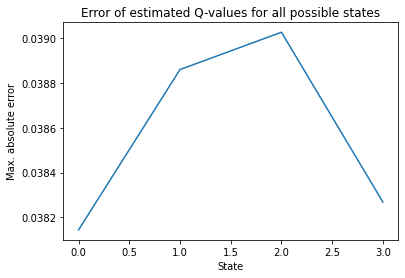


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


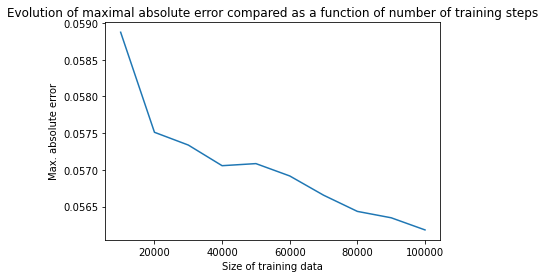

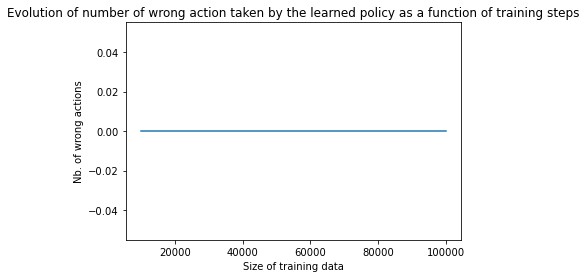


 Wrong actions : 
Optimal policy derived !!


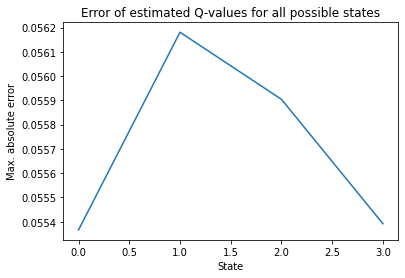


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


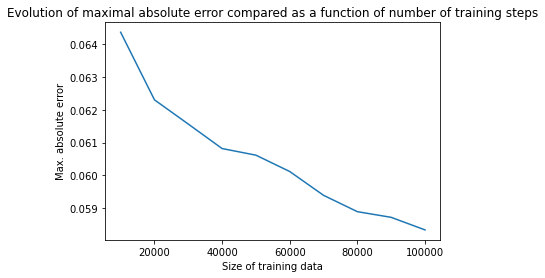

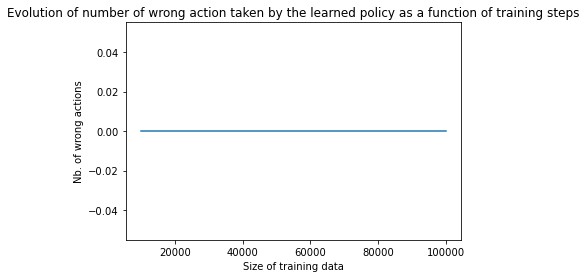


 Wrong actions : 
Optimal policy derived !!


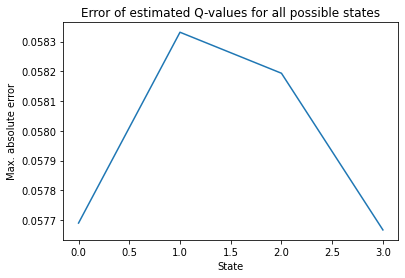


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


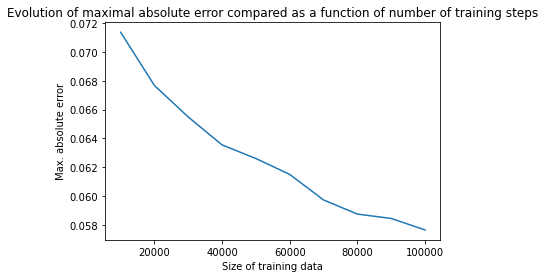

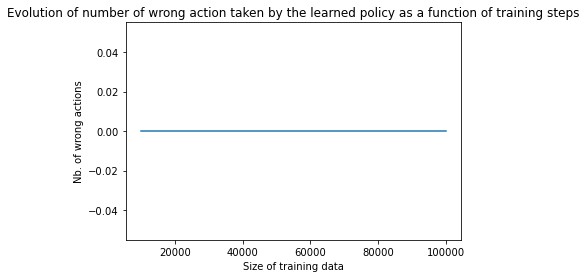


 Wrong actions : 
Optimal policy derived !!


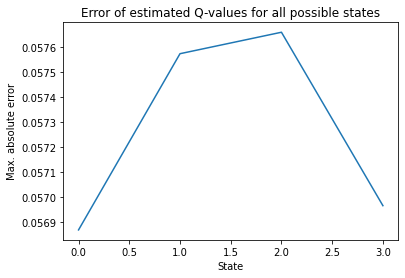


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


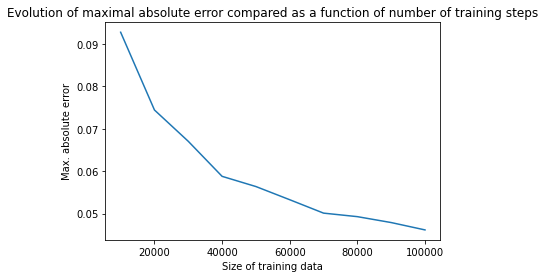

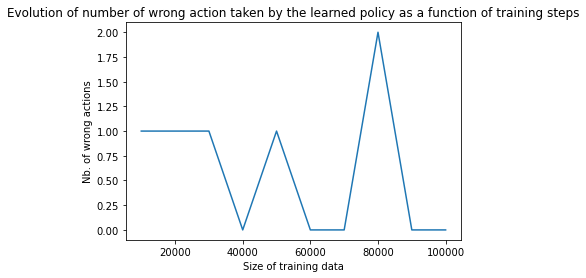


 Wrong actions : 
Optimal policy derived !!


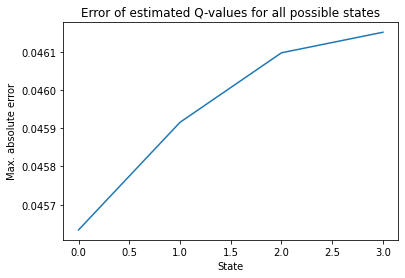


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


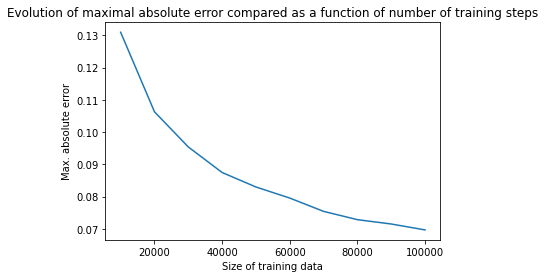

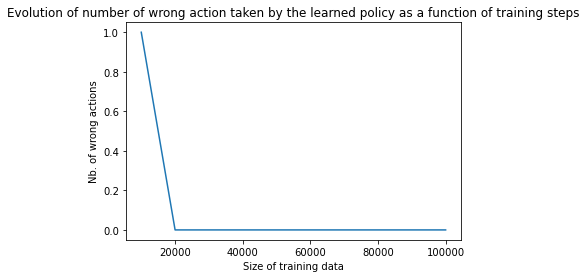


 Wrong actions : 
Optimal policy derived !!


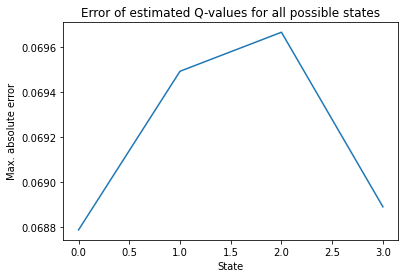


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


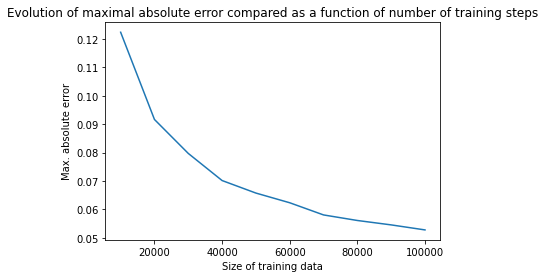

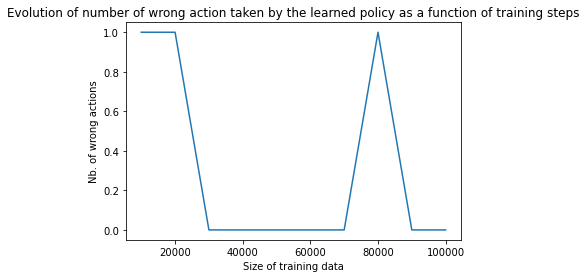


 Wrong actions : 
Optimal policy derived !!


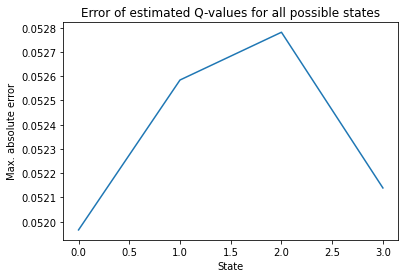


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


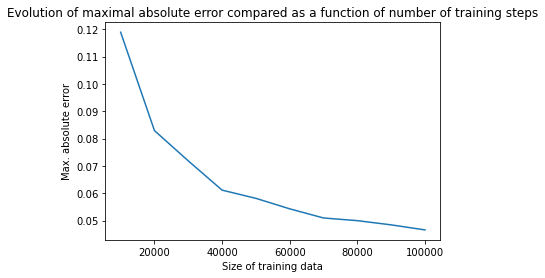

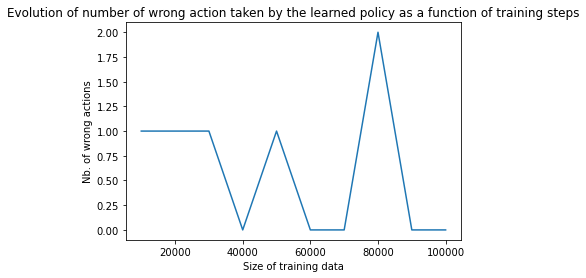


 Wrong actions : 
Optimal policy derived !!


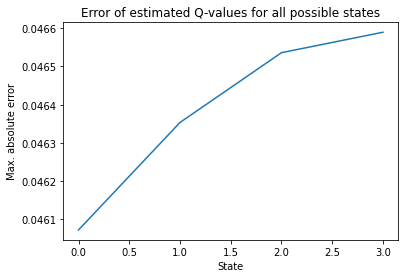


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


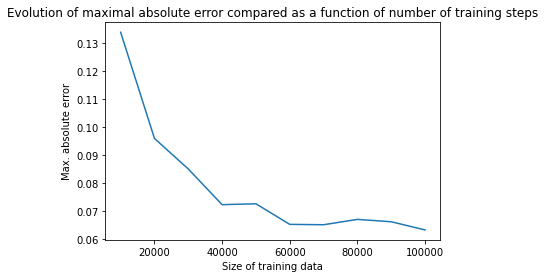

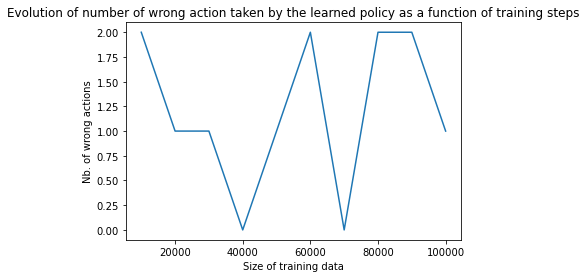


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1


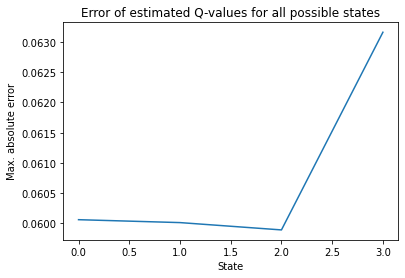


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


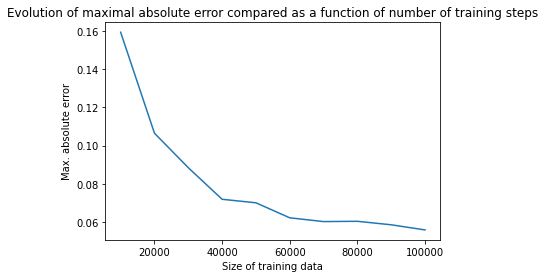

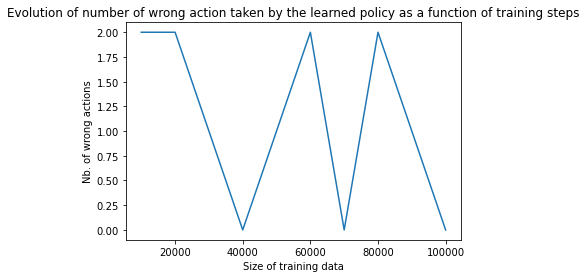


 Wrong actions : 
Optimal policy derived !!


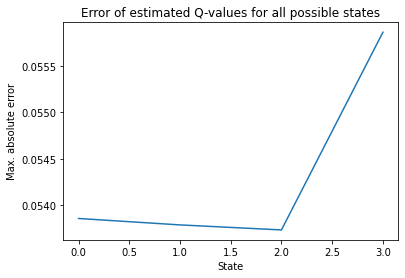


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


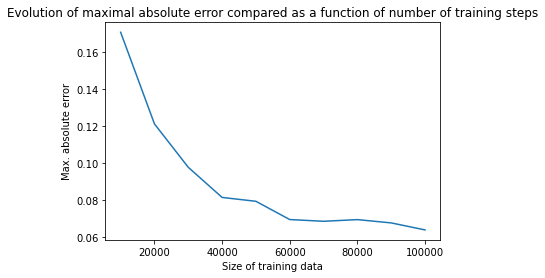

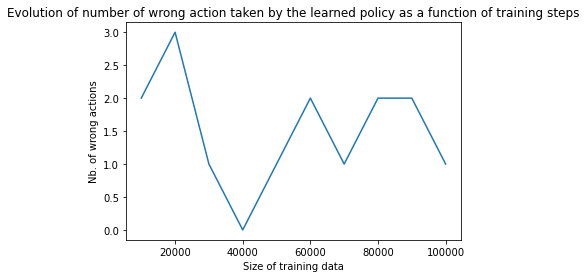


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1


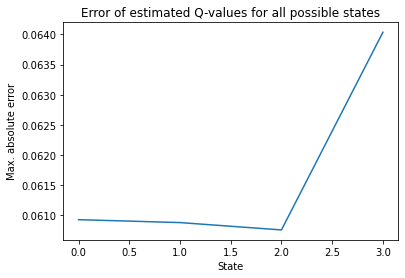


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


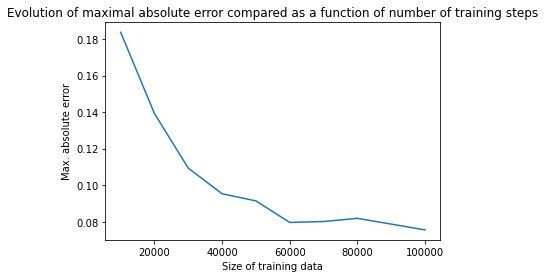

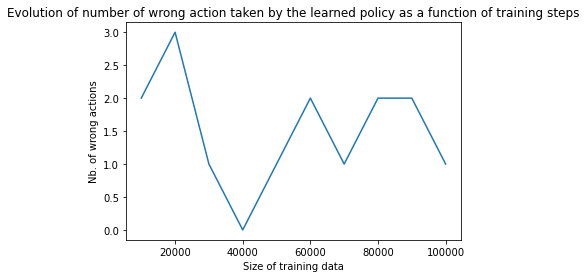


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


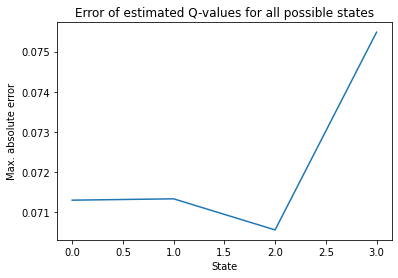


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


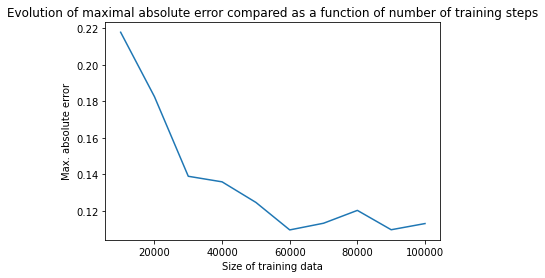

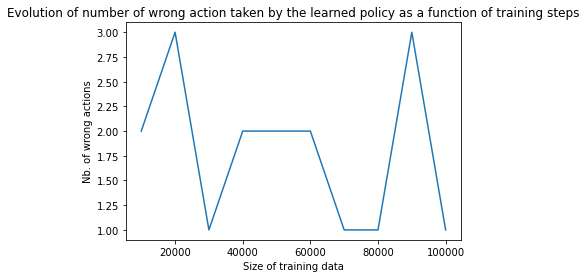


 Wrong actions : 
[1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


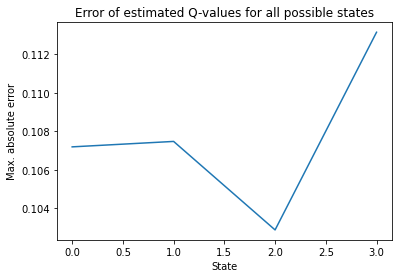

In [26]:
for x in res_corrdel6:
    plot_res_multi_QLearning(x,true_qval_corrdel6)

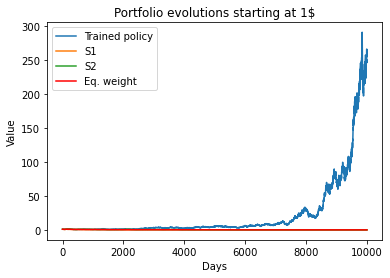

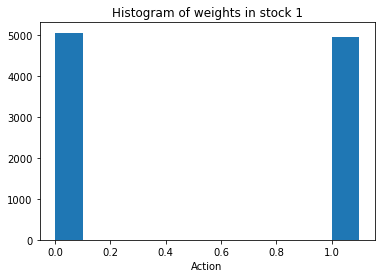

In [27]:
plot_result(res_corrdel6[0]['exploit_test'])

## All policies are optimal and approximately same error for all learning rates.

### Window = 2

In [28]:
PROCESSES = 4
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel6,index=['S1','S2']) ,np.array(test_ret_corrdel6),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin_corrdel6,true_qval_corrdel6))])
            
    res_corrdel6_w2 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


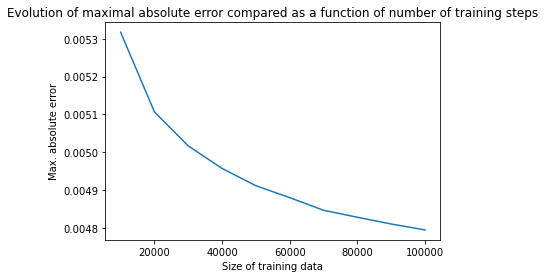

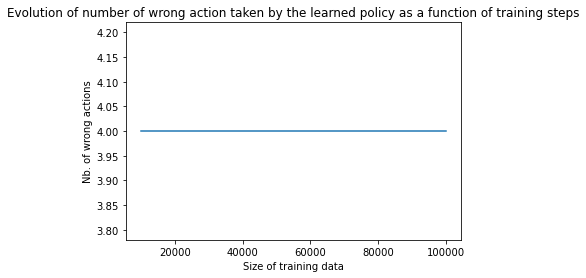


 Wrong actions : 
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


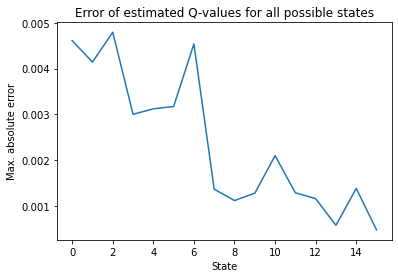


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


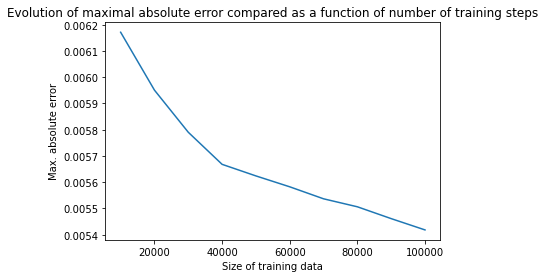

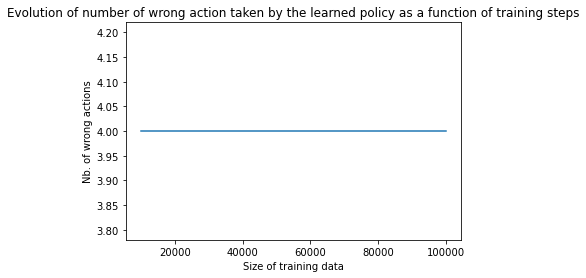


 Wrong actions : 
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  5


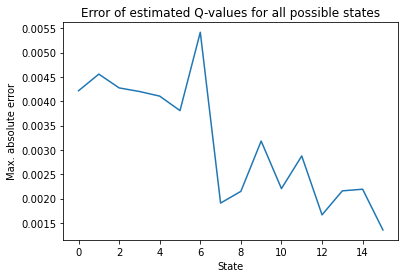


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


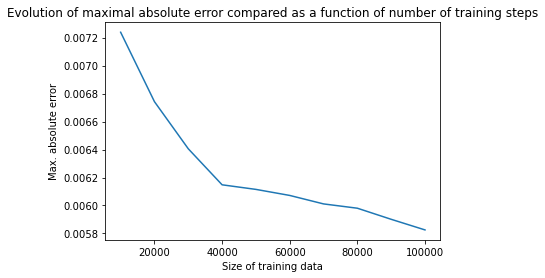

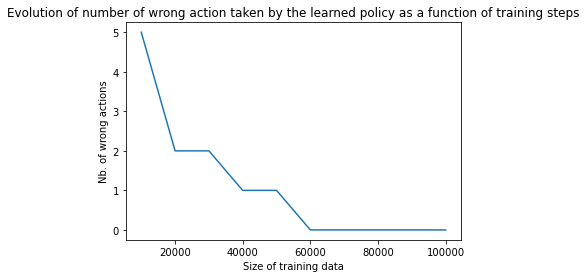


 Wrong actions : 
Optimal policy derived !!


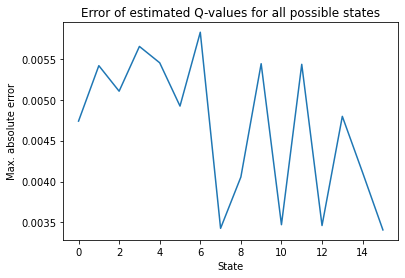


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


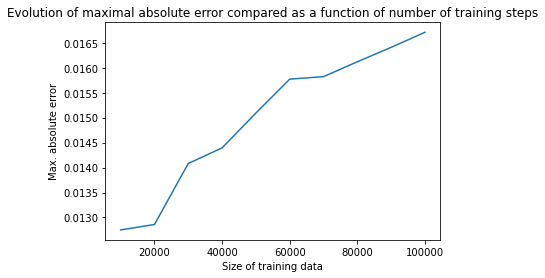

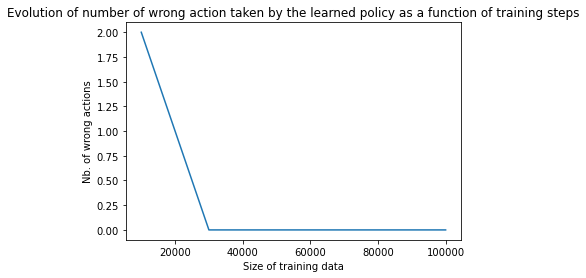


 Wrong actions : 
Optimal policy derived !!


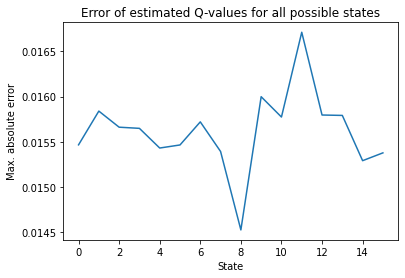


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


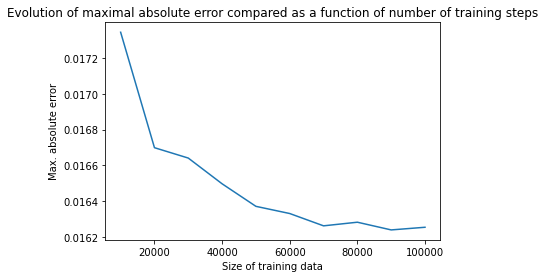

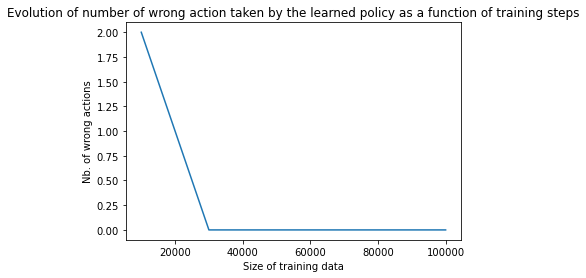


 Wrong actions : 
Optimal policy derived !!


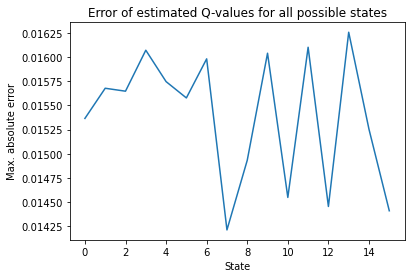


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


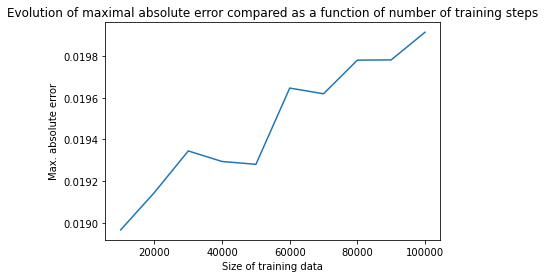

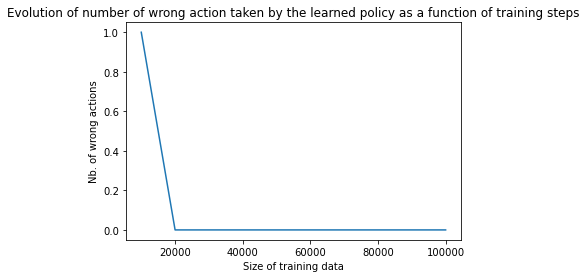


 Wrong actions : 
Optimal policy derived !!


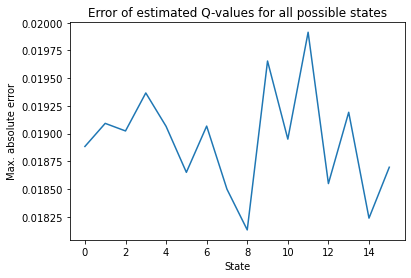


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


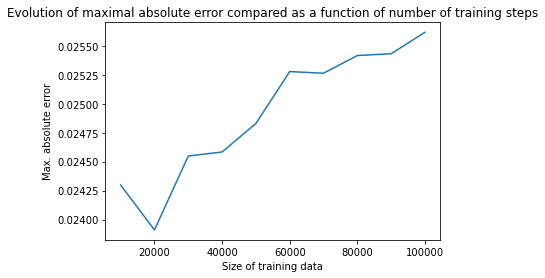

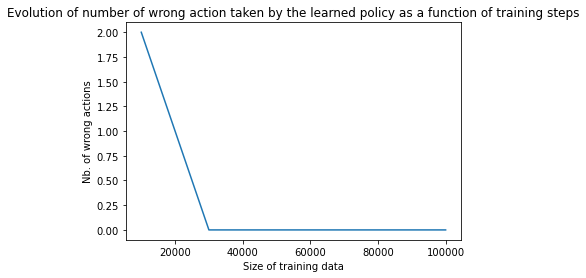


 Wrong actions : 
Optimal policy derived !!


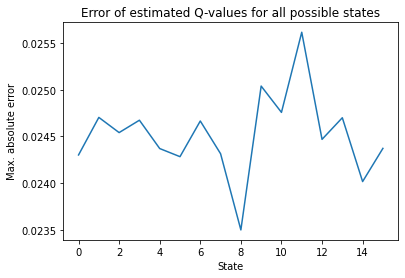


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


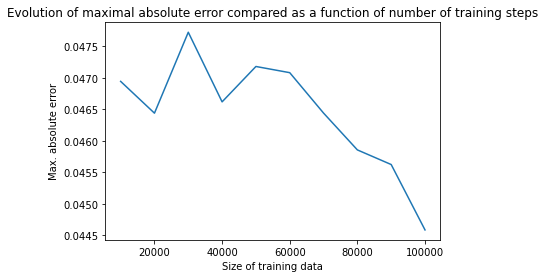

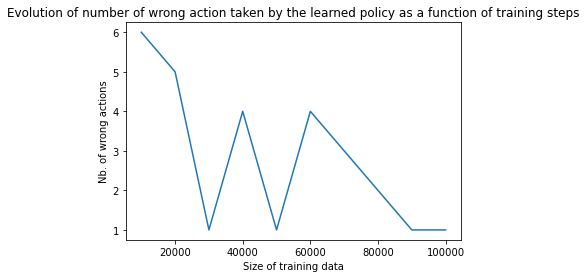


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2


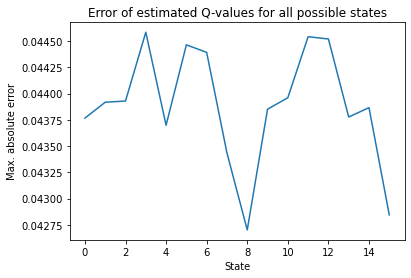


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


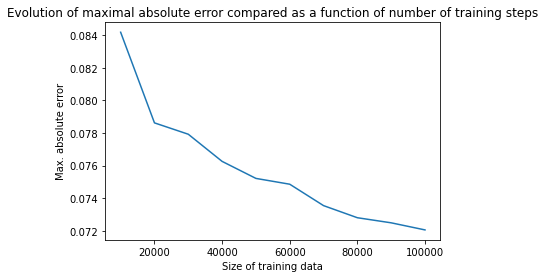

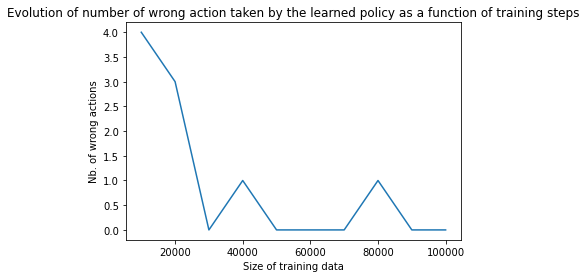


 Wrong actions : 
Optimal policy derived !!


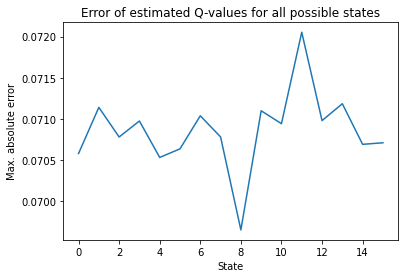


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


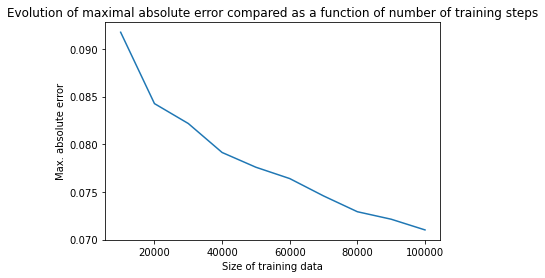

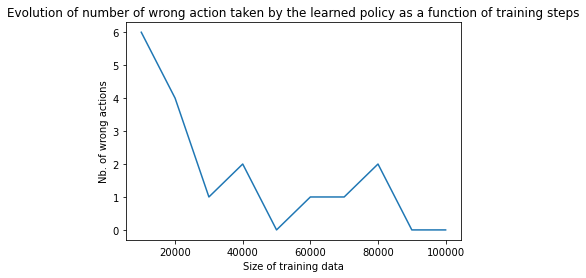


 Wrong actions : 
Optimal policy derived !!


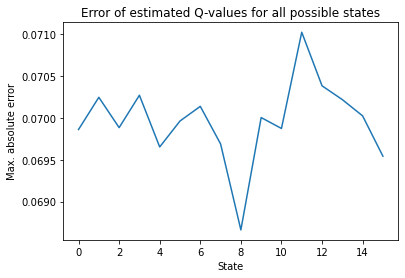


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


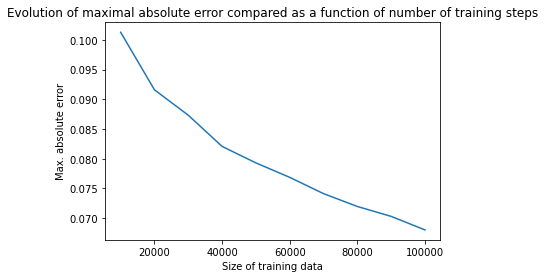

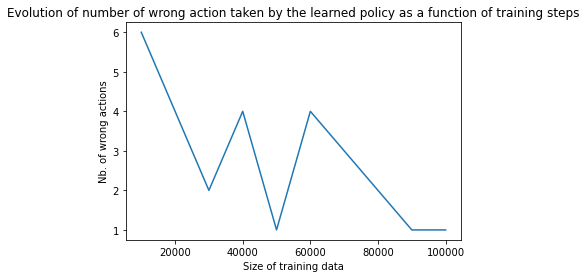


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2


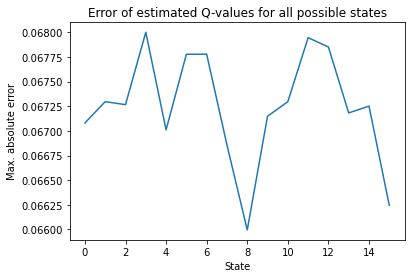


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


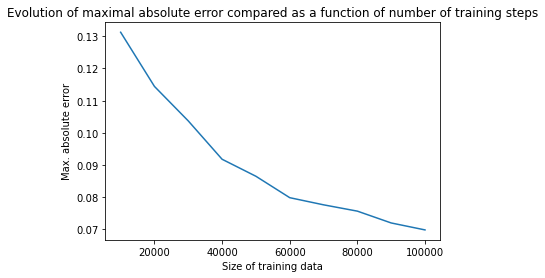

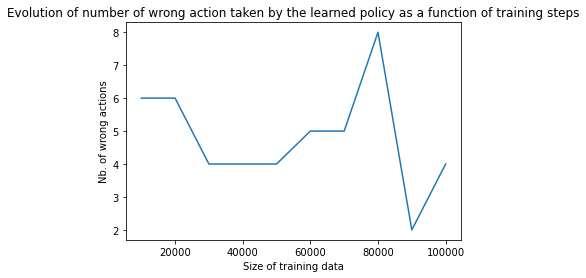


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


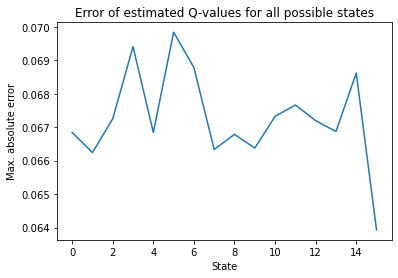


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


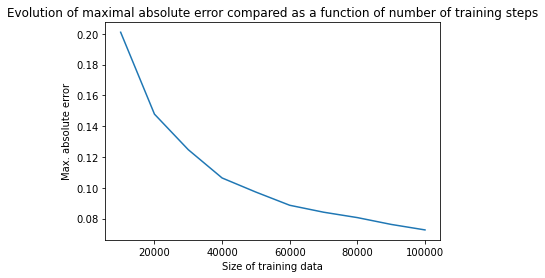

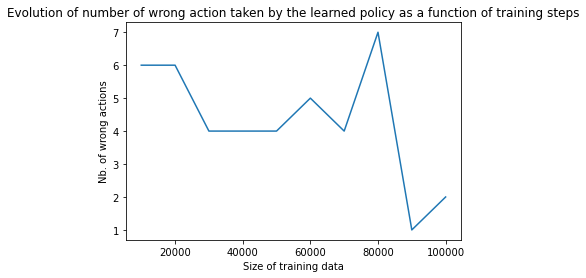


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  3


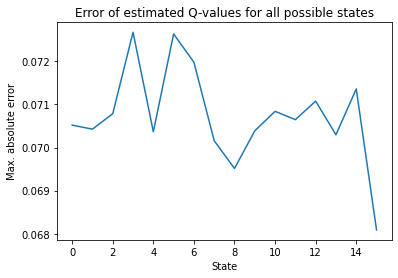


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


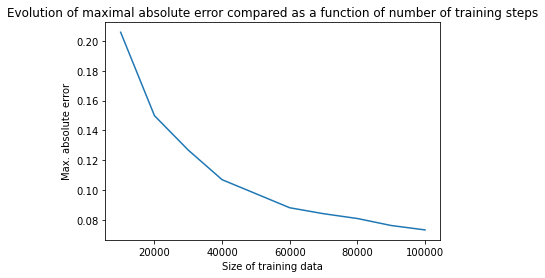

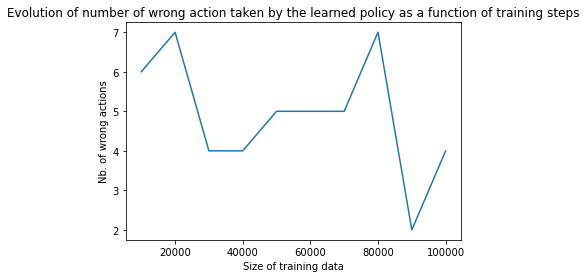


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


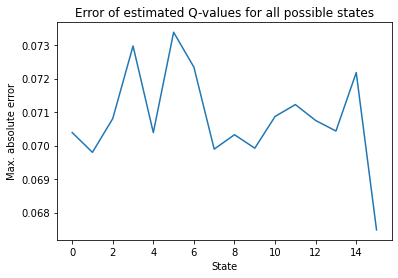


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


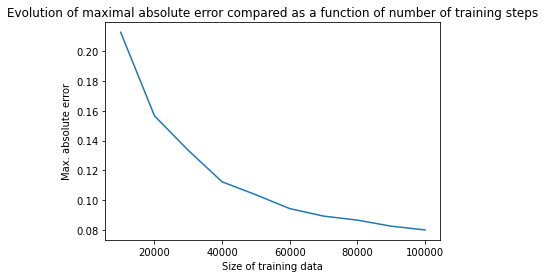

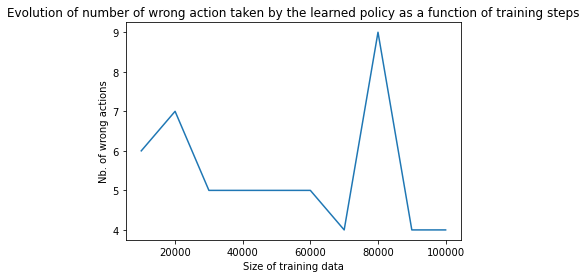


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


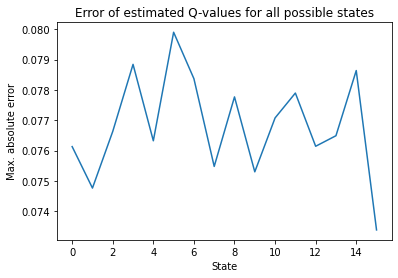


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


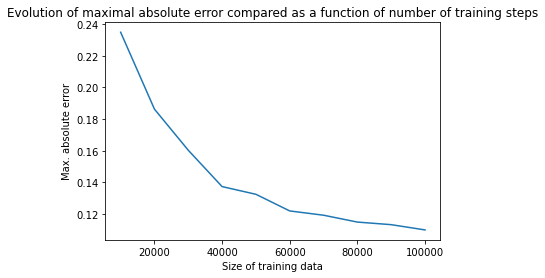

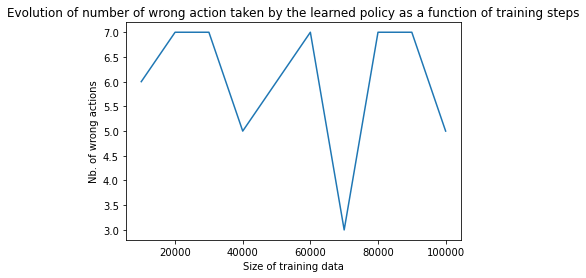


 Wrong actions : 
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  3
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


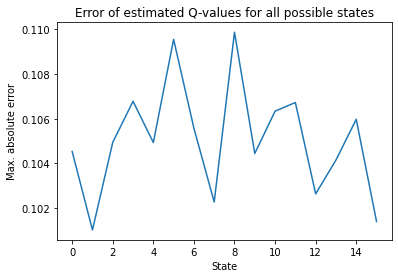

In [29]:
for x in res_corrdel6_w2:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin_corrdel6,true_qval_corrdel6))

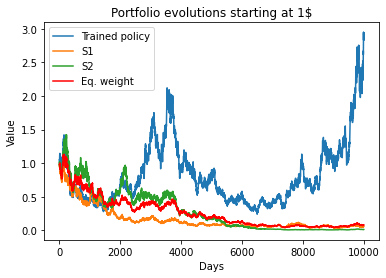

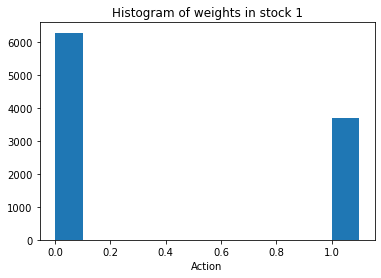

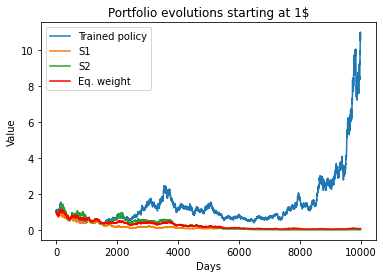

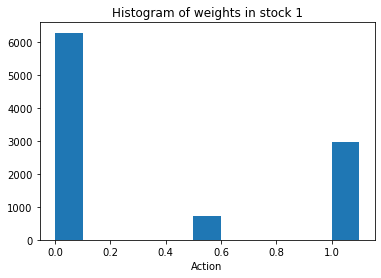

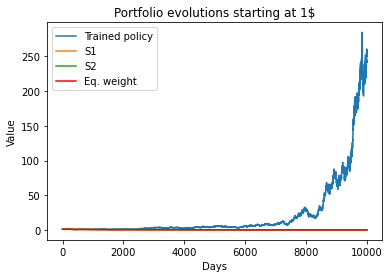

...

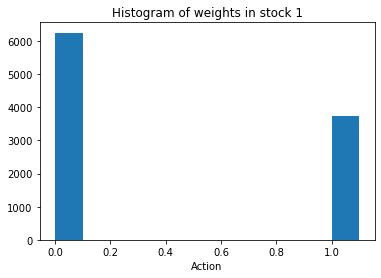

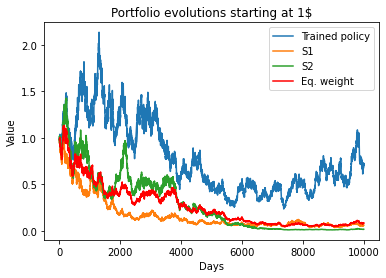

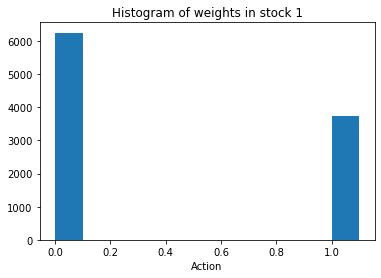

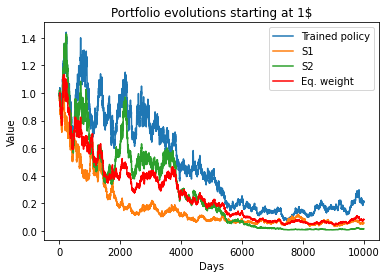

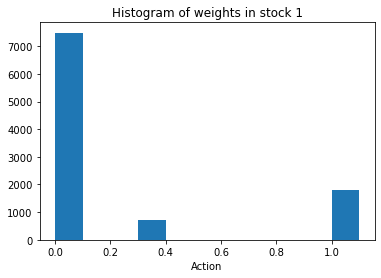

In [48]:
for x in res_corrdel6_w2:
    plot_result(x['exploit_test'])

In [30]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1,0.1,0.01]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel6,index=['S1','S2']) ,np.array(test_ret_corrdel6),  window=2, decay_rate=decay_rate,tau=tau,true_qval = extend_qtablebin(simplebin_corrdel6,true_qval_corrdel6),adaptive_lr=True)])
            
    res_corrdel6_w2_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 1


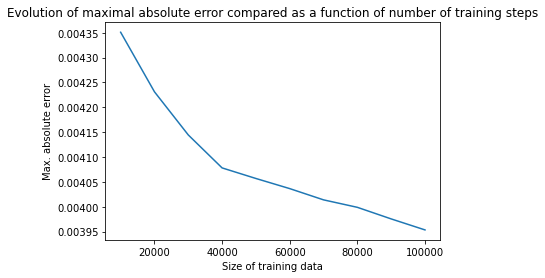

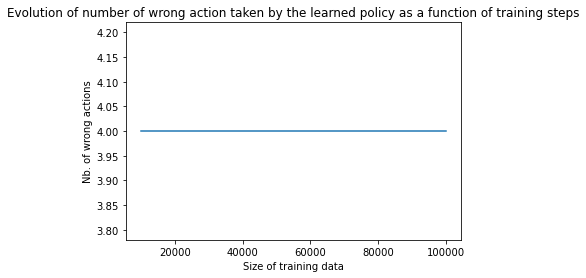


 Wrong actions : 
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


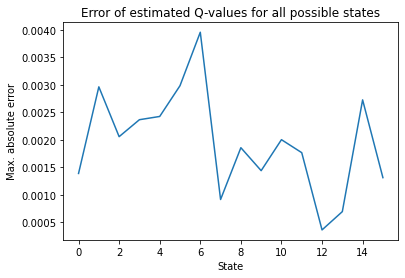


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.9


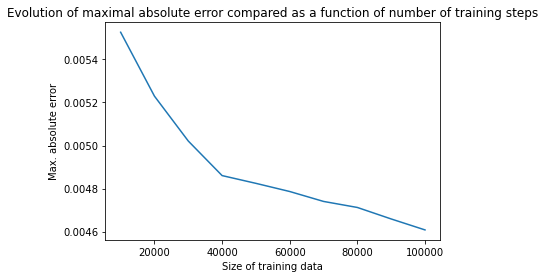

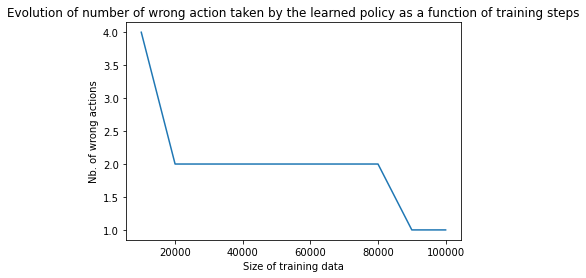


 Wrong actions : 
[1.02, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


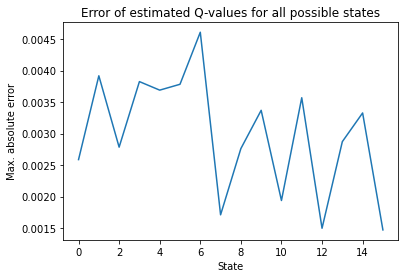


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.8


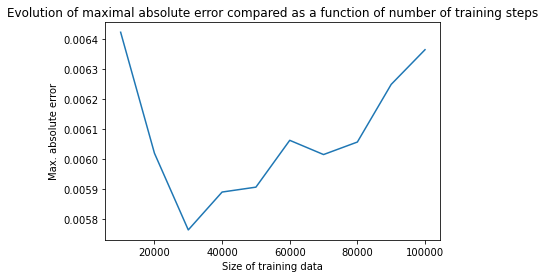

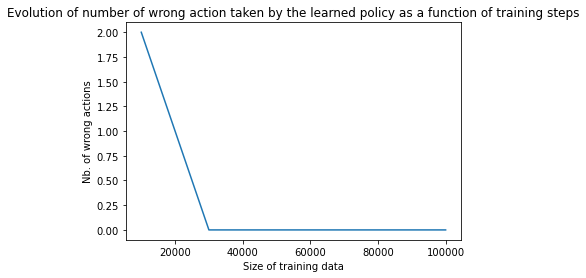


 Wrong actions : 
Optimal policy derived !!


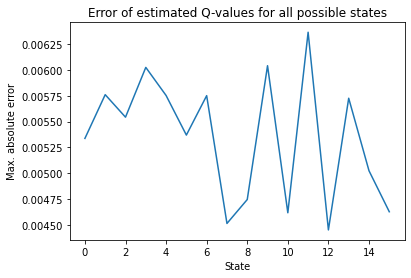


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.6


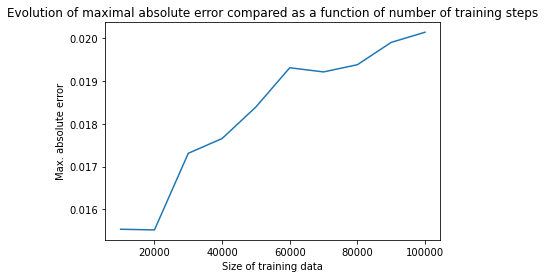

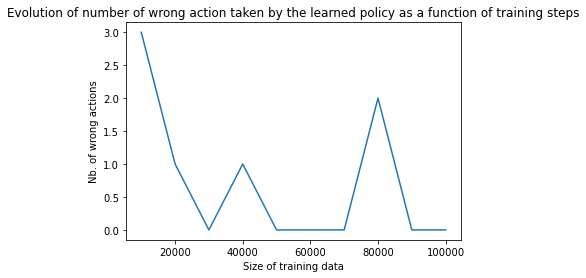


 Wrong actions : 
Optimal policy derived !!


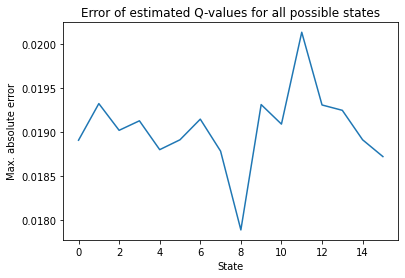


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


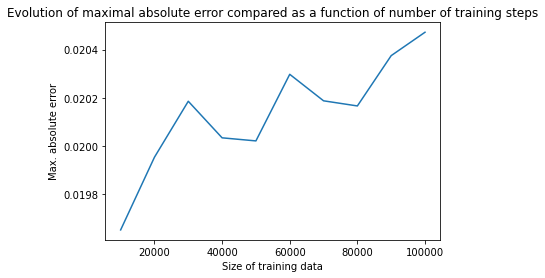

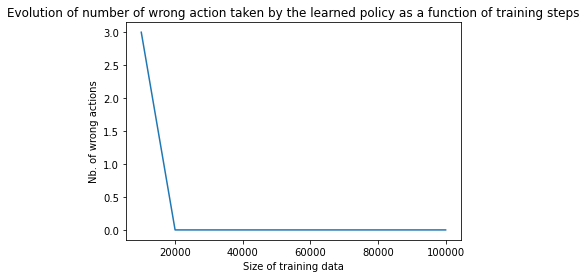


 Wrong actions : 
Optimal policy derived !!


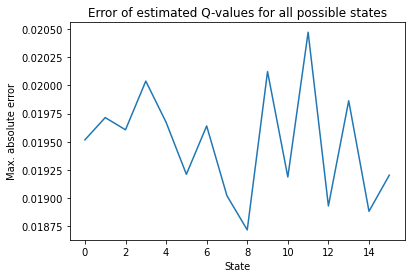


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


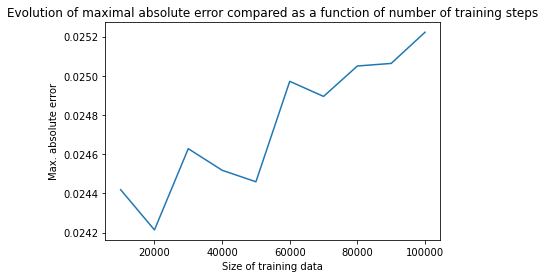

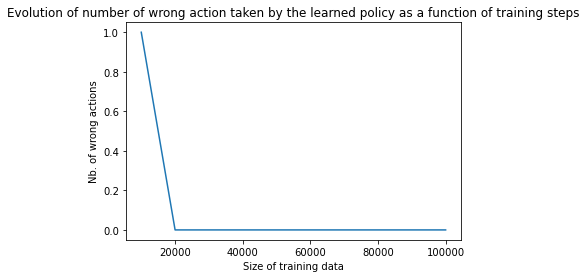


 Wrong actions : 
Optimal policy derived !!


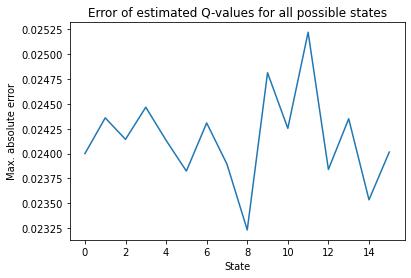


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


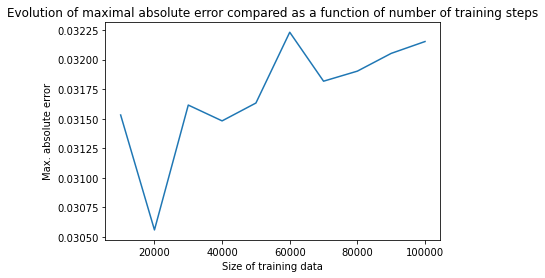

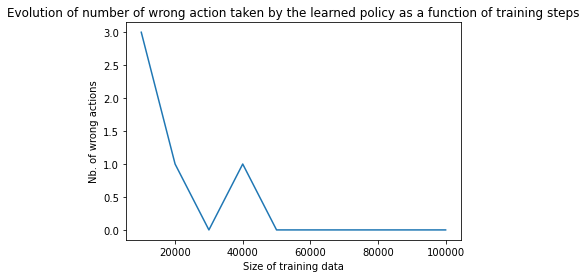


 Wrong actions : 
Optimal policy derived !!


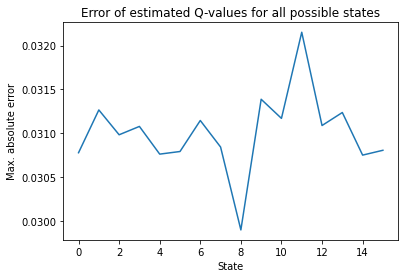


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


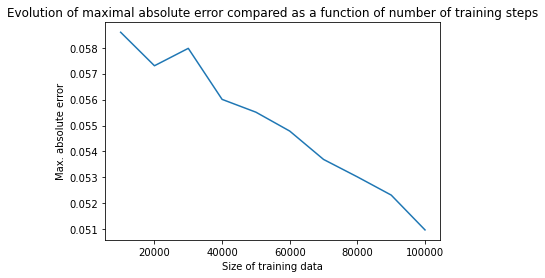

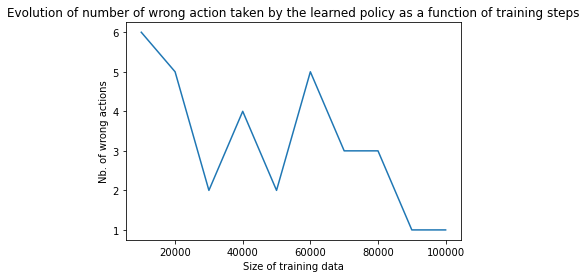


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


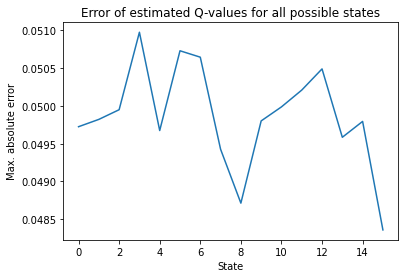


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


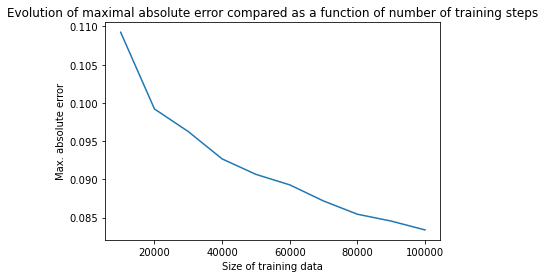

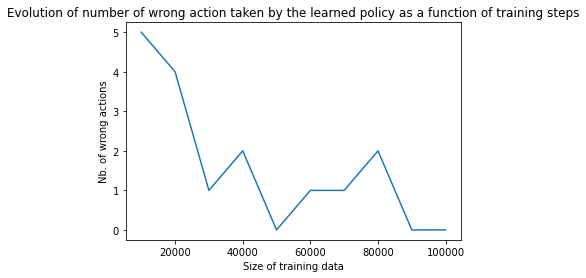


 Wrong actions : 
Optimal policy derived !!


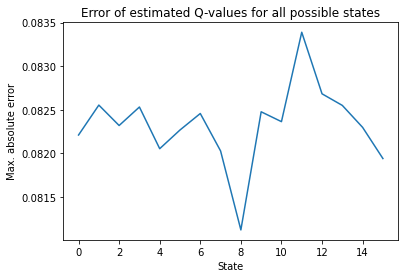


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


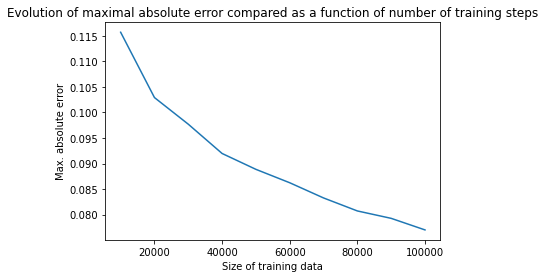

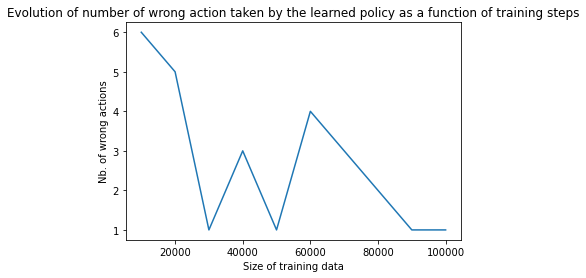


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  5


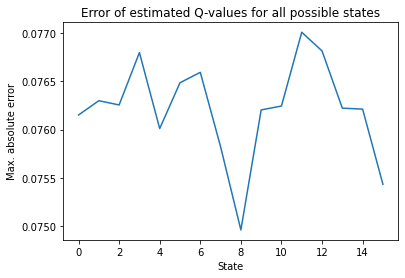


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


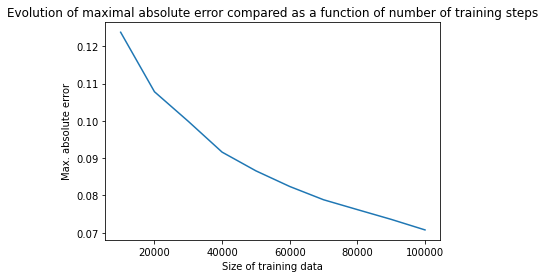

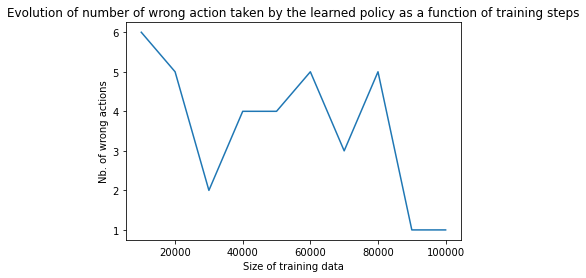


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


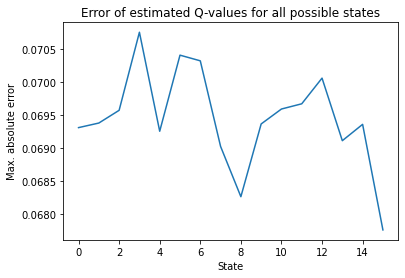


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


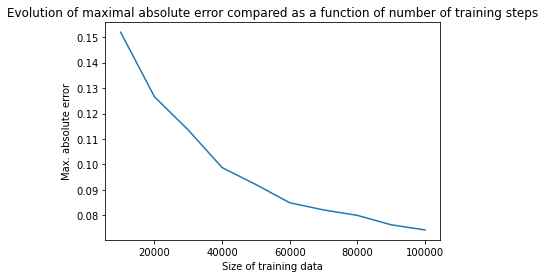

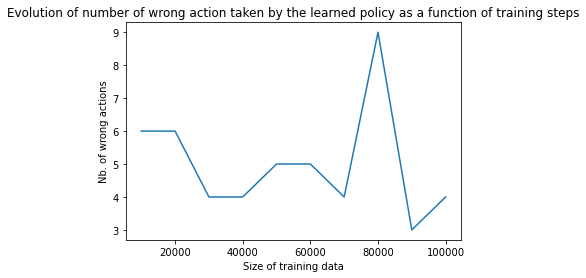


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


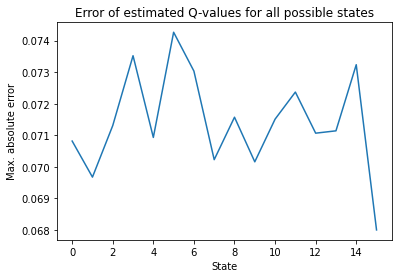


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


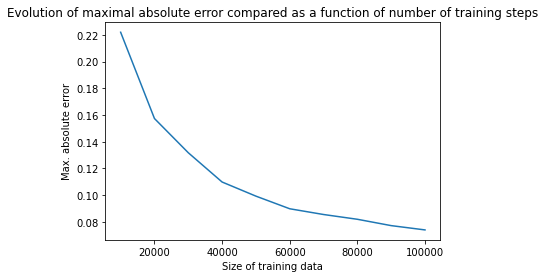

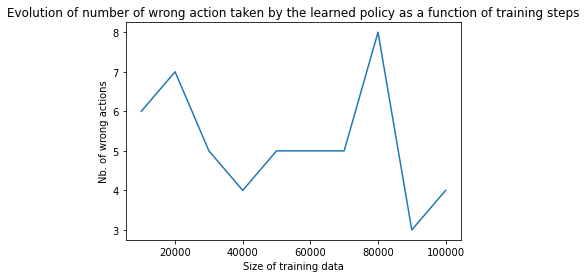


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


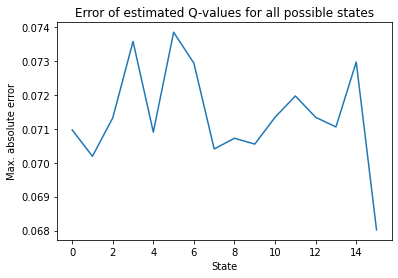


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.9


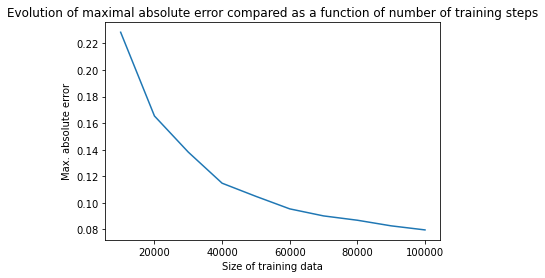

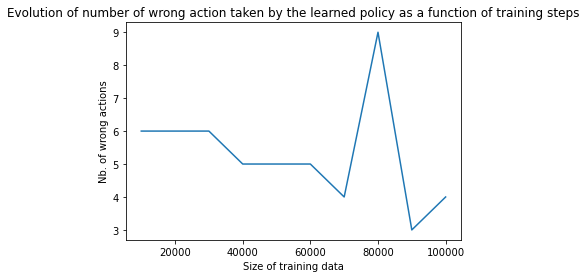


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


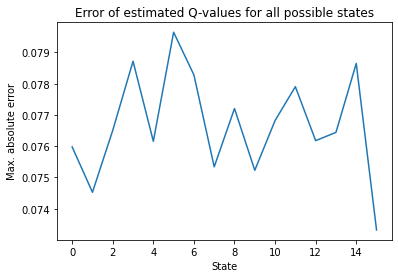


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


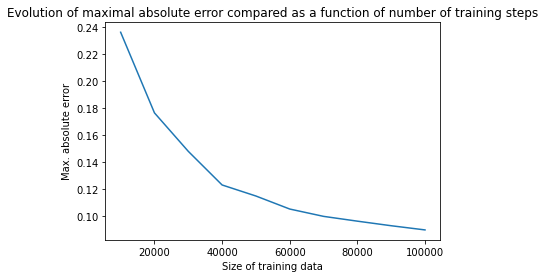

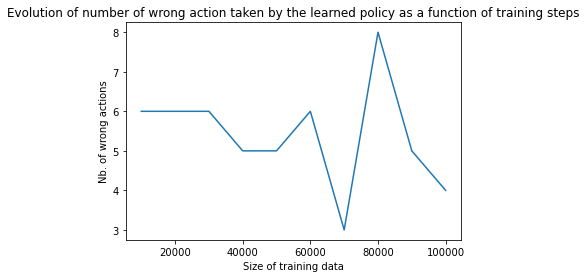


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


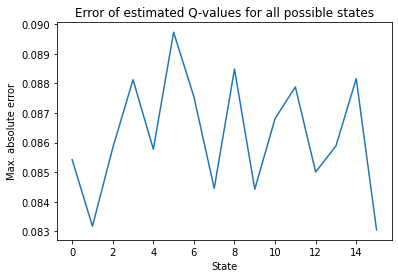


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


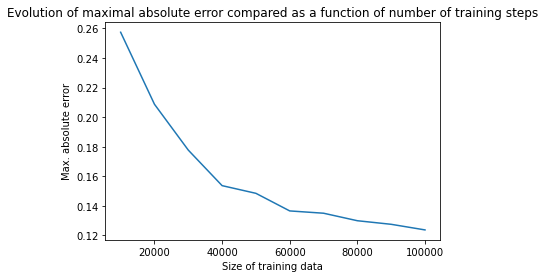

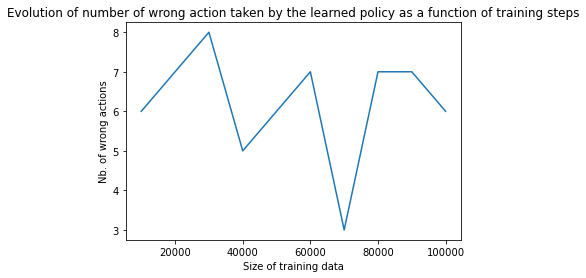


 Wrong actions : 
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  8


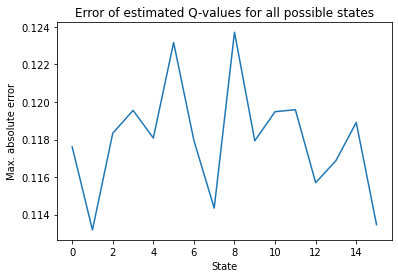

In [31]:
for x in res_corrdel6_w2_adaptlr:
    plot_res_multi_QLearning(x,extend_qtablebin(simplebin_corrdel6,true_qval_corrdel6))

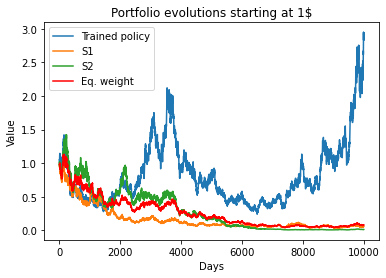

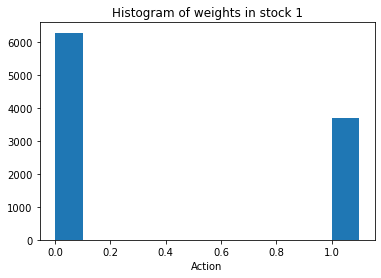

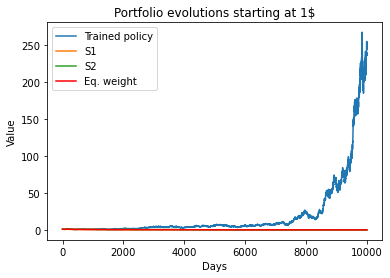

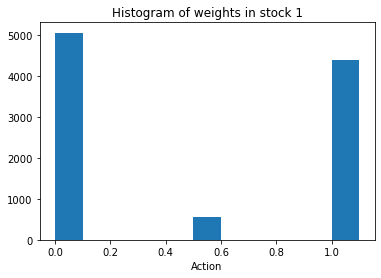

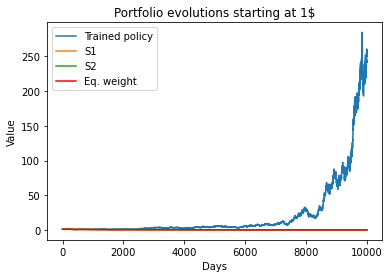

...

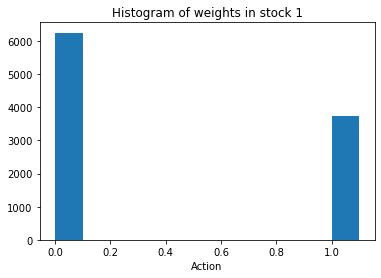

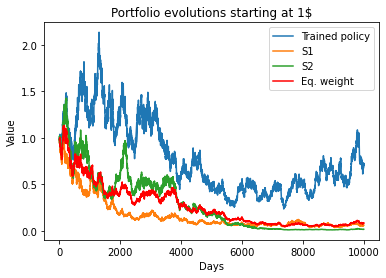

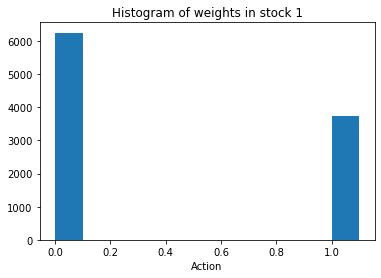

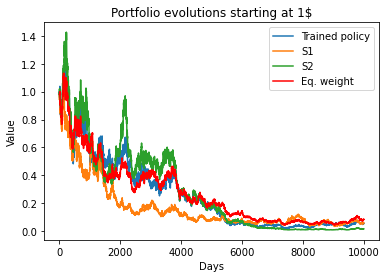

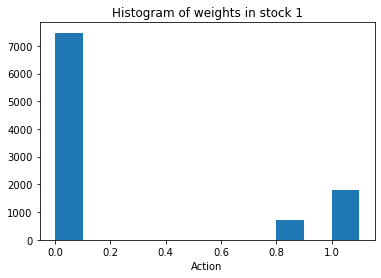

In [49]:
for x in res_corrdel6_w2_adaptlr:
    plot_result(x['exploit_test'])

# Delay by two timesteps 2 with correlation 0.05

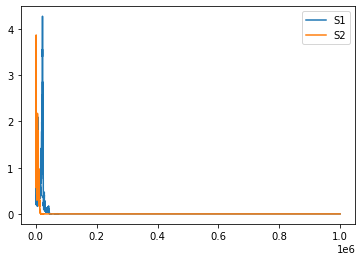

In [32]:
np.random.seed(72349)
rho=0.05
simplebin_corrdel05=SimpleBinomial(1.02,0.98,0.5,corr=rho,delay=2)
Nsample=1000000
ret_corrdel05=simplebin_corrdel05.simulate(Nsample+1)
plt.plot(np.cumprod(ret_corrdel05[0,:]))
plt.plot(np.cumprod(ret_corrdel05[1,:]))
plt.legend(['S1','S2'])
plt.show()

In [33]:
true_qval_corrdel05=simplebin_corrdel05.true_qval(1e-8)

Time needed to converge with delta =  1e-08  :  16


In [34]:
test_ret_corrdel05=simplebin_corrdel05.simulate(Nsim)

### Simple learning rate

In [35]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel05,index=['S1','S2']) ,np.array(test_ret_corrdel05),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_corrdel05)])
            
    res_corrdel05 = pool.map(multi_train_QLearning, params)



 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 1


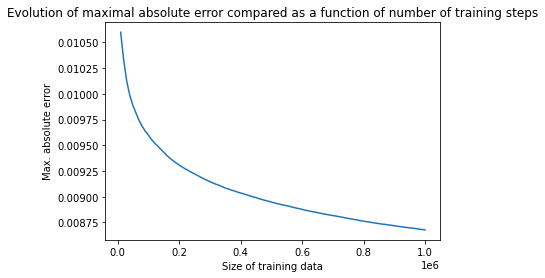

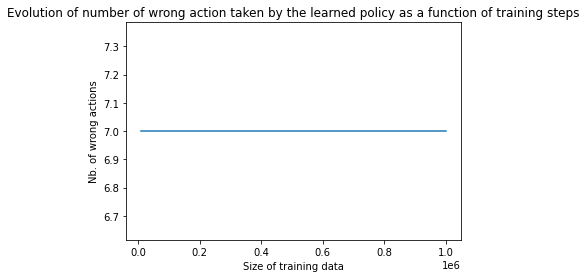


 Wrong actions : 
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[0.98, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  7
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1


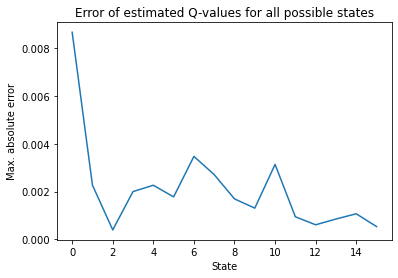


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.9


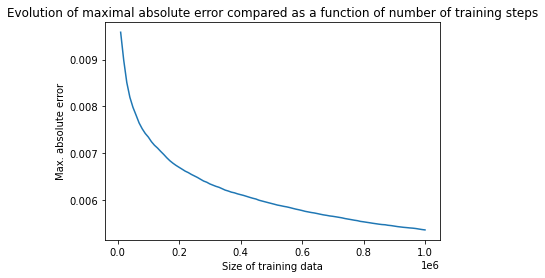

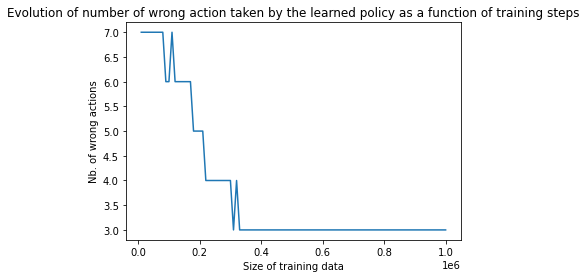


 Wrong actions : 
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  3
[0.98, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0


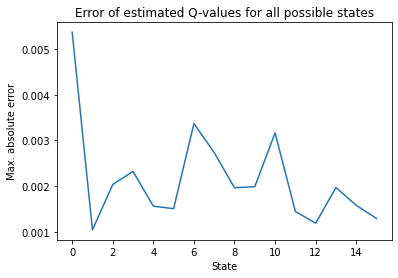


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.8


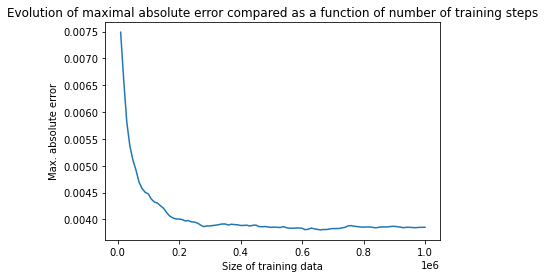

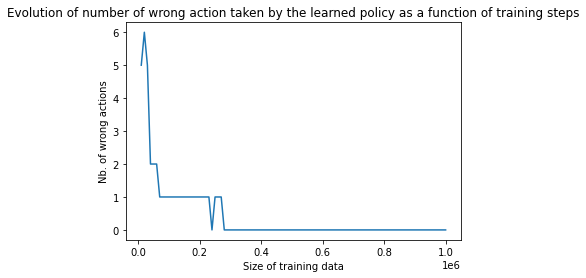


 Wrong actions : 
Optimal policy derived !!


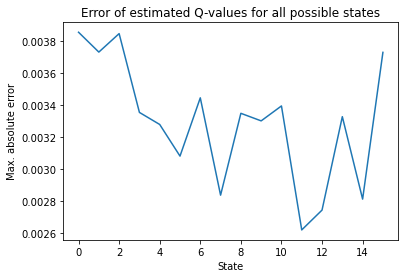


 

Simple learning rate: Decay rate : 1, Beta : 0, Tau : 0.6


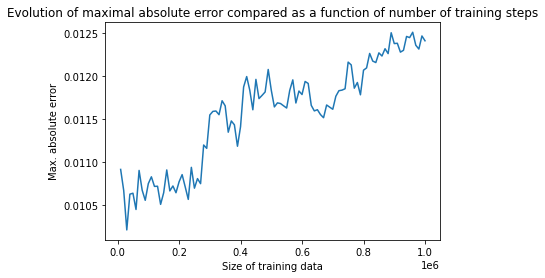

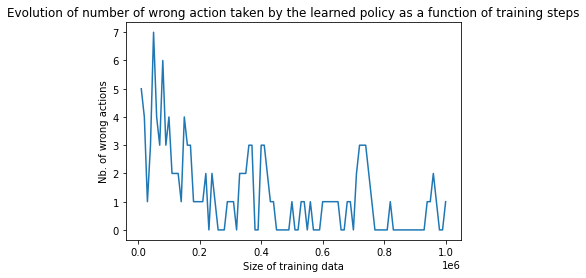


 Wrong actions : 
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1


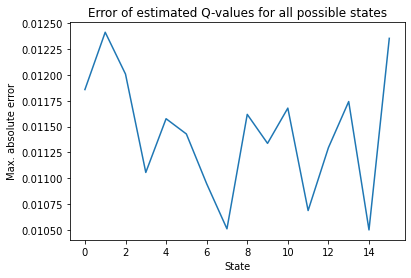


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 1


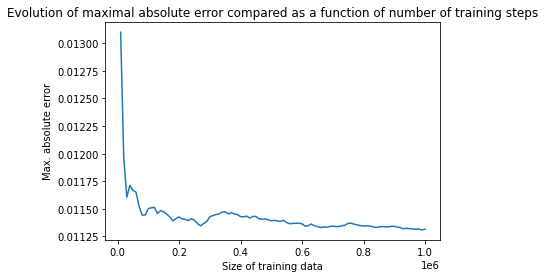

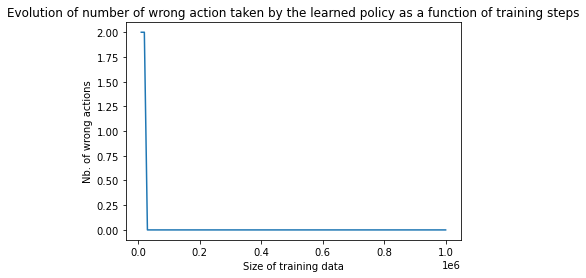


 Wrong actions : 
Optimal policy derived !!


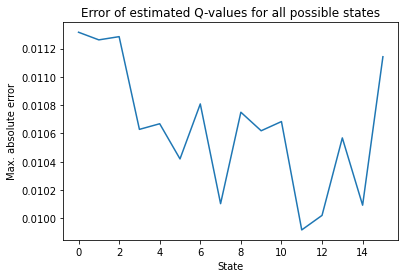


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.9


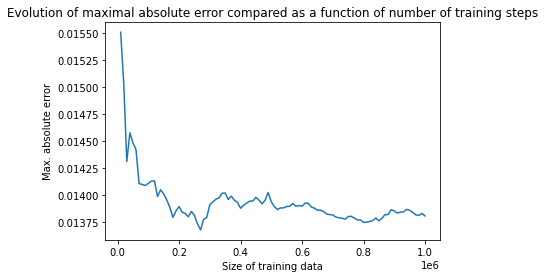

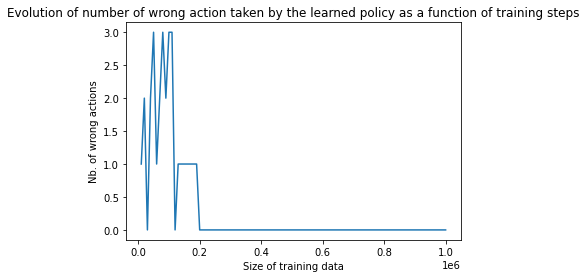


 Wrong actions : 
Optimal policy derived !!


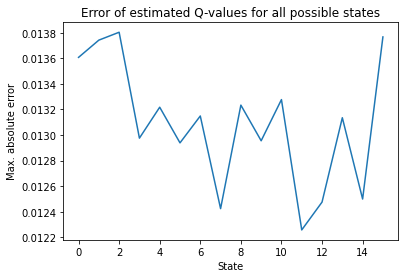


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.8


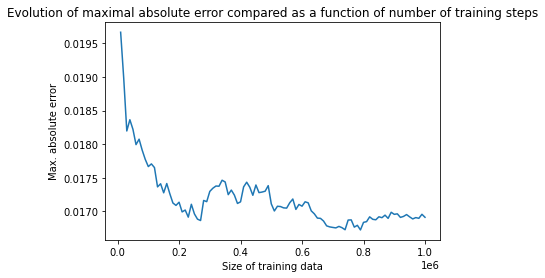

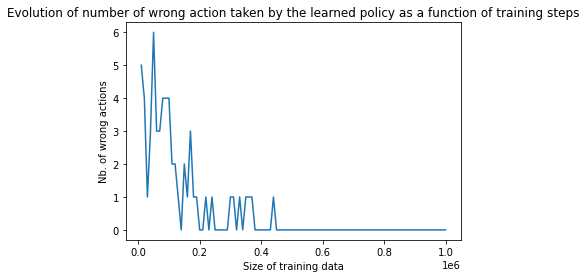


 Wrong actions : 
Optimal policy derived !!


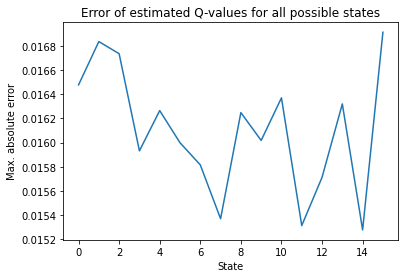


 

Simple learning rate: Decay rate : 0.1, Beta : 0, Tau : 0.6


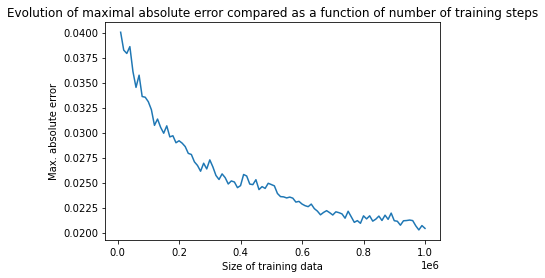

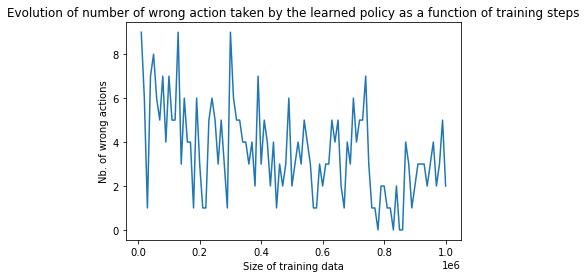


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  9


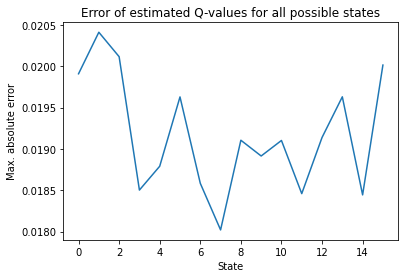


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 1


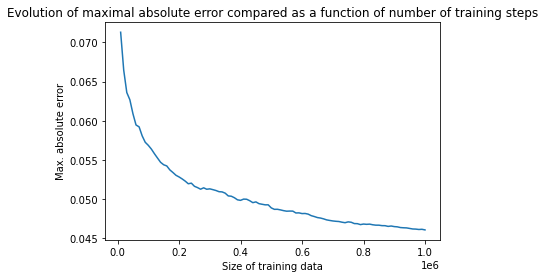

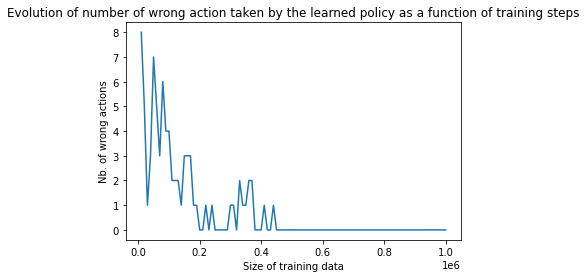


 Wrong actions : 
Optimal policy derived !!


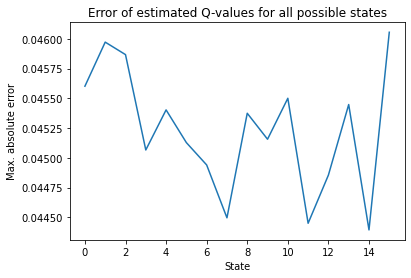


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.9


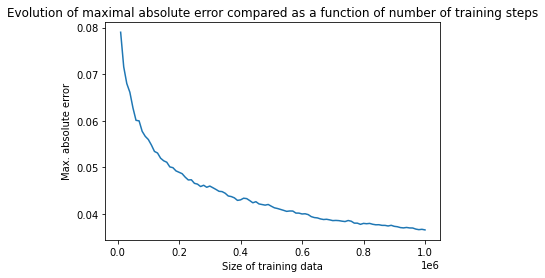

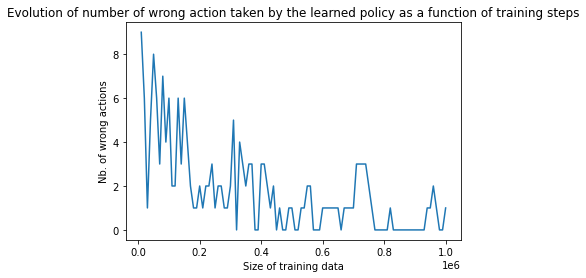


 Wrong actions : 
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1


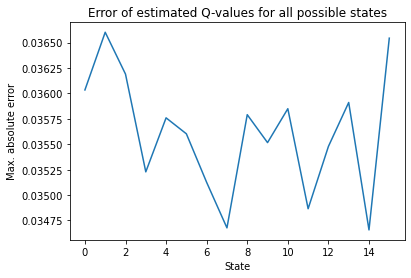


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.8


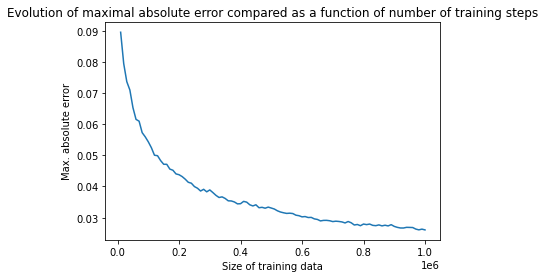

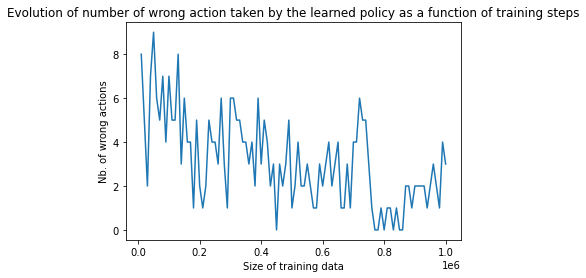


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  6
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  6


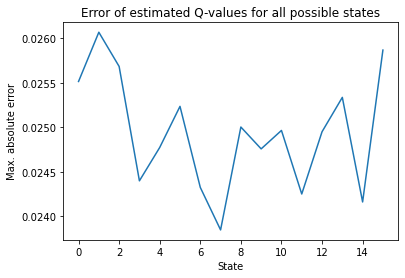


 

Simple learning rate: Decay rate : 0.01, Beta : 0, Tau : 0.6


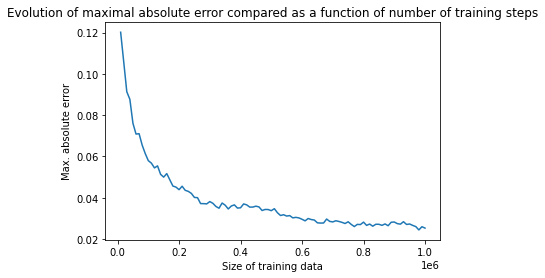

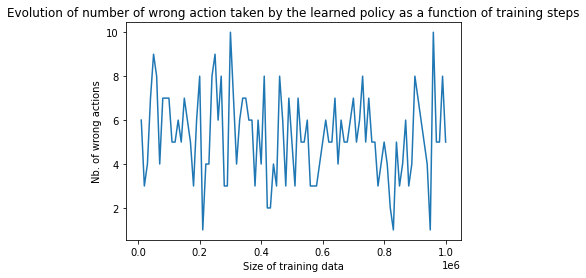


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  9
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  7
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


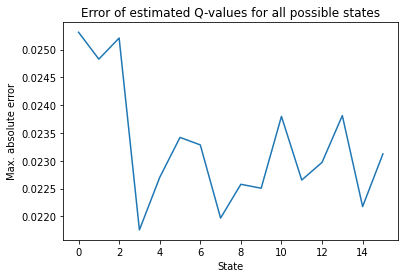


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 1


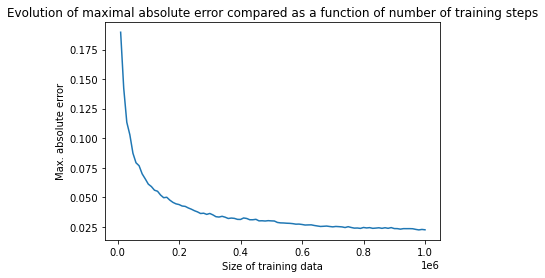

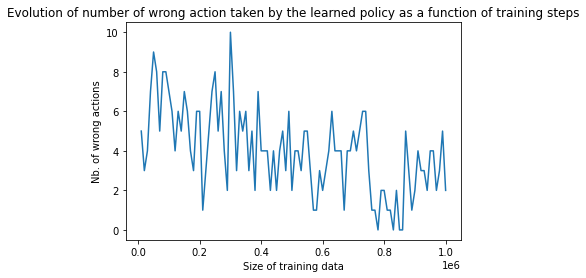


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  9


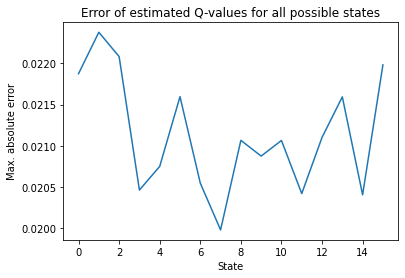


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.9


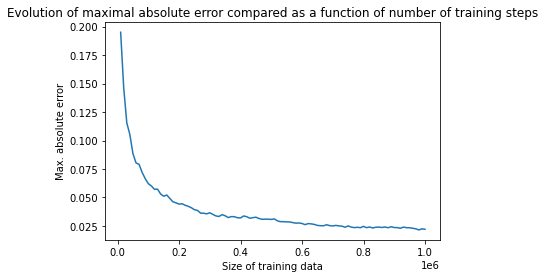

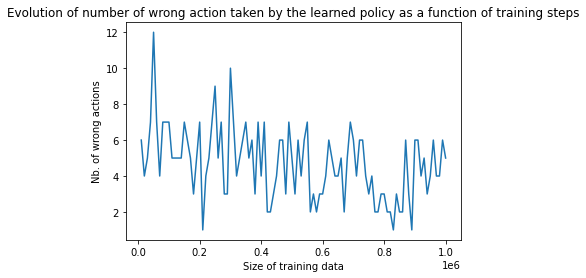


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  4
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


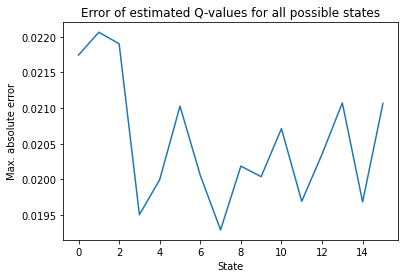


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.8


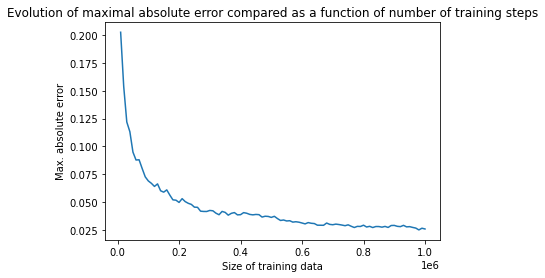

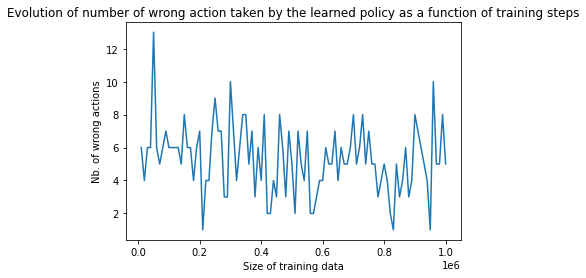


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  9
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  7
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


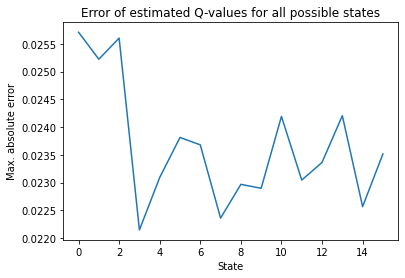


 

Simple learning rate: Decay rate : 0.001, Beta : 0, Tau : 0.6


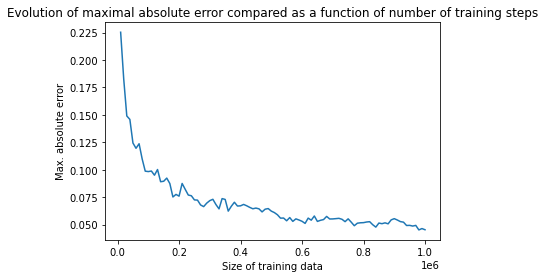

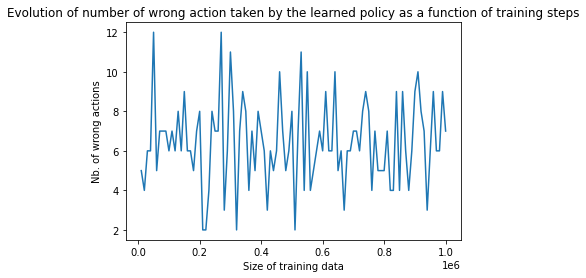


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2


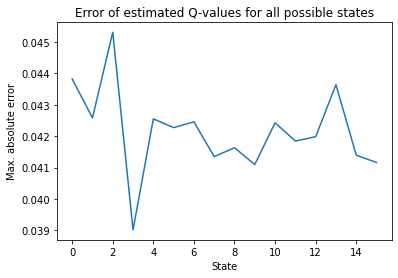

In [36]:
for x in res_corrdel05:
    plot_res_multi_QLearning(x,true_qval_corrdel05)

### Adaptive learning rate

In [37]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [1,0.1,0.01,0.001]:
        for tau in [1,0.9,0.8,0.6]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel05,index=['S1','S2']) ,np.array(test_ret_corrdel05),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_corrdel05,adaptive_lr=True)])
            
    res_corrdel05_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 1


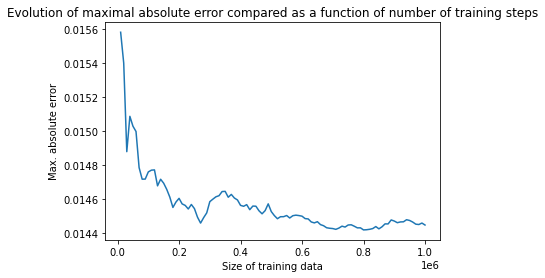

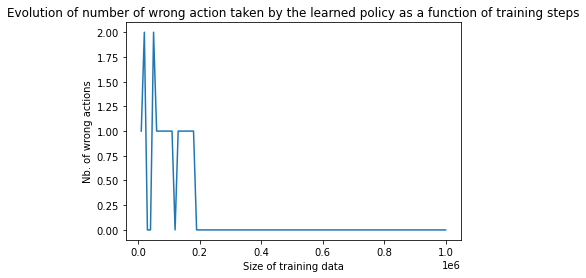


 Wrong actions : 
Optimal policy derived !!


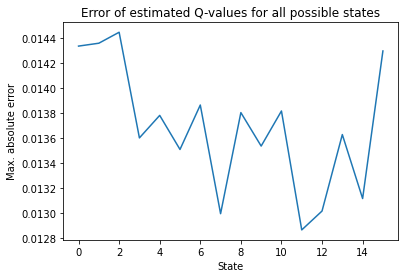


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


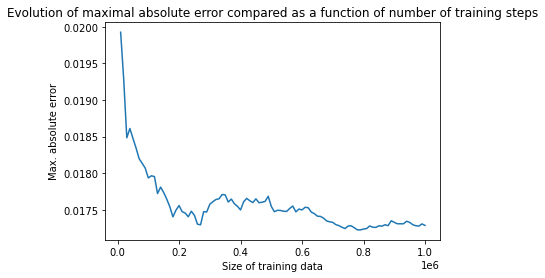

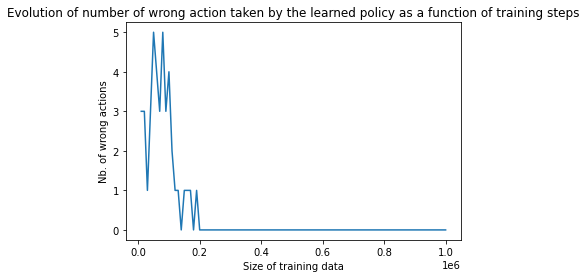


 Wrong actions : 
Optimal policy derived !!


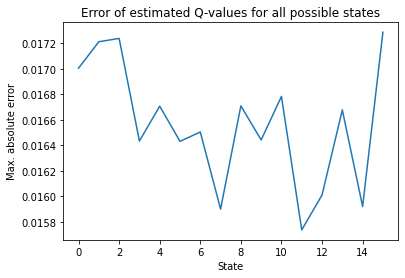


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.8


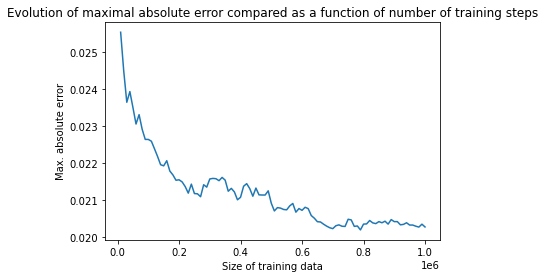

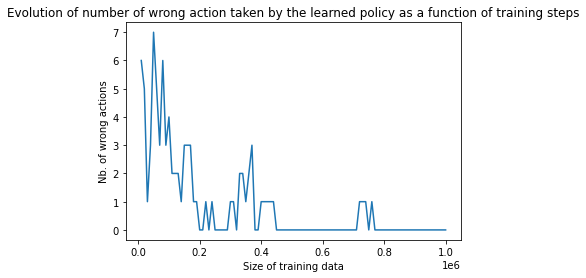


 Wrong actions : 
Optimal policy derived !!


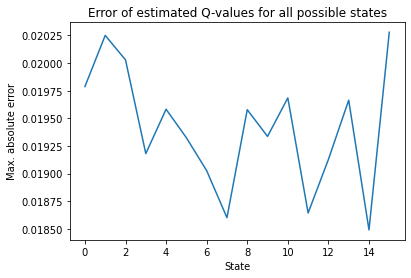


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.6


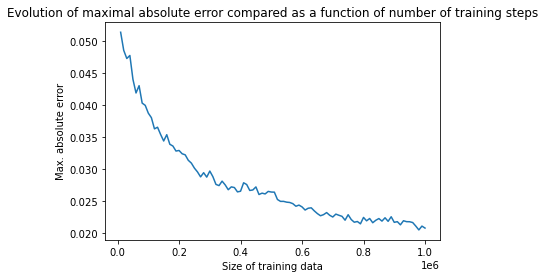

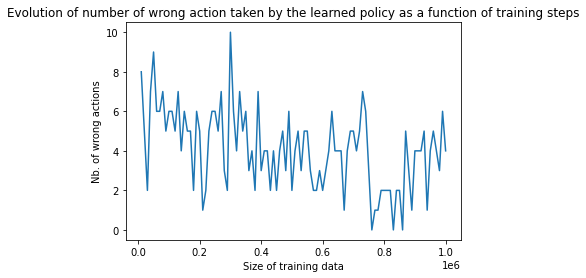


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  2
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


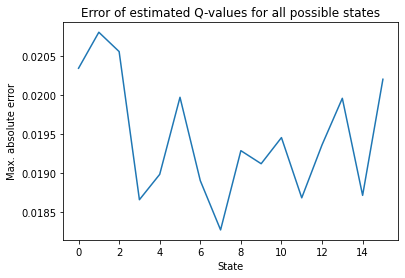


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 1


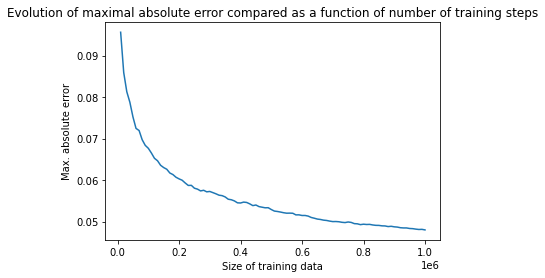

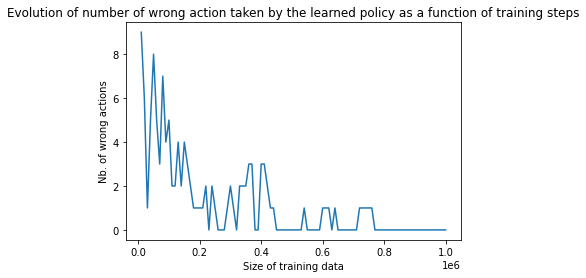


 Wrong actions : 
Optimal policy derived !!


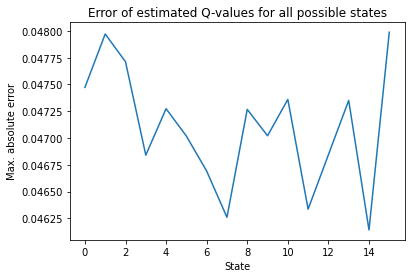


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.9


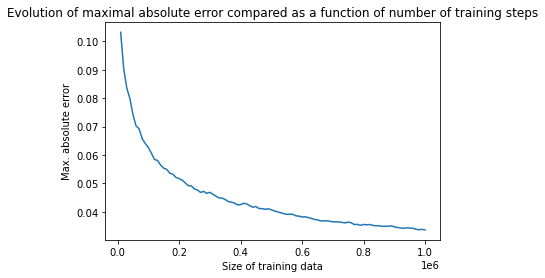

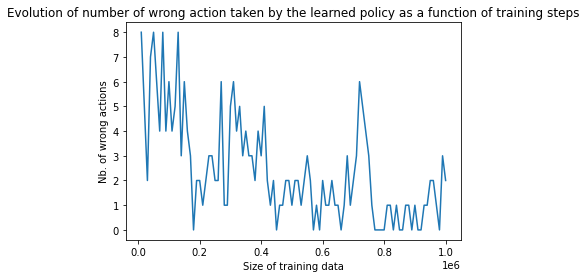


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  3


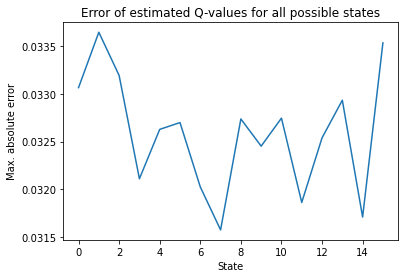


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.8


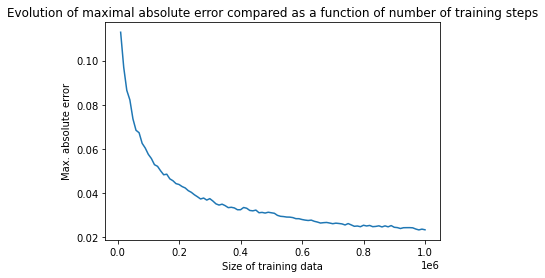

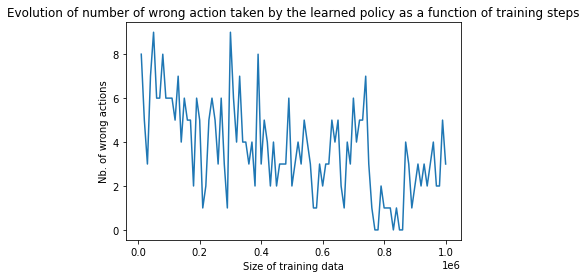


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2
[0.98, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  8


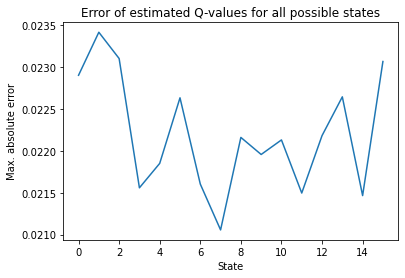


 

Learning rate dependent on states: Decay rate : 0.1, Beta : 0, Tau : 0.6


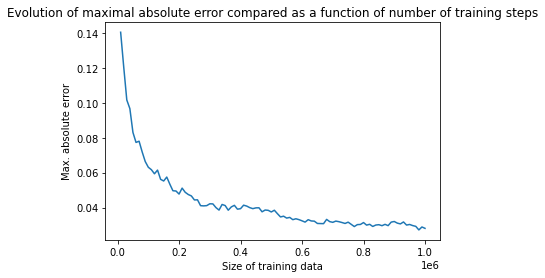

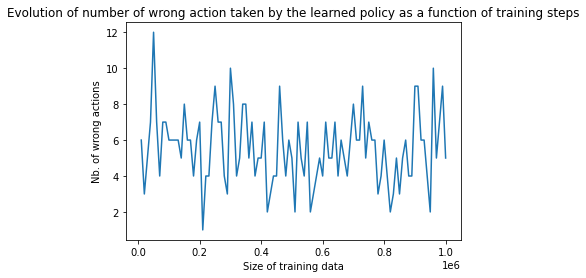


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


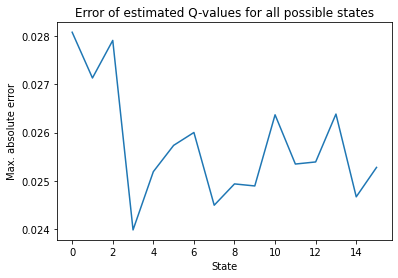


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 1


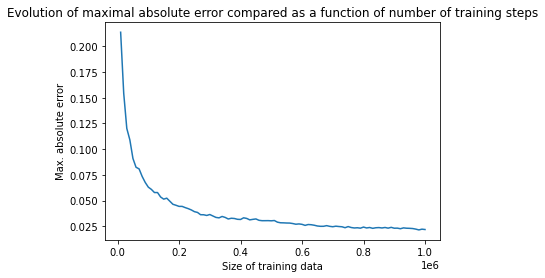

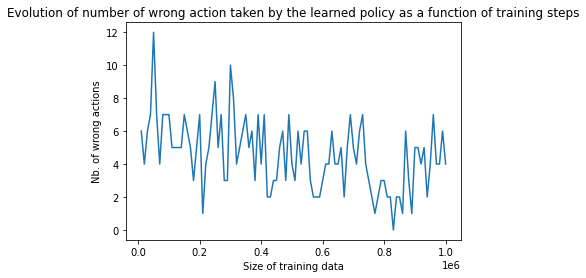


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  3
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  4
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


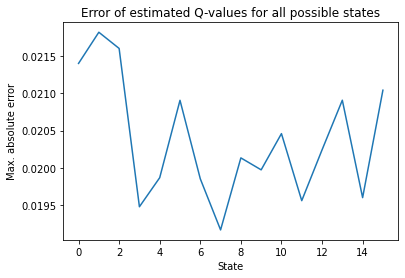


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.9


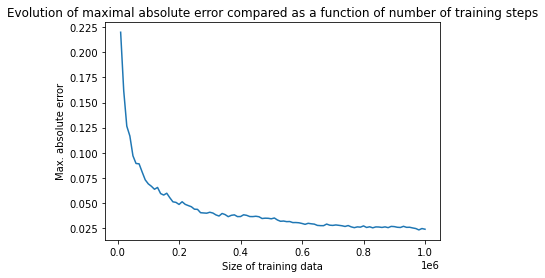

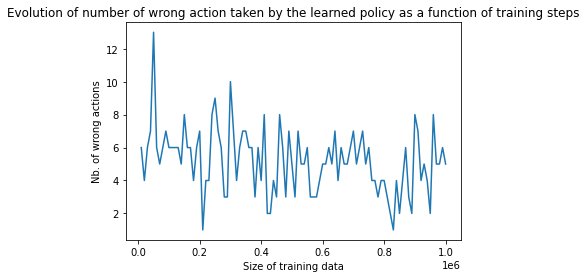


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  5
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


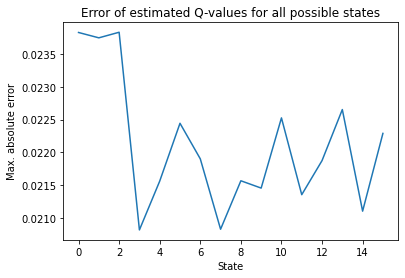


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.8


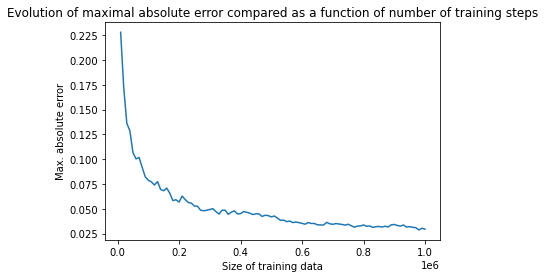

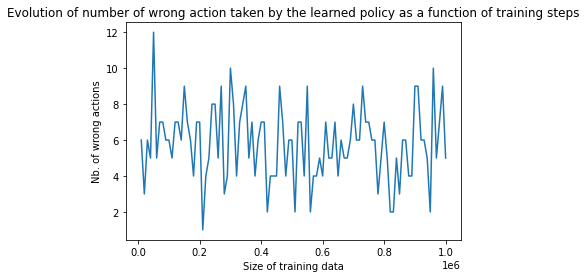


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


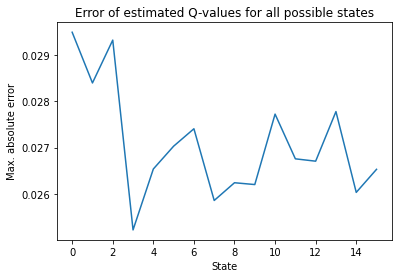


 

Learning rate dependent on states: Decay rate : 0.01, Beta : 0, Tau : 0.6


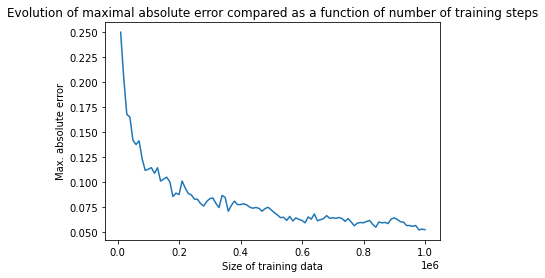

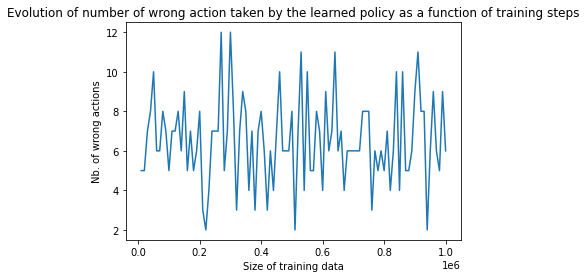


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1


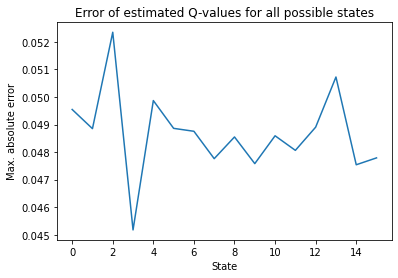


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 1


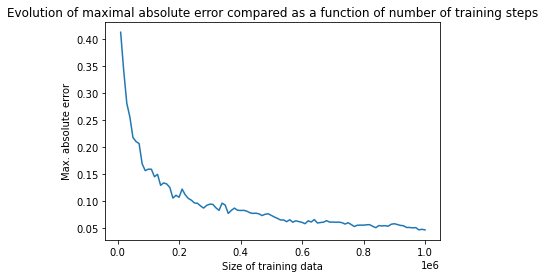

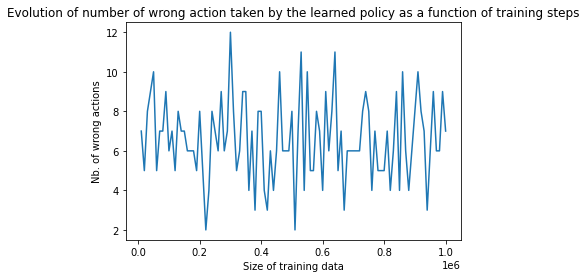


 Wrong actions : 
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  2


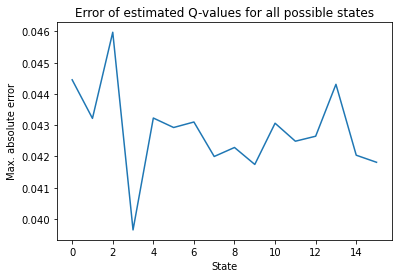


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 0.9


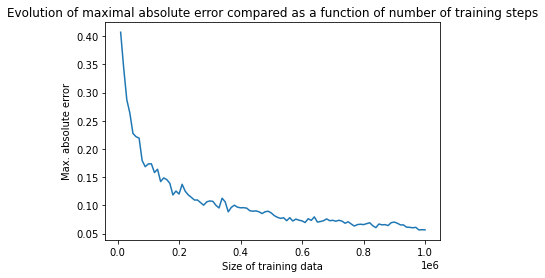

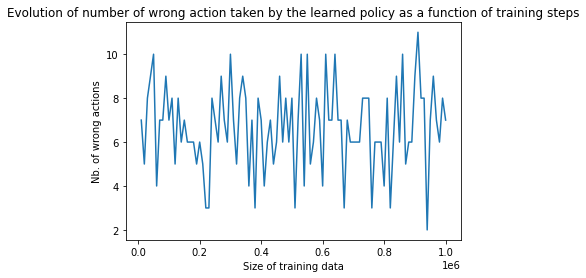


 Wrong actions : 
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  8
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1


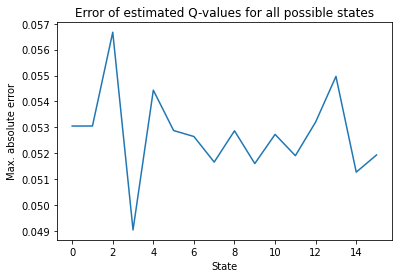


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 0.8


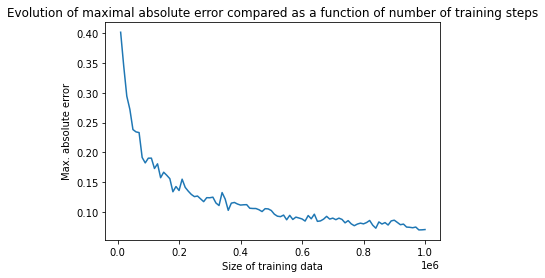

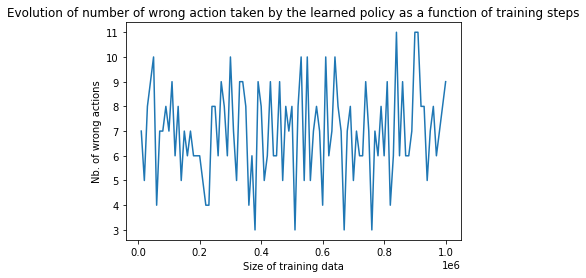


 Wrong actions : 
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 0.98, 1.02] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[0.98, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  3
[1.02, 0.98, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  7
[0.98, 0.98, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10
[1.02, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  1


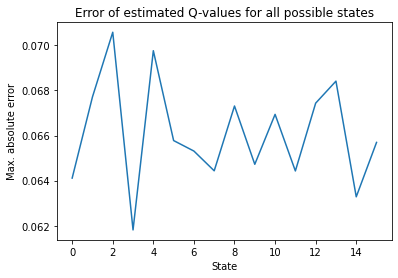


 

Learning rate dependent on states: Decay rate : 0.001, Beta : 0, Tau : 0.6


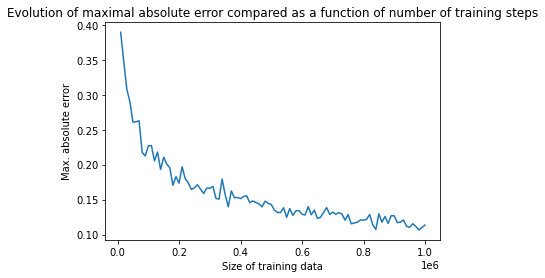

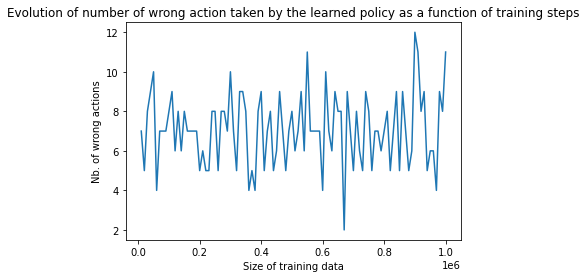


 Wrong actions : 
There are a lot of wrong actions :  11


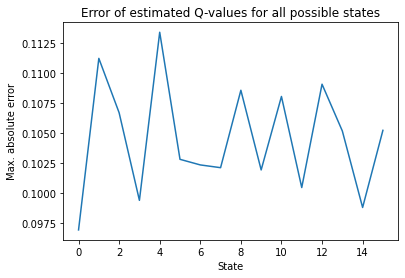

In [38]:
for x in res_corrdel05_adaptlr:
    plot_res_multi_QLearning(x,true_qval_corrdel05)

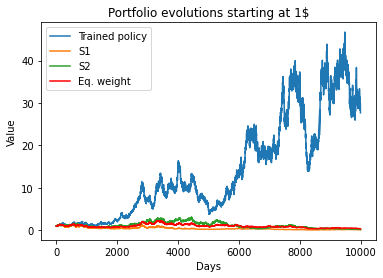

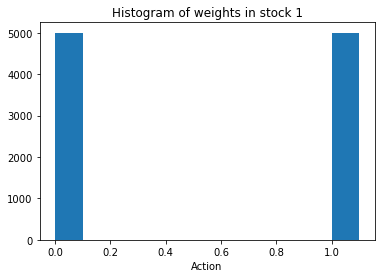

In [50]:
plot_result(res_corrdel05[2]['exploit_test'])

In [60]:
PROCESSES = 6
with multiprocessing.Pool(PROCESSES) as pool:
    params=list()
    for decay_rate in [10,1]:
        for tau in [0.95,0.9,0.85]:
            params.extend([create_param_QLearning(pd.DataFrame(ret_corrdel05,index=['S1','S2']) ,np.array(test_ret_corrdel05),  window=2, decay_rate=decay_rate,tau=tau,true_qval = true_qval_corrdel05,adaptive_lr=True)])
            
    res_corrdel05_larger_adaptlr = pool.map(multi_train_QLearning, params)



 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.95


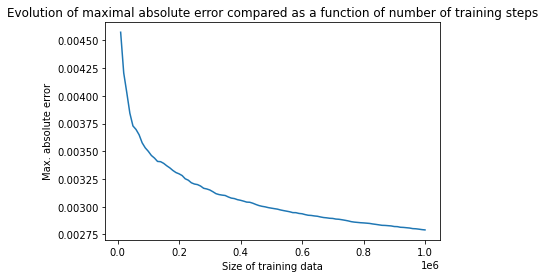

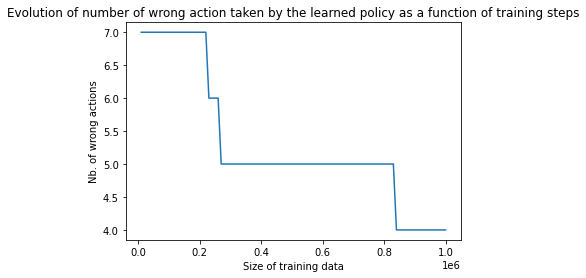


 Wrong actions : 
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[0.98, 1.02, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[0.98, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  0
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  10


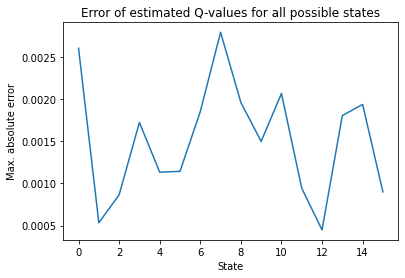


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.9


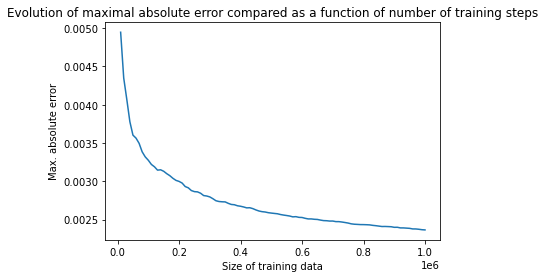

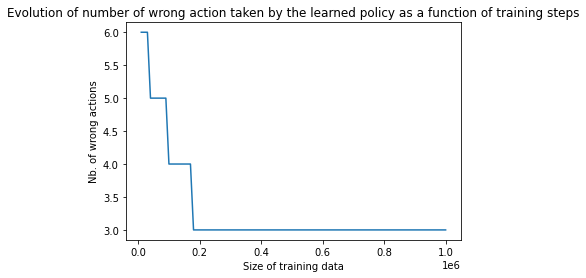


 Wrong actions : 
[0.98, 0.98, 1.02, 1.02] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  4
[0.98, 1.02, 1.02, 0.98] ; Action from discrete policy :  10 ; Action from Q-Learning algorithm :  9
[1.02, 1.02, 0.98, 0.98] ; Action from discrete policy :  0 ; Action from Q-Learning algorithm :  1


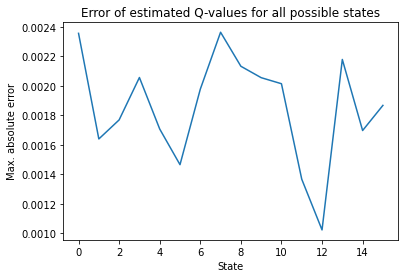


 

Learning rate dependent on states: Decay rate : 10, Beta : 0, Tau : 0.85


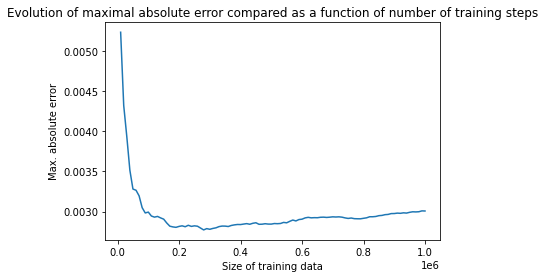

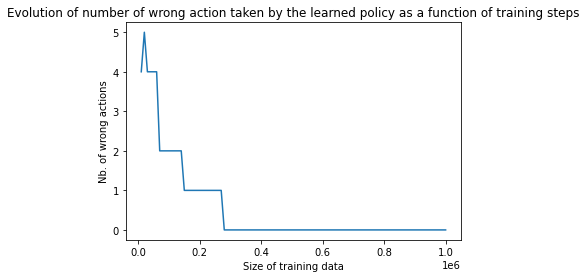


 Wrong actions : 
Optimal policy derived !!


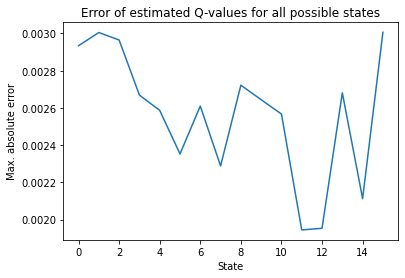


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.95


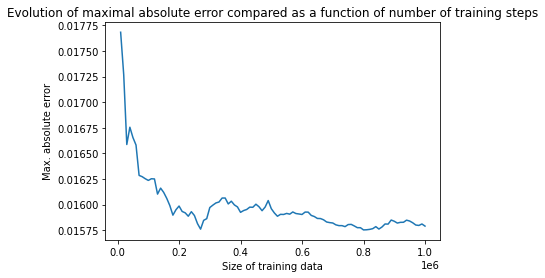

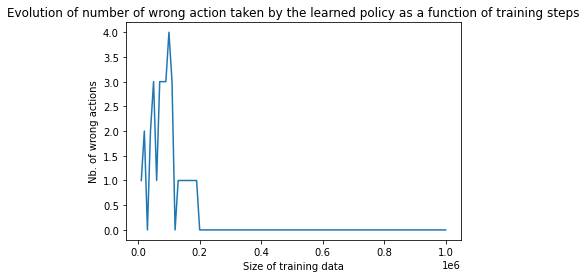


 Wrong actions : 
Optimal policy derived !!


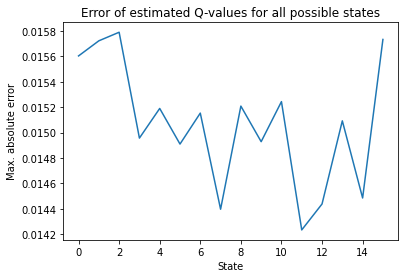


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.9


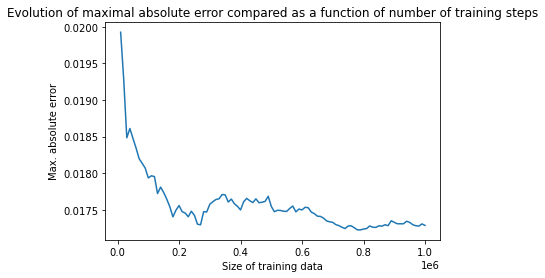

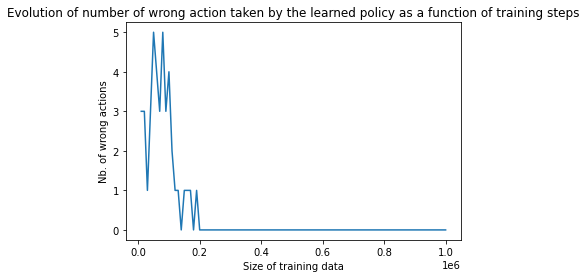


 Wrong actions : 
Optimal policy derived !!


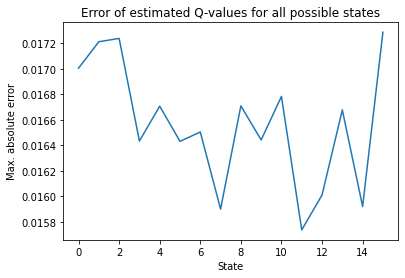


 

Learning rate dependent on states: Decay rate : 1, Beta : 0, Tau : 0.85


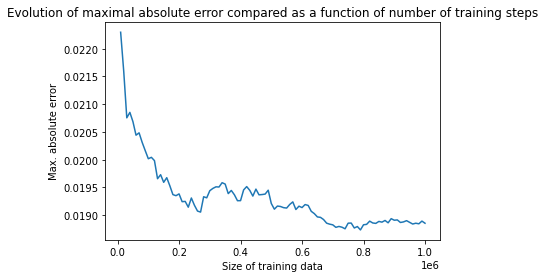

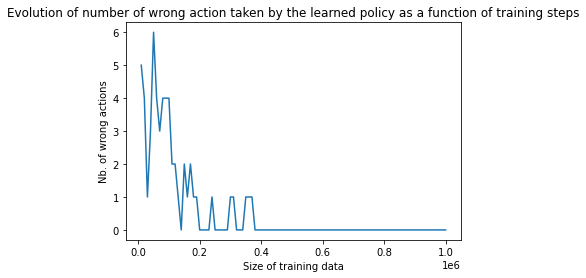


 Wrong actions : 
Optimal policy derived !!


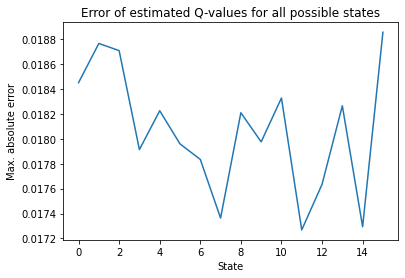

In [61]:
for x in res_corrdel05_larger_adaptlr:
    plot_res_multi_QLearning(x,true_qval_corrdel05)

## Optimal policy derived for some choices of parameters

#### Simple learning rate:
\begin{equation*}
\alpha_t = \frac{1}{1+t^{0.8}}, \quad \forall t\geq 0
\end{equation*}

#### Adaptive learning rate:
\begin{equation*}
\alpha_t(s) = \frac{1}{1+( 10\cdot n_t(s))^{0.85}}, \quad \forall t\geq 0, \ \forall s\in \mathcal{S}
\end{equation*}

Both these choices lead to similar maximal absolute error.